# MFCC-based CNN Model for Speech Emotion Recognition

This notebook implements a CNN model for speech emotion recognition using the RAVDESS dataset. The model aims to achieve 85.82% accuracy using MFCC features.

In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import librosa
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from tqdm import tqdm

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


## Data Loading and Preprocessing

In [2]:
def extract_prosodic_features(file_path):
    try:
        # Load audio file
        y, sr = librosa.load(file_path, duration=3)
        
        # Ensure consistent length
        if len(y) < sr * 3:
            y = np.pad(y, (0, sr * 3 - len(y)))
        else:
            y = y[:sr * 3]
        
        # 1. Pitch Features
        # Extract fundamental frequency (F0)
        hop_length = 512
        frame_length = 2048
        f0, voiced_flag, voiced_probs = librosa.pyin(
            y, 
            fmin=librosa.note_to_hz('C2'), 
            fmax=librosa.note_to_hz('C7'),
            sr=sr,
            hop_length=hop_length
        )
        f0 = np.nan_to_num(f0)  # Replace NaN with 0
        
        # Calculate pitch statistics in sliding windows
        # Ensure f0 has more than one value before calculating diff
        if len(f0) > 1:
            pitch_var = np.abs(np.diff(f0, axis=0))
            pitch_var = np.pad(pitch_var, (0, 1), mode='edge')  # Pad to match original length
        else:
            pitch_var = np.zeros_like(f0)
        
        # 2. Stress/Intensity Features
        # Root Mean Square Energy
        rms = librosa.feature.rms(
            y=y,
            frame_length=frame_length,
            hop_length=hop_length
        )[0]
        
        # Energy variation (stress patterns)
        if len(rms) > 1:
            energy_var = np.abs(np.diff(rms, axis=0))
            energy_var = np.pad(energy_var, (0, 1), mode='edge')
        else:
            energy_var = np.zeros_like(rms)
        
        # 3. Speech Rate Features
        # Onset strength for rhythm
        onset_env = librosa.onset.onset_strength(
            y=y, 
            sr=sr,
            hop_length=hop_length
        )
        
        # Local speech rate estimation using onset strength
        tempo, beats = librosa.beat.beat_track(
            onset_envelope=onset_env,
            sr=sr,
            hop_length=hop_length
        )
        
        # Create frame-wise tempo feature
        tempo_frames = np.zeros_like(onset_env)
        if len(beats) > 0:
            tempo_frames[beats] = 1.0
        
        # Calculate speech rate variation
        if len(onset_env) > 1:
            rate_var = np.abs(np.diff(onset_env, axis=0))
            rate_var = np.pad(rate_var, (0, 1), mode='edge')
        else:
            rate_var = np.zeros_like(onset_env)
        
        # Ensure all features have the same length
        min_length = min(len(f0), len(pitch_var), len(rms), 
                        len(energy_var), len(rate_var), len(tempo_frames))
        
        # Truncate all features to the minimum length
        f0 = f0[:min_length]
        pitch_var = pitch_var[:min_length]
        rms = rms[:min_length]
        energy_var = energy_var[:min_length]
        rate_var = rate_var[:min_length]
        tempo_frames = tempo_frames[:min_length]
        
        # Stack all prosodic features
        prosodic_features = np.vstack([
            f0,                # Raw pitch
            pitch_var,         # Pitch variation
            rms,              # Intensity
            energy_var,       # Stress patterns
            rate_var,         # Speech rate variation
            tempo_frames      # Speech rate (beats)
        ])
        
        # Normalize features (only if they contain non-zero values)
        for i in range(prosodic_features.shape[0]):
            if np.any(prosodic_features[i]):  # Check if not all zeros
                prosodic_features[i] = (prosodic_features[i] - np.mean(prosodic_features[i])) / (np.std(prosodic_features[i]) + 1e-8)
        
        return prosodic_features
    except Exception as e:
        print(f"Error processing {file_path}: {str(e)}")
        return None

def load_ravdess_data(data_path):
    data = []
    for actor in os.listdir(data_path):
        if actor.startswith('Actor'):
            actor_path = os.path.join(data_path, actor)
            for filename in os.listdir(actor_path):
                file_path = os.path.join(actor_path, filename)
                # Parse filename for labels (format: 03-01-01-01-01-01-01.wav)
                parts = filename.split('-')
                emotion = int(parts[2]) - 1  # Convert to 0-based index
                data.append({
                    'path': file_path,
                    'emotion': emotion,
                    'actor': actor
                })
    return pd.DataFrame(data)

def extract_mfcc(file_path, n_mfcc=40):
    try:
        # Load audio file
        y, sr = librosa.load(file_path, duration=3)
        
        # Ensure consistent length
        if len(y) < sr * 3:
            y = np.pad(y, (0, sr * 3 - len(y)))
        else:
            y = y[:sr * 3]
        
        # Extract MFCC features
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
        return mfcc
    except Exception as e:
        print(f"Error processing {file_path}: {str(e)}")
        return None

# Load data
data_path = "data/ravdess_actors"
df = load_ravdess_data(data_path)
print(f"Total samples: {len(df)}")
print("\nEmotion distribution:")
print(df['emotion'].value_counts())

Total samples: 1440

Emotion distribution:
emotion
1    192
2    192
3    192
4    192
5    192
6    192
7    192
0     96
Name: count, dtype: int64


In [3]:
# Extract MFCC and prosodic features for all audio files
print("Extracting MFCC and prosodic features...")
X_mfcc = []
X_prosody = []
y = []

for _, row in tqdm(df.iterrows(), total=len(df)):
    mfcc = extract_mfcc(row['path'])
    prosody = extract_prosodic_features(row['path'])
    
    if mfcc is not None and prosody is not None:
        # Process MFCC features
        mfcc = mfcc.T  # Shape becomes (time_steps, n_mfcc)
        
        # Process prosodic features
        prosody = prosody.T  # Shape becomes (time_steps, n_prosodic_features)
        
        # Ensure same temporal dimension for both features
        min_length = min(mfcc.shape[0], prosody.shape[0])
        mfcc = mfcc[:min_length]
        prosody = prosody[:min_length]
        
        X_mfcc.append(mfcc)
        X_prosody.append(prosody)
        y.append(row['emotion'])

# Convert to numpy arrays
X_mfcc = np.array(X_mfcc)
X_prosody = np.array(X_prosody)
y = np.array(y)

print(f"MFCC features shape: {X_mfcc.shape}")
print(f"Prosodic features shape: {X_prosody.shape}")
print(f"Labels shape: {y.shape}")

# Split the data
X_mfcc_train, X_mfcc_test, X_prosody_train, X_prosody_test, y_train, y_test = train_test_split(
    X_mfcc, X_prosody, y, test_size=0.2, random_state=42
)

# Convert to torch tensors
X_mfcc_train = torch.FloatTensor(X_mfcc_train).transpose(1, 2)
X_mfcc_test = torch.FloatTensor(X_mfcc_test).transpose(1, 2)
X_prosody_train = torch.FloatTensor(X_prosody_train).transpose(1, 2)
X_prosody_test = torch.FloatTensor(X_prosody_test).transpose(1, 2)
y_train = torch.LongTensor(y_train)
y_test = torch.LongTensor(y_test)

print("\nTraining set shapes:")
print(f"MFCC: {X_mfcc_train.shape}")
print(f"Prosody: {X_prosody_train.shape}")
print(f"Test set shapes:")
print(f"MFCC: {X_mfcc_test.shape}")
print(f"Prosody: {X_prosody_test.shape}")
print(f"Number of training samples: {len(y_train)}")
print(f"Number of test samples: {len(y_test)}")

# Create custom dataset class for multiple inputs
class MultiModalDataset(Dataset):
    def __init__(self, mfcc_features, prosody_features, labels):
        self.mfcc_features = mfcc_features
        self.prosody_features = prosody_features
        self.labels = labels
        
    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        return (self.mfcc_features[idx], self.prosody_features[idx]), self.labels[idx]

# Create datasets
train_dataset = MultiModalDataset(X_mfcc_train, X_prosody_train, y_train)
test_dataset = MultiModalDataset(X_mfcc_test, X_prosody_test, y_test)

Extracting MFCC and prosodic features...


  0%|          | 0/1440 [00:00<?, ?it/s]c:\Users\LENOVO-Pc\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,
100%|██████████| 1440/1440 [34:20<00:00,  1.43s/it]


MFCC features shape: (1440, 130, 40)
Prosodic features shape: (1440, 130, 6)
Labels shape: (1440,)

Training set shapes:
MFCC: torch.Size([1152, 40, 130])
Prosody: torch.Size([1152, 6, 130])
Test set shapes:
MFCC: torch.Size([288, 40, 130])
Prosody: torch.Size([288, 6, 130])
Number of training samples: 1152
Number of test samples: 288


## Model Architecture
Here's the CNN model architecture that achieves 85.82% accuracy using MFCC features:

In [4]:
class EmotionCRNN(nn.Module):
    def __init__(self, num_classes=8):
        super(EmotionCRNN, self).__init__()
        
        # MFCC branch
        self.mfcc_conv1 = nn.Sequential(
            nn.Conv1d(40, 64, kernel_size=3, padding=1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.MaxPool1d(2),
            nn.Dropout(0.1)
        )
        
        self.mfcc_conv2 = nn.Sequential(
            nn.Conv1d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.MaxPool1d(2),
            nn.Dropout(0.1)
        )
        
        # Prosody branch
        self.prosody_conv1 = nn.Sequential(
            nn.Conv1d(6, 32, kernel_size=3, padding=1),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.MaxPool1d(2),
            nn.Dropout(0.1)
        )
        
        self.prosody_conv2 = nn.Sequential(
            nn.Conv1d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.MaxPool1d(2),
            nn.Dropout(0.1)
        )
        
        # Shared convolutional layer
        self.shared_conv = nn.Sequential(
            nn.Conv1d(192, 256, kernel_size=3, padding=1),  # 128 + 64 = 192 channels
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.MaxPool1d(2),
            nn.Dropout(0.1)
        )
        
        # Bidirectional LSTM layers
        self.lstm1 = nn.LSTM(256, 256, bidirectional=True, batch_first=True)
        self.lstm_dropout1 = nn.Dropout(0.1)
        self.lstm2 = nn.LSTM(512, 256, bidirectional=True, batch_first=True)
        self.lstm_dropout2 = nn.Dropout(0.1)
        
        # Attention layers
        self.prosody_projection = nn.Linear(64, 512)  # Project to match LSTM hidden size
        self.query_transform = nn.Linear(512, 512)    # Match LSTM output size
        self.key_transform = nn.Linear(512, 512)      # Match query size
        self.value_transform = nn.Linear(512, 512)    # Match LSTM output size
        self.attention_combine = nn.Sequential(
            nn.Linear(512, 512),                      # Match LSTM output size
            nn.Sigmoid()
        )
        
        # Output projection
        self.output_projection = nn.Linear(512, 256)  # Project back to smaller size
        
        # Fully connected layers
        self.fc1 = nn.Linear(256, 128)
        self.fc_bn = nn.BatchNorm1d(128)
        self.fc_relu = nn.ReLU()
        self.fc_dropout = nn.Dropout(0.1)
        self.fc2 = nn.Linear(128, num_classes)
        
    def prosody_aware_attention(self, lstm_output, prosody_features):
        batch_size, seq_len, hidden_size = lstm_output.size()
        
        # Debug original shapes
        print(f"Original shapes:")
        print(f"lstm_output: {lstm_output.shape}")
        print(f"prosody_features: {prosody_features.shape}")
        
        # Ensure prosody_features have the same sequence length as lstm_output
        if prosody_features.size(1) != seq_len:
            # Interpolate prosody features to match lstm_output sequence length
            prosody_features = torch.nn.functional.interpolate(
                prosody_features.transpose(1, 2),  # (batch, channels, time)
                size=seq_len,
                mode='linear'
            ).transpose(1, 2)  # Back to (batch, time, channels)
        
        # Project prosody features to match hidden size
        prosody_proj = self.prosody_projection(prosody_features)  # (batch, seq_len, 512)
        
        print(f"After projection:")
        print(f"prosody_proj: {prosody_proj.shape}")
        
        # Compute attention scores using scaled dot-product attention
        queries = self.query_transform(lstm_output)      # (batch, seq_len, 512)
        keys = self.key_transform(prosody_proj)         # (batch, seq_len, 512)
        values = self.value_transform(lstm_output)       # (batch, seq_len, 512)
        
        print(f"Attention components:")
        print(f"queries: {queries.shape}")
        print(f"keys: {keys.shape}")
        print(f"values: {values.shape}")
        
        # Scaled dot-product attention
        attention_scores = torch.matmul(queries, keys.transpose(-2, -1))  # (batch, seq_len, seq_len)
        attention_scores = attention_scores / math.sqrt(hidden_size)
        attention_weights = torch.softmax(attention_scores, dim=-1)
        
        print(f"attention_weights: {attention_weights.shape}")
        
        # Apply attention weights
        prosody_context = torch.matmul(attention_weights, values)  # (batch, seq_len, 512)
        
        print(f"prosody_context: {prosody_context.shape}")
        
        # Gate mechanism for combining contexts
        gate = self.attention_combine(prosody_context)
        context = gate * prosody_context + (1 - gate) * lstm_output
        
        # Project back to smaller dimension
        context = self.output_projection(context)  # (batch, seq_len, 256)
        
        # Pool across time dimension using adaptive pooling to handle variable lengths
        context = torch.nn.functional.adaptive_avg_pool1d(
            context.transpose(1, 2), 1
        ).squeeze(-1)  # (batch, 256)
        
        return context, attention_weights
        
    def forward(self, inputs):
        mfcc_input, prosody_input = inputs
        batch_size = mfcc_input.size(0)
        
        # Process MFCC branch
        mfcc = self.mfcc_conv1(mfcc_input)
        mfcc = self.mfcc_conv2(mfcc)
        
        # Process Prosody branch
        prosody = self.prosody_conv1(prosody_input)
        prosody = self.prosody_conv2(prosody)
        
        # Save prosody features for attention
        prosody_features = prosody.transpose(1, 2)  # (B, T, C)
        
        # Print shapes after convolution
        print(f"\nShapes after convolution:")
        print(f"mfcc: {mfcc.shape}")
        print(f"prosody: {prosody.shape}")
        
        # Concatenate features along the channel dimension
        x = torch.cat([mfcc, prosody], dim=1)  # dim=1 is the channel dimension
        
        # Shared processing
        x = self.shared_conv(x)
        print(f"After shared conv: {x.shape}")
        
        # Prepare for LSTM (B, C, T) -> (B, T, C)
        x = x.transpose(1, 2)
        print(f"Before LSTM: {x.shape}")
        
        # Bidirectional LSTM layers
        lstm_out1, _ = self.lstm1(x)
        lstm_out1 = self.lstm_dropout1(lstm_out1)
        lstm_out2, _ = self.lstm2(lstm_out1)
        lstm_out2 = self.lstm_dropout2(lstm_out2)
        
        print(f"After LSTM: {lstm_out2.shape}")
        print(f"Prosody features: {prosody_features.shape}")
        
        # Prosody-aware attention mechanism
        attended, _ = self.prosody_aware_attention(lstm_out2, prosody_features)
        
        # Fully connected layers
        x = self.fc1(attended)
        x = self.fc_bn(x)
        x = self.fc_relu(x)
        x = self.fc_dropout(x)
        x = self.fc2(x)
        
        return x

## Training Configuration
The model uses the following training parameters:
- Batch size: 16
- Number of epochs: 200
- Learning rate: 0.00005
- Optimizer: RMSprop
- Loss function: CrossEntropyLoss
- Dropout rate: 0.1

In [5]:
# Create data loaders first
batch_size = 16  # Set batch size
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# Initialize model and move to device
model = EmotionCRNN(num_classes=8).to(device)

# Loss function
criterion = nn.CrossEntropyLoss()

# Optimizer with weight decay for regularization
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)

# Function for mixup loss calculation
def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# Print model structure and parameter count
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print("Model Architecture:")
print(model)
print(f"\nTotal trainable parameters: {count_parameters(model):,}")

# Print initial shapes
print("\nInitial data shapes:")
for (mfcc_x, prosody_x), _ in train_loader:
    print(f"MFCC shape: {mfcc_x.shape}")
    print(f"Prosody shape: {prosody_x.shape}")
    break

Model Architecture:
EmotionCRNN(
  (mfcc_conv1): Sequential(
    (0): Conv1d(40, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Dropout(p=0.1, inplace=False)
  )
  (mfcc_conv2): Sequential(
    (0): Conv1d(64, 128, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Dropout(p=0.1, inplace=False)
  )
  (prosody_conv1): Sequential(
    (0): Conv1d(6, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool1d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Dropout(p=

In [6]:
# Training parameters
import math

# Adjust batch size to handle memory better
num_epochs = 150
batch_size = 16  # Reduced batch size

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# Learning rate scheduler with warmup
def get_cosine_schedule_with_warmup(optimizer, num_warmup_steps, num_training_steps, num_cycles=0.5):
    def lr_lambda(current_step):
        if current_step < num_warmup_steps:
            return float(current_step) / float(max(1, num_warmup_steps))
        progress = float(current_step - num_warmup_steps) / float(max(1, num_training_steps - num_warmup_steps))
        return max(0.0, 0.5 * (1.0 + math.cos(math.pi * progress)))
    return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)

# Calculate total steps for scheduler
total_steps = num_epochs * len(train_loader)
warmup_steps = total_steps // 10

scheduler = get_cosine_schedule_with_warmup(
    optimizer,
    num_warmup_steps=warmup_steps,
    num_training_steps=total_steps
)

# Modified mixup function with dimension checking
def mixup_data(x, y, epoch, num_epochs, alpha_start=0.2, alpha_end=0.4):
    alpha = alpha_start + (alpha_end - alpha_start) * (epoch / num_epochs)
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1

    batch_size = x[0].size()[0]
    index = torch.randperm(batch_size).to(device)
    
    # Ensure proper dimension handling for both MFCC and prosody features
    mfcc_mixed = lam * x[0] + (1 - lam) * x[0][index]
    prosody_mixed = lam * x[1] + (1 - lam) * x[1][index]
    
    return (mfcc_mixed, prosody_mixed), y, y[index], lam

# Training loop
train_losses = []
test_accuracies = []
best_accuracy = 0
best_model_state = None

for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    
    # Training phase
    with tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}') as pbar:
        for batch_idx, ((mfcc_x, prosody_x), batch_y) in enumerate(pbar):
            try:
                # Move data to device
                mfcc_x = mfcc_x.to(device)
                prosody_x = prosody_x.to(device)
                batch_y = batch_y.to(device)
                
                # Apply mixup with adaptive alpha
                (mixed_mfcc, mixed_prosody), y_a, y_b, lam = mixup_data(
                    (mfcc_x, prosody_x), batch_y, epoch, num_epochs
                )
                
                # Forward pass
                optimizer.zero_grad()
                outputs = model((mixed_mfcc, mixed_prosody))
                
                # Compute loss and backward pass
                loss = mixup_criterion(criterion, outputs, y_a, y_b, lam)
                loss.backward()
                
                # Gradient clipping
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                
                optimizer.step()
                scheduler.step()
                
                total_loss += loss.item()
                pbar.set_postfix({'loss': loss.item()})
                
            except Exception as e:
                print(f"Error in batch {batch_idx}: {str(e)}")
                raise e
    
    # Validation phase
    model.eval()
    correct = 0
    total = 0
    all_predictions = []
    all_targets = []
    val_losses = []
    
    with torch.no_grad():
        for batch_idx, ((mfcc_x, prosody_x), batch_y) in enumerate(test_loader):
            try:
                mfcc_x = mfcc_x.to(device)
                prosody_x = prosody_x.to(device)
                batch_y = batch_y.to(device)
                
                outputs = model((mfcc_x, prosody_x))
                val_loss = criterion(outputs, batch_y)
                val_losses.append(val_loss.item())
                
                _, predicted = torch.max(outputs.data, 1)
                total += batch_y.size(0)
                correct += (predicted == batch_y).sum().item()
                
                all_predictions.extend(predicted.cpu().numpy())
                all_targets.extend(batch_y.cpu().numpy())
                
            except Exception as e:
                print(f"Error in validation batch {batch_idx}: {str(e)}")
                raise e
    
    accuracy = 100 * correct / total
    test_accuracies.append(accuracy)
    train_losses.append(total_loss / len(train_loader))
    
    # Save best model
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model_state = model.state_dict().copy()
        epoch_predictions = all_predictions
        epoch_targets = all_targets
        
        # Save model checkpoint
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'accuracy': accuracy,
        }, 'best_multimodal_model.pth')
    
    print(f'Epoch [{epoch+1}/{num_epochs}]')
    print(f'Training Loss: {train_losses[-1]:.4f}')
    print(f'Validation Loss: {np.mean(val_losses):.4f}')
    print(f'Test Accuracy: {accuracy:.2f}%')
    print(f'Best Accuracy: {best_accuracy:.2f}%')
    print('-' * 50)

# Load best model
model.load_state_dict(best_model_state)
print(f'\nFinal Best Accuracy: {best_accuracy:.2f}%')

Epoch 1/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 1/150:   1%|▏         | 1/72 [00:01<02:14,  1.89s/it, loss=2.07]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 1/150:   8%|▊         | 6/72 [00:02<00:14,  4.45it/s, loss=2.09]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  14%|█▍        | 10/72 [00:02<00:07,  8.44it/s, loss=2.14]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  17%|█▋        | 12/72 [00:02<00:05, 10.40it/s, loss=2.04]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  25%|██▌       | 18/72 [00:03<00:03, 14.63it/s, loss=2.11]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  28%|██▊       | 20/72 [00:03<00:03, 15.44it/s, loss=2.11]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  33%|███▎      | 24/72 [00:03<00:02, 16.77it/s, loss=2.12]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  39%|███▉      | 28/72 [00:03<00:02, 16.97it/s, loss=2.03]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  44%|████▍     | 32/72 [00:03<00:02, 17.26it/s, loss=1.8] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  50%|█████     | 36/72 [00:04<00:02, 16.11it/s, loss=1.93]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  53%|█████▎    | 38/72 [00:04<00:02, 16.58it/s, loss=1.94]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  58%|█████▊    | 42/72 [00:04<00:01, 17.25it/s, loss=1.96]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  67%|██████▋   | 48/72 [00:04<00:01, 18.37it/s, loss=1.87]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  69%|██████▉   | 50/72 [00:04<00:01, 18.47it/s, loss=1.94]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  75%|███████▌  | 54/72 [00:05<00:00, 18.40it/s, loss=1.87]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  81%|████████  | 58/72 [00:05<00:00, 18.34it/s, loss=1.88]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  86%|████████▌ | 62/72 [00:05<00:00, 18.25it/s, loss=1.69]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150:  94%|█████████▍| 68/72 [00:05<00:00, 18.48it/s, loss=1.92]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150: 100%|██████████| 72/72 [00:06<00:00, 18.94it/s, loss=1.88]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 1/150: 100%|██████████| 72/72 [00:06<00:00, 11.98it/s, loss=1.88]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:   3%|▎         | 2/72 [00:00<00:03, 17.88it/s, loss=1.84]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:   8%|▊         | 6/72 [00:00<00:03, 18.73it/s, loss=1.81]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  17%|█▋        | 12/72 [00:00<00:03, 18.94it/s, loss=1.72]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  19%|█▉        | 14/72 [00:00<00:03, 18.92it/s, loss=1.63]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  25%|██▌       | 18/72 [00:01<00:02, 18.71it/s, loss=1.55]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  31%|███       | 22/72 [00:01<00:02, 18.49it/s, loss=1.81]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  36%|███▌      | 26/72 [00:01<00:02, 18.09it/s, loss=1.62]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  42%|████▏     | 30/72 [00:01<00:02, 18.07it/s, loss=1.93]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  47%|████▋     | 34/72 [00:01<00:02, 17.91it/s, loss=1.9] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  53%|█████▎    | 38/72 [00:02<00:01, 18.55it/s, loss=1.94]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  58%|█████▊    | 42/72 [00:02<00:01, 18.67it/s, loss=1.78]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  64%|██████▍   | 46/72 [00:02<00:01, 18.37it/s, loss=1.73]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  69%|██████▉   | 50/72 [00:02<00:01, 18.34it/s, loss=1.39]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  75%|███████▌  | 54/72 [00:02<00:00, 18.24it/s, loss=1.86]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  81%|████████  | 58/72 [00:03<00:00, 18.14it/s, loss=1.75]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  86%|████████▌ | 62/72 [00:03<00:00, 18.23it/s, loss=1.61]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150:  94%|█████████▍| 68/72 [00:03<00:00, 18.67it/s, loss=1.41]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150: 100%|██████████| 72/72 [00:03<00:00, 18.60it/s, loss=1.57]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 2/150: 100%|██████████| 72/72 [00:03<00:00, 18.44it/s, loss=1.57]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:   3%|▎         | 2/72 [00:00<00:04, 16.42it/s, loss=1.6]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:   6%|▌         | 4/72 [00:00<00:05, 13.47it/s, loss=1.74]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 3/150:  11%|█         | 8/72 [00:00<00:04, 14.65it/s, loss=1.56]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  17%|█▋        | 12/72 [00:00<00:03, 16.20it/s, loss=1.43]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  22%|██▏       | 16/72 [00:01<00:03, 17.00it/s, loss=1.94]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  28%|██▊       | 20/72 [00:01<00:02, 17.47it/s, loss=1.64]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  33%|███▎      | 24/72 [00:01<00:02, 17.53it/s, loss=1.6] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  39%|███▉      | 28/72 [00:01<00:02, 18.20it/s, loss=1.66]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  44%|████▍     | 32/72 [00:01<00:02, 17.54it/s, loss=1.28]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  50%|█████     | 36/72 [00:02<00:01, 18.03it/s, loss=1.73]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  56%|█████▌    | 40/72 [00:02<00:01, 18.44it/s, loss=1.3] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  61%|██████    | 44/72 [00:02<00:01, 17.96it/s, loss=1.69]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  67%|██████▋   | 48/72 [00:02<00:01, 18.03it/s, loss=1.59]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.77it/s, loss=1.56]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.49it/s, loss=1.14]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.92it/s, loss=1.46]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.86it/s, loss=1.13]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150:  94%|█████████▍| 68/72 [00:03<00:00, 18.12it/s, loss=1.69]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 3/150: 100%|██████████| 72/72 [00:04<00:00, 17.40it/s, loss=1.33]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weig

Epoch 4/150:   3%|▎         | 2/72 [00:00<00:04, 17.45it/s, loss=1.66]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:   6%|▌         | 4/72 [00:00<00:05, 11.51it/s, loss=0.988]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  14%|█▍        | 10/72 [00:00<00:03, 16.13it/s, loss=1.71]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  19%|█▉        | 14/72 [00:00<00:03, 17.36it/s, loss=1.73]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  22%|██▏       | 16/72 [00:01<00:03, 17.83it/s, loss=1.4] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  28%|██▊       | 20/72 [00:01<00:02, 17.88it/s, loss=1.5] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  33%|███▎      | 24/72 [00:01<00:02, 17.91it/s, loss=1.29]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  39%|███▉      | 28/72 [00:01<00:02, 17.95it/s, loss=1.44]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  44%|████▍     | 32/72 [00:01<00:02, 17.02it/s, loss=1.69]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  50%|█████     | 36/72 [00:02<00:02, 16.25it/s, loss=1.85]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.52it/s, loss=1.16]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  61%|██████    | 44/72 [00:02<00:01, 17.79it/s, loss=1.62]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  67%|██████▋   | 48/72 [00:02<00:01, 18.10it/s, loss=1.32]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  69%|██████▉   | 50/72 [00:02<00:01, 18.44it/s, loss=1.53]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  75%|███████▌  | 54/72 [00:03<00:00, 18.47it/s, loss=1.64]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  81%|████████  | 58/72 [00:03<00:00, 18.37it/s, loss=1.35]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  86%|████████▌ | 62/72 [00:03<00:00, 18.35it/s, loss=0.901]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  92%|█████████▏| 66/72 [00:03<00:00, 18.21it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.64it/s, loss=1.51]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 4/150: 100%|██████████| 72/72 [00:04<00:00, 17.34it/s, loss=1.2] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:   1%|▏         | 1/72 [00:00<00:07,  9.46it/s, loss=1.41]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:   6%|▌         | 4/72 [00:00<00:05, 12.01it/s, loss=1.4] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  11%|█         | 8/72 [00:00<00:04, 15.66it/s, loss=1.17]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  17%|█▋        | 12/72 [00:00<00:03, 16.84it/s, loss=1.46]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  22%|██▏       | 16/72 [00:01<00:03, 16.85it/s, loss=1.67]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  28%|██▊       | 20/72 [00:01<00:03, 17.28it/s, loss=1.48]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  33%|███▎      | 24/72 [00:01<00:02, 17.30it/s, loss=1.21]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  39%|███▉      | 28/72 [00:01<00:02, 17.50it/s, loss=1.35]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  44%|████▍     | 32/72 [00:01<00:02, 17.92it/s, loss=1.3] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  50%|█████     | 36/72 [00:02<00:01, 18.22it/s, loss=1.01]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.59it/s, loss=1.18]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  61%|██████    | 44/72 [00:02<00:01, 17.86it/s, loss=1.29]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.44it/s, loss=1.13]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.56it/s, loss=1.57] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.67it/s, loss=1.53]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.10it/s, loss=1.55]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.38it/s, loss=1.66]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150:  94%|█████████▍| 68/72 [00:03<00:00, 17.53it/s, loss=1.41]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 5/150: 100%|██████████| 72/72 [00:04<00:00, 17.00it/s, loss=0.955]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 6/150:   3%|▎         | 2/72 [00:00<00:03, 18.23it/s, loss=1.57]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:   6%|▌         | 4/72 [00:00<00:03, 18.26it/s, loss=1.4] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 6/150:   8%|▊         | 6/72 [00:00<00:03, 18.51it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  11%|█         | 8/72 [00:00<00:03, 18.51it/s, loss=1.09]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 6/150:  14%|█▍        | 10/72 [00:00<00:03, 18.19it/s, loss=1.26]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  17%|█▋        | 12/72 [00:00<00:03, 17.53it/s, loss=1.48]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 6/150:  19%|█▉        | 14/72 [00:00<00:03, 16.32it/s, loss=1.59]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 6/150:  25%|██▌       | 18/72 [00:01<00:03, 17.04it/s, loss=1.45] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 6/150:  31%|███       | 22/72 [00:01<00:02, 17.78it/s, loss=0.857]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  36%|███▌      | 26/72 [00:01<00:02, 17.83it/s, loss=1.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  42%|████▏     | 30/72 [00:01<00:02, 17.61it/s, loss=0.929]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  47%|████▋     | 34/72 [00:01<00:02, 17.73it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  53%|█████▎    | 38/72 [00:02<00:01, 18.12it/s, loss=1.05]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.84it/s, loss=1.17]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  61%|██████    | 44/72 [00:02<00:01, 17.70it/s, loss=1.5] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.10it/s, loss=1.69]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.35it/s, loss=1.4] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.68it/s, loss=1.24] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  86%|████████▌ | 62/72 [00:03<00:00, 18.18it/s, loss=0.832]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  92%|█████████▏| 66/72 [00:03<00:00, 18.31it/s, loss=1.13] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150:  97%|█████████▋| 70/72 [00:03<00:00, 18.29it/s, loss=1.14]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 6/150: 100%|██████████| 72/72 [00:04<00:00, 17.67it/s, loss=1.8] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.02]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 7/150:   1%|▏         | 1/72 [00:00<00:07,  9.36it/s, loss=1.29]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:   4%|▍         | 3/72 [00:00<00:05, 12.60it/s, loss=1.3] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 7/150:   7%|▋         | 5/72 [00:00<00:04, 14.82it/s, loss=1.24]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  10%|▉         | 7/72 [00:00<00:03, 16.26it/s, loss=0.789]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 7/150:  15%|█▌        | 11/72 [00:00<00:03, 17.70it/s, loss=1.01]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  15%|█▌        | 11/72 [00:00<00:03, 17.70it/s, loss=1.16]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 7/150:  18%|█▊        | 13/72 [00:00<00:03, 18.02it/s, loss=2.04]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  21%|██        | 15/72 [00:00<00:03, 16.98it/s, loss=1.01]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 7/150:  24%|██▎       | 17/72 [00:01<00:03, 17.32it/s, loss=0.886]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  26%|██▋       | 19/72 [00:01<00:03, 17.44it/s, loss=0.733]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 7/150:  29%|██▉       | 21/72 [00:01<00:02, 17.29it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  32%|███▏      | 23/72 [00:01<00:02, 17.28it/s, loss=1.73]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 7/150:  35%|███▍      | 25/72 [00:01<00:02, 17.27it/s, loss=0.902]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  38%|███▊      | 27/72 [00:01<00:02, 16.94it/s, loss=1]    


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 7/150:  40%|████      | 29/72 [00:01<00:02, 16.95it/s, loss=1.24] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  43%|████▎     | 31/72 [00:01<00:02, 16.81it/s, loss=1.51]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 7/150:  46%|████▌     | 33/72 [00:02<00:02, 16.93it/s, loss=1.69]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  49%|████▊     | 35/72 [00:02<00:02, 17.09it/s, loss=1.3] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 7/150:  51%|█████▏    | 37/72 [00:02<00:02, 17.04it/s, loss=1.44] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  54%|█████▍    | 39/72 [00:02<00:02, 16.36it/s, loss=1.14]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  60%|█████▉    | 43/72 [00:02<00:02, 14.21it/s, loss=0.938]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  65%|██████▌   | 47/72 [00:02<00:01, 15.97it/s, loss=0.885]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  71%|███████   | 51/72 [00:03<00:01, 17.20it/s, loss=1.84] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  76%|███████▋  | 55/72 [00:03<00:00, 17.57it/s, loss=1.09]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  79%|███████▉  | 57/72 [00:03<00:00, 17.12it/s, loss=0.814]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  85%|████████▍ | 61/72 [00:03<00:00, 16.15it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  88%|████████▊ | 63/72 [00:03<00:00, 14.44it/s, loss=1.11]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  93%|█████████▎| 67/72 [00:04<00:00, 14.31it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150:  99%|█████████▊| 71/72 [00:04<00:00, 14.83it/s, loss=1.54] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 7/150: 100%|██████████| 72/72 [00:04<00:00, 16.00it/s, loss=0.924]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 8/150:   3%|▎         | 2/72 [00:00<00:04, 15.01it/s, loss=1.06]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:   6%|▌         | 4/72 [00:00<00:04, 15.98it/s, loss=0.7] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 8/150:   8%|▊         | 6/72 [00:00<00:04, 16.35it/s, loss=1.1] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:   8%|▊         | 6/72 [00:00<00:04, 16.35it/s, loss=0.867]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 8/150:  11%|█         | 8/72 [00:00<00:04, 15.06it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  14%|█▍        | 10/72 [00:00<00:04, 14.96it/s, loss=1.42]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  17%|█▋        | 12/72 [00:00<00:04, 14.42it/s, loss=1.97]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 8/150:  19%|█▉        | 14/72 [00:00<00:04, 13.60it/s, loss=0.98] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  22%|██▏       | 16/72 [00:01<00:03, 14.71it/s, loss=1.33]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  25%|██▌       | 18/72 [00:01<00:03, 15.59it/s, loss=0.928]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  28%|██▊       | 20/72 [00:01<00:03, 15.75it/s, loss=1.59] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  31%|███       | 22/72 [00:01<00:03, 16.12it/s, loss=1.25] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  33%|███▎      | 24/72 [00:01<00:02, 16.07it/s, loss=1.66]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  36%|███▌      | 26/72 [00:01<00:02, 15.85it/s, loss=1.32] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 8/150:  39%|███▉      | 28/72 [00:01<00:02, 15.90it/s, loss=1.02]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  39%|███▉      | 28/72 [00:01<00:02, 15.90it/s, loss=1.04]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  42%|████▏     | 30/72 [00:01<00:02, 16.33it/s, loss=1.25]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  44%|████▍     | 32/72 [00:02<00:02, 16.36it/s, loss=1.63] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 8/150:  47%|████▋     | 34/72 [00:02<00:02, 16.01it/s, loss=1.47] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  50%|█████     | 36/72 [00:02<00:02, 16.23it/s, loss=2.48]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.62it/s, loss=1.82]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.13it/s, loss=1.32]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.49it/s, loss=1.65]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  61%|██████    | 44/72 [00:02<00:01, 17.40it/s, loss=0.795]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.93it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  67%|██████▋   | 48/72 [00:02<00:01, 16.76it/s, loss=1.24] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.05it/s, loss=1.45]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.68it/s, loss=1.33] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.24it/s, loss=1.3] 

Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 8/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.24it/s, loss=1.29]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  78%|███████▊  | 56/72 [00:03<00:00, 16.50it/s, loss=1.22]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  81%|████████  | 58/72 [00:03<00:00, 16.95it/s, loss=1.13] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.34it/s, loss=0.924]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.81it/s, loss=0.964]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  89%|████████▉ | 64/72 [00:04<00:00, 16.66it/s, loss=2.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 8/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.50it/s, loss=1.03] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.66it/s, loss=1.08]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 8/150: 100%|██████████| 72/72 [00:04<00:00, 16.41it/s, loss=1.35]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 9/150:   3%|▎         | 2/72 [00:00<00:03, 17.85it/s, loss=1.27] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:   6%|▌         | 4/72 [00:00<00:03, 17.20it/s, loss=1.29]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 9/150:   8%|▊         | 6/72 [00:00<00:04, 15.10it/s, loss=1.18] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 9/150:  14%|█▍        | 10/72 [00:00<00:03, 15.89it/s, loss=0.96]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  17%|█▋        | 12/72 [00:00<00:03, 15.57it/s, loss=1.67] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  22%|██▏       | 16/72 [00:01<00:03, 16.03it/s, loss=0.653]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  28%|██▊       | 20/72 [00:01<00:03, 16.15it/s, loss=1.37] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  33%|███▎      | 24/72 [00:01<00:02, 16.33it/s, loss=1.04]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  39%|███▉      | 28/72 [00:01<00:02, 16.61it/s, loss=1.11] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  44%|████▍     | 32/72 [00:02<00:02, 17.64it/s, loss=0.782]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  50%|█████     | 36/72 [00:02<00:01, 18.04it/s, loss=1.93] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.28it/s, loss=1.74] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  61%|██████    | 44/72 [00:02<00:01, 17.69it/s, loss=1.39] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.51it/s, loss=0.559]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.51it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.09it/s, loss=0.759]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.52it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.67it/s, loss=0.896]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.31it/s, loss=0.783]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 9/150: 100%|██████████| 72/72 [00:04<00:00, 16.92it/s, loss=1.07] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.754]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:   6%|▌         | 4/72 [00:00<00:05, 12.68it/s, loss=0.705]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  11%|█         | 8/72 [00:00<00:04, 15.42it/s, loss=0.799]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  17%|█▋        | 12/72 [00:00<00:03, 16.24it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  22%|██▏       | 16/72 [00:01<00:03, 16.30it/s, loss=0.783]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  25%|██▌       | 18/72 [00:01<00:03, 14.56it/s, loss=1.72] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  28%|██▊       | 20/72 [00:01<00:04, 11.95it/s, loss=0.568]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  33%|███▎      | 24/72 [00:01<00:03, 14.05it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  39%|███▉      | 28/72 [00:01<00:02, 15.10it/s, loss=1.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  44%|████▍     | 32/72 [00:02<00:02, 15.24it/s, loss=0.903]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  50%|█████     | 36/72 [00:02<00:02, 15.71it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.86it/s, loss=1.88]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  58%|█████▊    | 42/72 [00:02<00:02, 13.30it/s, loss=1.62] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  64%|██████▍   | 46/72 [00:03<00:01, 15.08it/s, loss=0.764]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.51it/s, loss=1.32] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.30it/s, loss=0.848]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  81%|████████  | 58/72 [00:03<00:00, 17.59it/s, loss=1.63] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  86%|████████▌ | 62/72 [00:04<00:00, 17.76it/s, loss=1.6]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.15it/s, loss=1.7] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.46it/s, loss=1.7] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 10/150: 100%|██████████| 72/72 [00:04<00:00, 15.68it/s, loss=1.23]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:   3%|▎         | 2/72 [00:00<00:03, 17.66it/s, loss=0.855]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:   6%|▌         | 4/72 [00:00<00:06, 11.06it/s, loss=1.85] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  11%|█         | 8/72 [00:00<00:04, 14.88it/s, loss=1.09] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  17%|█▋        | 12/72 [00:00<00:03, 16.37it/s, loss=0.909]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  22%|██▏       | 16/72 [00:01<00:03, 16.09it/s, loss=1.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  28%|██▊       | 20/72 [00:01<00:03, 16.90it/s, loss=1.15]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  33%|███▎      | 24/72 [00:01<00:02, 17.67it/s, loss=1.29] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  39%|███▉      | 28/72 [00:01<00:02, 18.29it/s, loss=0.987]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  44%|████▍     | 32/72 [00:01<00:02, 17.16it/s, loss=1.54] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  50%|█████     | 36/72 [00:02<00:01, 18.07it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  56%|█████▌    | 40/72 [00:02<00:01, 18.36it/s, loss=1.09] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  61%|██████    | 44/72 [00:02<00:01, 18.16it/s, loss=0.713]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.82it/s, loss=0.99] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.41it/s, loss=0.743]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.79it/s, loss=1.64] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  81%|████████  | 58/72 [00:03<00:00, 17.45it/s, loss=1.66] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  89%|████████▉ | 64/72 [00:03<00:00, 18.64it/s, loss=1.42] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150:  92%|█████████▏| 66/72 [00:03<00:00, 18.64it/s, loss=1.44] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150: 100%|██████████| 72/72 [00:04<00:00, 18.96it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 11/150: 100%|██████████| 72/72 [00:04<00:00, 17.36it/s, loss=1.07]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:   3%|▎         | 2/72 [00:00<00:06, 11.33it/s, loss=0.59]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:   8%|▊         | 6/72 [00:00<00:04, 14.50it/s, loss=1.24] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  14%|█▍        | 10/72 [00:00<00:03, 15.92it/s, loss=0.904]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  19%|█▉        | 14/72 [00:00<00:03, 17.09it/s, loss=0.85] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  22%|██▏       | 16/72 [00:01<00:03, 16.29it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  28%|██▊       | 20/72 [00:01<00:03, 14.34it/s, loss=0.832]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  31%|███       | 22/72 [00:01<00:03, 14.50it/s, loss=0.889]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  36%|███▌      | 26/72 [00:01<00:02, 15.54it/s, loss=0.916]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  42%|████▏     | 30/72 [00:02<00:02, 16.10it/s, loss=0.714]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  44%|████▍     | 32/72 [00:02<00:02, 15.73it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  50%|█████     | 36/72 [00:02<00:02, 13.15it/s, loss=1.72] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  53%|█████▎    | 38/72 [00:02<00:02, 13.49it/s, loss=0.459]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  58%|█████▊    | 42/72 [00:02<00:02, 14.96it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  64%|██████▍   | 46/72 [00:03<00:01, 16.34it/s, loss=0.891]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.43it/s, loss=1.28] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.60it/s, loss=1.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  81%|████████  | 58/72 [00:03<00:00, 16.92it/s, loss=1.62] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  83%|████████▎ | 60/72 [00:03<00:00, 16.31it/s, loss=1.9]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  89%|████████▉ | 64/72 [00:04<00:00, 16.84it/s, loss=0.929]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150:  94%|█████████▍| 68/72 [00:04<00:00, 16.47it/s, loss=0.928]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 12/150: 100%|██████████| 72/72 [00:04<00:00, 15.70it/s, loss=1.53] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.6] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:   3%|▎         | 2/72 [00:00<00:03, 18.44it/s, loss=0.839]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:   6%|▌         | 4/72 [00:00<00:03, 18.07it/s, loss=1.46] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:   8%|▊         | 6/72 [00:00<00:03, 17.71it/s, loss=0.635]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  11%|█         | 8/72 [00:00<00:03, 16.88it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 13/150:  14%|█▍        | 10/72 [00:00<00:03, 16.04it/s, loss=0.905]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  17%|█▋        | 12/72 [00:00<00:03, 15.62it/s, loss=1.21] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 13/150:  17%|█▋        | 12/72 [00:00<00:03, 15.62it/s, loss=0.743]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  22%|██▏       | 16/72 [00:01<00:04, 13.70it/s, loss=1.64] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  28%|██▊       | 20/72 [00:01<00:03, 15.35it/s, loss=1.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  33%|███▎      | 24/72 [00:01<00:02, 16.43it/s, loss=1.62] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  39%|███▉      | 28/72 [00:01<00:02, 16.66it/s, loss=0.96] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  44%|████▍     | 32/72 [00:01<00:02, 16.95it/s, loss=0.641]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  50%|█████     | 36/72 [00:02<00:02, 17.73it/s, loss=1.13] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.96it/s, loss=0.496]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  61%|██████    | 44/72 [00:02<00:01, 18.36it/s, loss=1.47] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.66it/s, loss=0.978]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.96it/s, loss=1.63] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.41it/s, loss=0.897]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.25it/s, loss=1.37] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.03it/s, loss=1.14] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  92%|█████████▏| 66/72 [00:04<00:00, 15.92it/s, loss=1.61] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.13it/s, loss=0.782]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 13/150: 100%|██████████| 72/72 [00:04<00:00, 16.76it/s, loss=1.02] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:   1%|▏         | 1/72 [00:00<00:10,  7.00it/s, loss=0.68]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:   6%|▌         | 4/72 [00:00<00:06, 11.29it/s, loss=1.59] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:   8%|▊         | 6/72 [00:00<00:06, 10.03it/s, loss=0.913]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  14%|█▍        | 10/72 [00:00<00:05, 12.25it/s, loss=1.76]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  19%|█▉        | 14/72 [00:01<00:04, 13.88it/s, loss=1.33] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  22%|██▏       | 16/72 [00:01<00:03, 14.85it/s, loss=0.702]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  25%|██▌       | 18/72 [00:01<00:03, 15.66it/s, loss=0.871]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  31%|███       | 22/72 [00:01<00:03, 13.15it/s, loss=0.767]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  36%|███▌      | 26/72 [00:02<00:03, 15.17it/s, loss=0.583]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  42%|████▏     | 30/72 [00:02<00:02, 16.38it/s, loss=2.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  47%|████▋     | 34/72 [00:02<00:02, 16.61it/s, loss=0.683]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.15it/s, loss=0.734]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.87it/s, loss=0.762]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  64%|██████▍   | 46/72 [00:03<00:01, 17.54it/s, loss=1.35] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  69%|██████▉   | 50/72 [00:03<00:01, 18.09it/s, loss=0.73] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.40it/s, loss=0.758]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  78%|███████▊  | 56/72 [00:03<00:00, 16.63it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  83%|████████▎ | 60/72 [00:04<00:00, 17.05it/s, loss=1.14] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  89%|████████▉ | 64/72 [00:04<00:00, 16.76it/s, loss=0.996]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150:  94%|█████████▍| 68/72 [00:04<00:00, 16.60it/s, loss=1.14] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 14/150: 100%|██████████| 72/72 [00:04<00:00, 15.34it/s, loss=0.707]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:   3%|▎         | 2/72 [00:00<00:03, 18.69it/s, loss=0.764]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:   8%|▊         | 6/72 [00:00<00:03, 18.30it/s, loss=0.838]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:   8%|▊         | 6/72 [00:00<00:03, 18.30it/s, loss=0.795]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 15/150:  14%|█▍        | 10/72 [00:00<00:03, 17.91it/s, loss=0.671]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  14%|█▍        | 10/72 [00:00<00:03, 17.91it/s, loss=1.85] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 15/150:  19%|█▉        | 14/72 [00:00<00:03, 17.08it/s, loss=0.658]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  19%|█▉        | 14/72 [00:00<00:03, 17.08it/s, loss=1.64] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 15/150:  25%|██▌       | 18/72 [00:01<00:03, 17.14it/s, loss=0.723]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  25%|██▌       | 18/72 [00:01<00:03, 17.14it/s, loss=0.649]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 15/150:  31%|███       | 22/72 [00:01<00:02, 16.78it/s, loss=0.747]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  31%|███       | 22/72 [00:01<00:02, 16.78it/s, loss=0.66] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  33%|███▎      | 24/72 [00:01<00:02, 17.01it/s, loss=1.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  36%|███▌      | 26/72 [00:01<00:02, 17.25it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  39%|███▉      | 28/72 [00:01<00:02, 17.13it/s, loss=1.29]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  44%|████▍     | 32/72 [00:01<00:02, 17.59it/s, loss=0.763]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  44%|████▍     | 32/72 [00:01<00:02, 17.59it/s, loss=0.925]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  47%|████▋     | 34/72 [00:02<00:02, 17.65it/s, loss=1.31] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  50%|█████     | 36/72 [00:02<00:02, 17.83it/s, loss=1.49] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.32it/s, loss=0.698]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.65it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 15/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.73it/s, loss=0.908]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  61%|██████    | 44/72 [00:02<00:01, 16.90it/s, loss=0.504]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 15/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.13it/s, loss=0.62] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.35it/s, loss=1.05]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 15/150:  69%|██████▉   | 50/72 [00:02<00:01, 16.37it/s, loss=1.7] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.81it/s, loss=0.866]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.00it/s, loss=0.511]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.06it/s, loss=0.586]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  81%|████████  | 58/72 [00:03<00:00, 17.28it/s, loss=0.867]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  83%|████████▎ | 60/72 [00:03<00:00, 16.55it/s, loss=1.25] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  86%|████████▌ | 62/72 [00:03<00:00, 16.64it/s, loss=1.17]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  89%|████████▉ | 64/72 [00:03<00:00, 16.96it/s, loss=0.973]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  92%|█████████▏| 66/72 [00:03<00:00, 17.12it/s, loss=1.88] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  94%|█████████▍| 68/72 [00:03<00:00, 17.26it/s, loss=0.581]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.41it/s, loss=0.884]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 15/150: 100%|██████████| 72/72 [00:04<00:00, 17.22it/s, loss=0.709]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.862]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:   3%|▎         | 2/72 [00:00<00:03, 18.58it/s, loss=0.871]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:   6%|▌         | 4/72 [00:00<00:03, 17.84it/s, loss=0.615]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:   8%|▊         | 6/72 [00:00<00:03, 17.65it/s, loss=0.673]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  11%|█         | 8/72 [00:00<00:03, 17.29it/s, loss=0.39] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  14%|█▍        | 10/72 [00:00<00:03, 17.03it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  17%|█▋        | 12/72 [00:00<00:03, 15.95it/s, loss=0.755]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 16/150:  19%|█▉        | 14/72 [00:00<00:03, 16.30it/s, loss=0.722]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  22%|██▏       | 16/72 [00:00<00:03, 16.56it/s, loss=0.522]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 16/150:  25%|██▌       | 18/72 [00:01<00:03, 16.91it/s, loss=0.892]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 16/150:  31%|███       | 22/72 [00:01<00:02, 17.35it/s, loss=0.562]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  36%|███▌      | 26/72 [00:01<00:02, 17.18it/s, loss=0.563]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  42%|████▏     | 30/72 [00:01<00:02, 16.94it/s, loss=0.534]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  44%|████▍     | 32/72 [00:01<00:02, 14.66it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  47%|████▋     | 34/72 [00:02<00:02, 13.54it/s, loss=1.36] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  53%|█████▎    | 38/72 [00:02<00:03, 10.87it/s, loss=0.811]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  53%|█████▎    | 38/72 [00:02<00:03, 10.87it/s, loss=0.56] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  58%|█████▊    | 42/72 [00:02<00:02, 10.59it/s, loss=0.639]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  61%|██████    | 44/72 [00:03<00:02, 10.86it/s, loss=1.4]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  67%|██████▋   | 48/72 [00:03<00:02, 12.00it/s, loss=0.588]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  67%|██████▋   | 48/72 [00:03<00:02, 12.00it/s, loss=2.41] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  72%|███████▏  | 52/72 [00:03<00:01, 11.41it/s, loss=1.04] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  75%|███████▌  | 54/72 [00:04<00:01, 10.68it/s, loss=0.461]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  81%|████████  | 58/72 [00:04<00:01, 12.33it/s, loss=2.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  83%|████████▎ | 60/72 [00:04<00:00, 12.05it/s, loss=0.814]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  86%|████████▌ | 62/72 [00:04<00:00, 11.17it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  92%|█████████▏| 66/72 [00:04<00:00, 13.41it/s, loss=0.862]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150:  97%|█████████▋| 70/72 [00:05<00:00, 14.79it/s, loss=1.2]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 16/150: 100%|██████████| 72/72 [00:05<00:00, 13.48it/s, loss=0.624]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.58]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:   1%|▏         | 1/72 [00:00<00:07,  9.79it/s, loss=0.438]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:   3%|▎         | 2/72 [00:00<00:08,  8.56it/s, loss=0.438]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:   4%|▍         | 3/72 [00:00<00:07,  8.97it/s, loss=0.709]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:   7%|▋         | 5/72 [00:00<00:05, 11.59it/s, loss=1.91] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:  10%|▉         | 7/72 [00:00<00:04, 13.01it/s, loss=1.78] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  12%|█▎        | 9/72 [00:00<00:05, 12.22it/s, loss=1.1] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:  15%|█▌        | 11/72 [00:00<00:05, 11.82it/s, loss=1.18]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  18%|█▊        | 13/72 [00:01<00:04, 13.09it/s, loss=0.516]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  21%|██        | 15/72 [00:01<00:04, 14.19it/s, loss=0.588]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  21%|██        | 15/72 [00:01<00:04, 14.19it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:  24%|██▎       | 17/72 [00:01<00:04, 13.24it/s, loss=1.76]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  26%|██▋       | 19/72 [00:01<00:04, 12.50it/s, loss=0.752]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:  29%|██▉       | 21/72 [00:01<00:03, 13.76it/s, loss=0.598]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  32%|███▏      | 23/72 [00:01<00:03, 14.37it/s, loss=1.37] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:  35%|███▍      | 25/72 [00:01<00:03, 14.37it/s, loss=0.592]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  38%|███▊      | 27/72 [00:02<00:02, 15.34it/s, loss=0.491]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  40%|████      | 29/72 [00:02<00:02, 15.83it/s, loss=0.592]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  43%|████▎     | 31/72 [00:02<00:02, 16.25it/s, loss=0.877]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  46%|████▌     | 33/72 [00:02<00:02, 16.58it/s, loss=0.711]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  49%|████▊     | 35/72 [00:02<00:02, 16.80it/s, loss=0.982]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  49%|████▊     | 35/72 [00:02<00:02, 16.80it/s, loss=2.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:  54%|█████▍    | 39/72 [00:02<00:02, 16.11it/s, loss=0.679]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  54%|█████▍    | 39/72 [00:02<00:02, 16.11it/s, loss=0.796]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:  60%|█████▉    | 43/72 [00:02<00:01, 16.73it/s, loss=0.845]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  60%|█████▉    | 43/72 [00:03<00:01, 16.73it/s, loss=0.75] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:  65%|██████▌   | 47/72 [00:03<00:01, 16.57it/s, loss=1.38] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  65%|██████▌   | 47/72 [00:03<00:01, 16.57it/s, loss=0.857]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  68%|██████▊   | 49/72 [00:03<00:01, 16.68it/s, loss=0.743]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:  71%|███████   | 51/72 [00:03<00:01, 15.43it/s, loss=0.38] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  74%|███████▎  | 53/72 [00:03<00:01, 13.69it/s, loss=0.813]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  76%|███████▋  | 55/72 [00:03<00:01, 14.23it/s, loss=1.69] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  79%|███████▉  | 57/72 [00:03<00:00, 15.12it/s, loss=0.515]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  82%|████████▏ | 59/72 [00:04<00:00, 15.40it/s, loss=0.508]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 17/150:  85%|████████▍ | 61/72 [00:04<00:00, 13.66it/s, loss=0.791]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  90%|█████████ | 65/72 [00:04<00:00, 14.35it/s, loss=1.65] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  93%|█████████▎| 67/72 [00:04<00:00, 14.57it/s, loss=1.37] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150:  99%|█████████▊| 71/72 [00:05<00:00, 12.50it/s, loss=0.976]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 17/150: 100%|██████████| 72/72 [00:05<00:00, 14.17it/s, loss=0.888]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 18/150:   3%|▎         | 2/72 [00:00<00:03, 18.07it/s, loss=1.51]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:   6%|▌         | 4/72 [00:00<00:04, 14.96it/s, loss=0.382]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:   8%|▊         | 6/72 [00:00<00:04, 13.33it/s, loss=1.92] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 18/150:  11%|█         | 8/72 [00:00<00:04, 13.32it/s, loss=1.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  14%|█▍        | 10/72 [00:00<00:04, 14.65it/s, loss=0.805]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  14%|█▍        | 10/72 [00:00<00:04, 14.65it/s, loss=0.785]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 18/150:  17%|█▋        | 12/72 [00:00<00:04, 14.58it/s, loss=0.505]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  22%|██▏       | 16/72 [00:01<00:04, 12.67it/s, loss=0.641]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  28%|██▊       | 20/72 [00:01<00:03, 13.85it/s, loss=0.717]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  31%|███       | 22/72 [00:01<00:03, 14.50it/s, loss=0.376]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  36%|███▌      | 26/72 [00:01<00:02, 15.33it/s, loss=0.782]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  42%|████▏     | 30/72 [00:02<00:02, 16.20it/s, loss=0.499]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  47%|████▋     | 34/72 [00:02<00:02, 13.97it/s, loss=0.805]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.07it/s, loss=0.902]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.92it/s, loss=0.197]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  64%|██████▍   | 46/72 [00:03<00:01, 17.47it/s, loss=0.673]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.83it/s, loss=0.587]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  75%|███████▌  | 54/72 [00:03<00:00, 18.03it/s, loss=1.69] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  81%|████████  | 58/72 [00:03<00:00, 17.90it/s, loss=1.97] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.82it/s, loss=0.531]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.70it/s, loss=0.732]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.43it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 18/150: 100%|██████████| 72/72 [00:04<00:00, 15.76it/s, loss=0.866]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:   3%|▎         | 2/72 [00:00<00:03, 17.73it/s, loss=0.285]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:   8%|▊         | 6/72 [00:00<00:04, 14.74it/s, loss=1.23] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  11%|█         | 8/72 [00:00<00:05, 11.96it/s, loss=0.642]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  17%|█▋        | 12/72 [00:00<00:04, 14.31it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  22%|██▏       | 16/72 [00:01<00:03, 15.66it/s, loss=0.552]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  28%|██▊       | 20/72 [00:01<00:03, 15.95it/s, loss=0.639]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  31%|███       | 22/72 [00:01<00:03, 12.71it/s, loss=0.642]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  36%|███▌      | 26/72 [00:01<00:03, 13.70it/s, loss=0.438]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  39%|███▉      | 28/72 [00:02<00:03, 13.86it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  42%|████▏     | 30/72 [00:02<00:03, 11.52it/s, loss=0.596]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  47%|████▋     | 34/72 [00:02<00:02, 13.32it/s, loss=0.394]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.07it/s, loss=0.625]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  58%|█████▊    | 42/72 [00:03<00:01, 15.66it/s, loss=0.874]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  64%|██████▍   | 46/72 [00:03<00:01, 15.25it/s, loss=0.963]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  67%|██████▋   | 48/72 [00:03<00:01, 13.12it/s, loss=0.539]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.31it/s, loss=0.368]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  78%|███████▊  | 56/72 [00:04<00:01, 14.66it/s, loss=0.328]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  81%|████████  | 58/72 [00:04<00:01, 13.63it/s, loss=0.562]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  83%|████████▎ | 60/72 [00:04<00:00, 12.54it/s, loss=1.11] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  89%|████████▉ | 64/72 [00:04<00:00, 11.23it/s, loss=0.95] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  89%|████████▉ | 64/72 [00:04<00:00, 11.23it/s, loss=1.09]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  94%|█████████▍| 68/72 [00:05<00:00, 10.69it/s, loss=0.791]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150:  97%|█████████▋| 70/72 [00:05<00:00, 11.53it/s, loss=1.88] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 19/150: 100%|██████████| 72/72 [00:05<00:00, 13.24it/s, loss=0.385]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.866]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:   3%|▎         | 2/72 [00:00<00:06, 11.56it/s, loss=0.866]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 20/150:   3%|▎         | 2/72 [00:00<00:06, 11.56it/s, loss=0.782]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 20/150:   8%|▊         | 6/72 [00:00<00:06, 10.58it/s, loss=0.327]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  11%|█         | 8/72 [00:00<00:05, 10.68it/s, loss=0.318]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  17%|█▋        | 12/72 [00:01<00:04, 12.50it/s, loss=1.54] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  22%|██▏       | 16/72 [00:01<00:03, 14.35it/s, loss=0.603]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  25%|██▌       | 18/72 [00:01<00:03, 14.84it/s, loss=0.457]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  31%|███       | 22/72 [00:01<00:03, 12.70it/s, loss=0.723]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  36%|███▌      | 26/72 [00:02<00:03, 13.20it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  39%|███▉      | 28/72 [00:02<00:03, 14.24it/s, loss=0.872]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  44%|████▍     | 32/72 [00:02<00:02, 14.77it/s, loss=0.424]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  50%|█████     | 36/72 [00:02<00:02, 15.88it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.70it/s, loss=0.371]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  58%|█████▊    | 42/72 [00:03<00:01, 15.14it/s, loss=0.557]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  64%|██████▍   | 46/72 [00:03<00:01, 15.46it/s, loss=1.7]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.18it/s, loss=0.733]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.51it/s, loss=1.04] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  78%|███████▊  | 56/72 [00:04<00:00, 16.05it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  83%|████████▎ | 60/72 [00:04<00:00, 13.24it/s, loss=0.697]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  86%|████████▌ | 62/72 [00:04<00:00, 14.01it/s, loss=0.383]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  92%|█████████▏| 66/72 [00:04<00:00, 14.48it/s, loss=1.88] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150:  97%|█████████▋| 70/72 [00:04<00:00, 15.44it/s, loss=0.358]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 20/150: 100%|██████████| 72/72 [00:05<00:00, 14.27it/s, loss=0.785]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:   3%|▎         | 2/72 [00:00<00:04, 17.04it/s, loss=1.54]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:   8%|▊         | 6/72 [00:00<00:03, 16.91it/s, loss=0.209]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  14%|█▍        | 10/72 [00:00<00:03, 16.98it/s, loss=0.905]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  19%|█▉        | 14/72 [00:00<00:03, 15.90it/s, loss=1.68] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  22%|██▏       | 16/72 [00:01<00:04, 13.12it/s, loss=0.738]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  28%|██▊       | 20/72 [00:01<00:03, 14.39it/s, loss=1.53] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  33%|███▎      | 24/72 [00:01<00:03, 14.02it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  36%|███▌      | 26/72 [00:01<00:03, 13.78it/s, loss=0.715]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  42%|████▏     | 30/72 [00:02<00:03, 13.98it/s, loss=0.745]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  47%|████▋     | 34/72 [00:02<00:02, 14.40it/s, loss=0.647]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  47%|████▋     | 34/72 [00:02<00:02, 14.40it/s, loss=0.563]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  53%|█████▎    | 38/72 [00:02<00:02, 13.04it/s, loss=1.96] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  56%|█████▌    | 40/72 [00:02<00:02, 11.54it/s, loss=1.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  61%|██████    | 44/72 [00:03<00:02, 13.27it/s, loss=0.358]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.51it/s, loss=2.09] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  72%|███████▏  | 52/72 [00:03<00:01, 15.89it/s, loss=0.76] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  75%|███████▌  | 54/72 [00:03<00:01, 15.86it/s, loss=1.18]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  78%|███████▊  | 56/72 [00:04<00:01, 15.13it/s, loss=0.384]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  83%|████████▎ | 60/72 [00:04<00:00, 13.71it/s, loss=0.515]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  89%|████████▉ | 64/72 [00:04<00:00, 14.86it/s, loss=0.589]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.71it/s, loss=1.33] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 21/150: 100%|██████████| 72/72 [00:04<00:00, 14.51it/s, loss=1.43]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.265]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:   3%|▎         | 2/72 [00:00<00:04, 17.33it/s, loss=1.09] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:   6%|▌         | 4/72 [00:00<00:03, 17.13it/s, loss=1.68] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:   8%|▊         | 6/72 [00:00<00:03, 16.70it/s, loss=0.421]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 22/150:  11%|█         | 8/72 [00:00<00:04, 13.26it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 22/150:  11%|█         | 8/72 [00:00<00:04, 13.26it/s, loss=0.776]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  14%|█▍        | 10/72 [00:00<00:04, 14.43it/s, loss=0.349]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  17%|█▋        | 12/72 [00:00<00:03, 15.41it/s, loss=0.366]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  19%|█▉        | 14/72 [00:00<00:03, 15.52it/s, loss=0.344]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  22%|██▏       | 16/72 [00:01<00:03, 15.96it/s, loss=0.365]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  25%|██▌       | 18/72 [00:01<00:03, 16.24it/s, loss=0.385]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  28%|██▊       | 20/72 [00:01<00:03, 16.11it/s, loss=0.632]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 22/150:  31%|███       | 22/72 [00:01<00:03, 14.80it/s, loss=1.29] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  31%|███       | 22/72 [00:01<00:03, 14.80it/s, loss=0.349]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 22/150:  36%|███▌      | 26/72 [00:01<00:03, 14.06it/s, loss=1.34] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 22/150:  39%|███▉      | 28/72 [00:01<00:03, 14.05it/s, loss=1.54] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  42%|████▏     | 30/72 [00:02<00:03, 12.62it/s, loss=0.478]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  47%|████▋     | 34/72 [00:02<00:02, 13.84it/s, loss=0.408]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  50%|█████     | 36/72 [00:02<00:02, 14.28it/s, loss=0.244]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  56%|█████▌    | 40/72 [00:02<00:02, 12.82it/s, loss=0.263]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  58%|█████▊    | 42/72 [00:03<00:02, 13.11it/s, loss=0.699]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  64%|██████▍   | 46/72 [00:03<00:02, 12.52it/s, loss=0.467]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  69%|██████▉   | 50/72 [00:03<00:01, 14.60it/s, loss=0.337]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  75%|███████▌  | 54/72 [00:03<00:01, 15.08it/s, loss=0.796]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  81%|████████  | 58/72 [00:04<00:00, 15.79it/s, loss=1.6]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  86%|████████▌ | 62/72 [00:04<00:00, 16.99it/s, loss=2.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.99it/s, loss=0.941]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.94it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 22/150: 100%|██████████| 72/72 [00:04<00:00, 14.76it/s, loss=1.95]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 23/150:   3%|▎         | 2/72 [00:00<00:04, 17.06it/s, loss=1.2]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:   6%|▌         | 4/72 [00:00<00:03, 17.17it/s, loss=1.34]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 23/150:   8%|▊         | 6/72 [00:00<00:03, 16.84it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  11%|█         | 8/72 [00:00<00:03, 16.77it/s, loss=0.825]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  11%|█         | 8/72 [00:00<00:03, 16.77it/s, loss=0.884]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 23/150:  14%|█▍        | 10/72 [00:00<00:04, 15.28it/s, loss=0.521]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  19%|█▉        | 14/72 [00:01<00:04, 13.37it/s, loss=0.41] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  25%|██▌       | 18/72 [00:01<00:04, 12.54it/s, loss=1.55] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  31%|███       | 22/72 [00:01<00:03, 14.76it/s, loss=0.302]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  36%|███▌      | 26/72 [00:01<00:02, 16.03it/s, loss=0.581]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  39%|███▉      | 28/72 [00:01<00:02, 16.25it/s, loss=0.536]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  44%|████▍     | 32/72 [00:02<00:03, 12.26it/s, loss=0.469]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  47%|████▋     | 34/72 [00:02<00:02, 13.42it/s, loss=0.919]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  53%|█████▎    | 38/72 [00:02<00:02, 12.56it/s, loss=1.48] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  58%|█████▊    | 42/72 [00:03<00:02, 13.11it/s, loss=1.21] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  58%|█████▊    | 42/72 [00:03<00:02, 13.11it/s, loss=0.604]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  64%|██████▍   | 46/72 [00:03<00:02, 12.83it/s, loss=0.53] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  69%|██████▉   | 50/72 [00:03<00:01, 13.72it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  69%|██████▉   | 50/72 [00:03<00:01, 13.72it/s, loss=0.794]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  75%|███████▌  | 54/72 [00:04<00:01, 12.70it/s, loss=0.488]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  81%|████████  | 58/72 [00:04<00:01, 13.75it/s, loss=0.71] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  83%|████████▎ | 60/72 [00:04<00:00, 14.59it/s, loss=1.43] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  89%|████████▉ | 64/72 [00:04<00:00, 15.78it/s, loss=0.207]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  94%|█████████▍| 68/72 [00:04<00:00, 16.04it/s, loss=0.487]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150:  97%|█████████▋| 70/72 [00:05<00:00, 15.71it/s, loss=0.384]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 23/150: 100%|██████████| 72/72 [00:05<00:00, 13.96it/s, loss=0.601]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.233]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 24/150:   3%|▎         | 2/72 [00:00<00:04, 16.80it/s, loss=0.878]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:   6%|▌         | 4/72 [00:00<00:03, 17.54it/s, loss=0.378]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 24/150:   8%|▊         | 6/72 [00:00<00:04, 13.88it/s, loss=0.306]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 24/150:  14%|█▍        | 10/72 [00:00<00:04, 14.68it/s, loss=0.248]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  19%|█▉        | 14/72 [00:00<00:03, 15.43it/s, loss=1.63] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  22%|██▏       | 16/72 [00:01<00:03, 15.39it/s, loss=0.226]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  28%|██▊       | 20/72 [00:01<00:03, 16.05it/s, loss=0.333]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  33%|███▎      | 24/72 [00:01<00:03, 15.41it/s, loss=1.53] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  36%|███▌      | 26/72 [00:01<00:03, 15.19it/s, loss=0.563]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  39%|███▉      | 28/72 [00:01<00:03, 13.63it/s, loss=0.406]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  42%|████▏     | 30/72 [00:02<00:03, 13.60it/s, loss=1.59] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  47%|████▋     | 34/72 [00:02<00:02, 13.60it/s, loss=0.379]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  50%|█████     | 36/72 [00:02<00:02, 12.09it/s, loss=0.811]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  56%|█████▌    | 40/72 [00:02<00:02, 13.62it/s, loss=0.606]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  58%|█████▊    | 42/72 [00:03<00:02, 13.91it/s, loss=1.41] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  64%|██████▍   | 46/72 [00:03<00:01, 13.04it/s, loss=0.569]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  67%|██████▋   | 48/72 [00:03<00:01, 12.49it/s, loss=1.32] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  72%|███████▏  | 52/72 [00:03<00:01, 13.43it/s, loss=0.483]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  75%|███████▌  | 54/72 [00:03<00:01, 14.00it/s, loss=0.387]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  81%|████████  | 58/72 [00:04<00:00, 14.83it/s, loss=0.238]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  86%|████████▌ | 62/72 [00:04<00:00, 15.05it/s, loss=1.24] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  92%|█████████▏| 66/72 [00:04<00:00, 15.32it/s, loss=0.406]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.25it/s, loss=2.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150: 100%|██████████| 72/72 [00:05<00:00, 15.33it/s, loss=0.342]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 24/150: 100%|██████████| 72/72 [00:05<00:00, 14.31it/s, loss=0.342]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:   1%|▏         | 1/72 [00:00<00:07,  9.62it/s, loss=0.871]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:   7%|▋         | 5/72 [00:00<00:04, 15.60it/s, loss=0.272]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  12%|█▎        | 9/72 [00:00<00:03, 16.49it/s, loss=0.339]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  18%|█▊        | 13/72 [00:00<00:03, 16.59it/s, loss=0.328]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  24%|██▎       | 17/72 [00:01<00:03, 16.85it/s, loss=0.792]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  29%|██▉       | 21/72 [00:01<00:02, 17.17it/s, loss=1.69] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  35%|███▍      | 25/72 [00:01<00:02, 17.84it/s, loss=0.361]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  40%|████      | 29/72 [00:01<00:02, 17.76it/s, loss=0.125]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  46%|████▌     | 33/72 [00:01<00:02, 17.19it/s, loss=0.168]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  51%|█████▏    | 37/72 [00:02<00:02, 16.81it/s, loss=1.76] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  57%|█████▋    | 41/72 [00:02<00:01, 17.30it/s, loss=0.301]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  62%|██████▎   | 45/72 [00:02<00:01, 17.40it/s, loss=0.4]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  68%|██████▊   | 49/72 [00:02<00:01, 16.56it/s, loss=0.285]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  74%|███████▎  | 53/72 [00:03<00:01, 17.10it/s, loss=0.847]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  79%|███████▉  | 57/72 [00:03<00:00, 17.33it/s, loss=0.957]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  85%|████████▍ | 61/72 [00:03<00:00, 17.53it/s, loss=0.249]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  90%|█████████ | 65/72 [00:03<00:00, 17.94it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150:  96%|█████████▌| 69/72 [00:04<00:00, 18.18it/s, loss=0.307]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 25/150: 100%|██████████| 72/72 [00:04<00:00, 16.82it/s, loss=1.84] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:   3%|▎         | 2/72 [00:00<00:04, 17.22it/s, loss=0.358]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:   8%|▊         | 6/72 [00:00<00:04, 15.58it/s, loss=0.283]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  14%|█▍        | 10/72 [00:00<00:03, 16.60it/s, loss=0.203]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  19%|█▉        | 14/72 [00:00<00:03, 16.74it/s, loss=0.0871]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  25%|██▌       | 18/72 [00:01<00:03, 17.18it/s, loss=0.436] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  31%|███       | 22/72 [00:01<00:02, 17.95it/s, loss=0.842]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  36%|███▌      | 26/72 [00:01<00:02, 18.06it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  42%|████▏     | 30/72 [00:01<00:02, 18.37it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  47%|████▋     | 34/72 [00:01<00:02, 18.20it/s, loss=0.153]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.70it/s, loss=1.26] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.60it/s, loss=1.61] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.61it/s, loss=0.39] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.24it/s, loss=0.133]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.09it/s, loss=1.4]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  81%|████████  | 58/72 [00:03<00:00, 17.52it/s, loss=1.36] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  86%|████████▌ | 62/72 [00:03<00:00, 16.92it/s, loss=0.693]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  92%|█████████▏| 66/72 [00:03<00:00, 16.75it/s, loss=0.244]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.84it/s, loss=0.228]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 26/150: 100%|██████████| 72/72 [00:04<00:00, 17.09it/s, loss=0.289]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:   3%|▎         | 2/72 [00:00<00:04, 15.04it/s, loss=1.04]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:   6%|▌         | 4/72 [00:00<00:06, 10.70it/s, loss=0.559]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:   8%|▊         | 6/72 [00:00<00:05, 11.97it/s, loss=0.882]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  14%|█▍        | 10/72 [00:00<00:05, 12.01it/s, loss=1.04] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  19%|█▉        | 14/72 [00:01<00:04, 14.04it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  22%|██▏       | 16/72 [00:01<00:03, 14.90it/s, loss=0.264]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  28%|██▊       | 20/72 [00:01<00:03, 15.63it/s, loss=0.338]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  31%|███       | 22/72 [00:01<00:03, 14.10it/s, loss=0.58] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  33%|███▎      | 24/72 [00:01<00:03, 12.73it/s, loss=1.88] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  39%|███▉      | 28/72 [00:02<00:03, 11.53it/s, loss=0.276]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  42%|████▏     | 30/72 [00:02<00:03, 10.62it/s, loss=1.4]  

prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: 

Epoch 27/150:  47%|████▋     | 34/72 [00:02<00:03, 11.43it/s, loss=0.439]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  50%|█████     | 36/72 [00:02<00:03, 10.88it/s, loss=0.703]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  53%|█████▎    | 38/72 [00:03<00:03, 11.32it/s, loss=0.626]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  56%|█████▌    | 40/72 [00:03<00:03, 10.45it/s, loss=1.13] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  58%|█████▊    | 42/72 [00:03<00:02, 11.42it/s, loss=0.645]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  64%|██████▍   | 46/72 [00:03<00:02, 12.22it/s, loss=0.665]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  67%|██████▋   | 48/72 [00:04<00:02, 11.62it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  72%|███████▏  | 52/72 [00:04<00:01, 13.28it/s, loss=1.36] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  75%|███████▌  | 54/72 [00:04<00:01, 13.23it/s, loss=1.61] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  81%|████████  | 58/72 [00:04<00:01, 12.35it/s, loss=0.488]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  83%|████████▎ | 60/72 [00:05<00:01, 10.91it/s, loss=0.392]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  86%|████████▌ | 62/72 [00:05<00:00, 11.66it/s, loss=0.188]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  92%|█████████▏| 66/72 [00:05<00:00, 11.79it/s, loss=0.935]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150:  94%|█████████▍| 68/72 [00:05<00:00, 10.85it/s, loss=0.185]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 27/150: 100%|██████████| 72/72 [00:05<00:00, 12.09it/s, loss=0.253]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 28/150:   3%|▎         | 2/72 [00:00<00:04, 15.76it/s, loss=1.57]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 28/150:   6%|▌         | 4/72 [00:00<00:06, 11.28it/s, loss=0.336]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  11%|█         | 8/72 [00:00<00:05, 11.48it/s, loss=1.4]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  17%|█▋        | 12/72 [00:00<00:04, 12.69it/s, loss=1.28] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  19%|█▉        | 14/72 [00:01<00:04, 13.48it/s, loss=0.475]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  25%|██▌       | 18/72 [00:01<00:03, 14.14it/s, loss=0.215]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  28%|██▊       | 20/72 [00:01<00:04, 12.58it/s, loss=1.91] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  31%|███       | 22/72 [00:01<00:03, 13.08it/s, loss=0.626]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  36%|███▌      | 26/72 [00:02<00:03, 12.24it/s, loss=1]    


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  39%|███▉      | 28/72 [00:02<00:03, 12.90it/s, loss=0.795]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  42%|████▏     | 30/72 [00:02<00:03, 12.80it/s, loss=0.46] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  47%|████▋     | 34/72 [00:02<00:03, 12.04it/s, loss=0.829]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  50%|█████     | 36/72 [00:03<00:03, 10.83it/s, loss=0.285]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  53%|█████▎    | 38/72 [00:03<00:03, 11.11it/s, loss=0.678]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  56%|█████▌    | 40/72 [00:03<00:03,  9.88it/s, loss=1.75] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  58%|█████▊    | 42/72 [00:03<00:02, 10.56it/s, loss=0.213]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.29it/s, loss=0.186]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  67%|██████▋   | 48/72 [00:04<00:02, 11.34it/s, loss=1.91] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  72%|███████▏  | 52/72 [00:04<00:01, 12.94it/s, loss=0.425]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  75%|███████▌  | 54/72 [00:04<00:01, 13.54it/s, loss=0.422]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  81%|████████  | 58/72 [00:04<00:01, 12.23it/s, loss=0.256]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  86%|████████▌ | 62/72 [00:05<00:00, 14.43it/s, loss=0.163]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  92%|█████████▏| 66/72 [00:05<00:00, 15.10it/s, loss=0.644]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150:  97%|█████████▋| 70/72 [00:05<00:00, 15.80it/s, loss=0.241]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 28/150: 100%|██████████| 72/72 [00:05<00:00, 12.59it/s, loss=0.285]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:   3%|▎         | 2/72 [00:00<00:04, 14.68it/s, loss=1.07]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:   8%|▊         | 6/72 [00:00<00:04, 14.97it/s, loss=1.14] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  11%|█         | 8/72 [00:00<00:04, 13.57it/s, loss=1.99] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  14%|█▍        | 10/72 [00:00<00:05, 12.30it/s, loss=0.524]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  19%|█▉        | 14/72 [00:01<00:04, 12.97it/s, loss=0.842]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  22%|██▏       | 16/72 [00:01<00:04, 12.62it/s, loss=0.227]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  25%|██▌       | 18/72 [00:01<00:04, 11.12it/s, loss=1.95] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  31%|███       | 22/72 [00:01<00:03, 12.84it/s, loss=0.556]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  33%|███▎      | 24/72 [00:01<00:03, 13.21it/s, loss=0.505]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  39%|███▉      | 28/72 [00:02<00:03, 14.15it/s, loss=0.196]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  42%|████▏     | 30/72 [00:02<00:03, 13.56it/s, loss=0.673]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  44%|████▍     | 32/72 [00:02<00:03, 12.54it/s, loss=0.143]

After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared c

Epoch 29/150:  47%|████▋     | 34/72 [00:02<00:02, 13.32it/s, loss=0.376]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  53%|█████▎    | 38/72 [00:02<00:02, 12.63it/s, loss=0.788]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  56%|█████▌    | 40/72 [00:03<00:02, 12.87it/s, loss=1.5]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  58%|█████▊    | 42/72 [00:03<00:02, 12.95it/s, loss=0.966]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.61it/s, loss=0.708]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  67%|██████▋   | 48/72 [00:03<00:02, 10.50it/s, loss=0.307]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  69%|██████▉   | 50/72 [00:04<00:01, 11.21it/s, loss=0.836]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  75%|███████▌  | 54/72 [00:04<00:01, 11.21it/s, loss=1.54] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  78%|███████▊  | 56/72 [00:04<00:01, 10.76it/s, loss=0.177]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  83%|████████▎ | 60/72 [00:04<00:00, 12.19it/s, loss=1.35] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  86%|████████▌ | 62/72 [00:05<00:00, 12.97it/s, loss=0.171]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  92%|█████████▏| 66/72 [00:05<00:00, 14.48it/s, loss=0.197]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  97%|█████████▋| 70/72 [00:05<00:00, 14.88it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 29/150:  97%|█████████▋| 70/72 [00:05<00:00, 14.88it/s, loss=0.991]

attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 29/150: 100%|██████████| 72/72 [00:05<00:00, 12.42it/s, loss=0.991]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.326]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:   3%|▎         | 2/72 [00:00<00:05, 13.12it/s, loss=1.81]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:   6%|▌         | 4/72 [00:00<00:06, 10.85it/s, loss=0.144]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:   6%|▌         | 4/72 [00:00<00:06, 10.85it/s, loss=0.405]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:   8%|▊         | 6/72 [00:00<00:05, 12.21it/s, loss=1.81] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:  11%|█         | 8/72 [00:00<00:05, 11.58it/s, loss=1.3] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:  11%|█         | 8/72 [00:00<00:05, 11.58it/s, loss=0.231]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:  14%|█▍        | 10/72 [00:00<00:05, 11.98it/s, loss=0.296]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  17%|█▋        | 12/72 [00:00<00:04, 12.97it/s, loss=0.402]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:  19%|█▉        | 14/72 [00:01<00:04, 13.53it/s, loss=0.397]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  22%|██▏       | 16/72 [00:01<00:04, 12.74it/s, loss=0.425]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  22%|██▏       | 16/72 [00:01<00:04, 12.74it/s, loss=0.503]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:  25%|██▌       | 18/72 [00:01<00:04, 12.01it/s, loss=0.236]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:  28%|██▊       | 20/72 [00:01<00:04, 12.04it/s, loss=1.04] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  28%|██▊       | 20/72 [00:01<00:04, 12.04it/s, loss=1.72]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:  31%|███       | 22/72 [00:01<00:04, 11.67it/s, loss=0.21]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:  33%|███▎      | 24/72 [00:02<00:04, 11.38it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  33%|███▎      | 24/72 [00:02<00:04, 11.38it/s, loss=1.03]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 30/150:  36%|███▌      | 26/72 [00:02<00:03, 11.74it/s, loss=0.807]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  42%|████▏     | 30/72 [00:02<00:03, 11.81it/s, loss=1.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  44%|████▍     | 32/72 [00:02<00:03, 12.62it/s, loss=0.45]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  50%|█████     | 36/72 [00:02<00:02, 13.63it/s, loss=0.922]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  56%|█████▌    | 40/72 [00:03<00:02, 14.21it/s, loss=1.22] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  58%|█████▊    | 42/72 [00:03<00:02, 12.73it/s, loss=1.25] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  64%|██████▍   | 46/72 [00:03<00:01, 14.39it/s, loss=0.939]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  69%|██████▉   | 50/72 [00:03<00:01, 14.85it/s, loss=0.641]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  72%|███████▏  | 52/72 [00:04<00:01, 13.68it/s, loss=0.879]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  78%|███████▊  | 56/72 [00:04<00:01, 13.61it/s, loss=1.61] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  78%|███████▊  | 56/72 [00:04<00:01, 13.61it/s, loss=0.302]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  83%|████████▎ | 60/72 [00:04<00:00, 12.90it/s, loss=0.733]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  89%|████████▉ | 64/72 [00:05<00:00, 14.44it/s, loss=0.582]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  94%|█████████▍| 68/72 [00:05<00:00, 15.01it/s, loss=0.11] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150:  97%|█████████▋| 70/72 [00:05<00:00, 15.42it/s, loss=1.37] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 30/150: 100%|██████████| 72/72 [00:05<00:00, 13.21it/s, loss=0.274]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.189]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:   3%|▎         | 2/72 [00:00<00:06, 10.56it/s, loss=0.371]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 31/150:   6%|▌         | 4/72 [00:00<00:05, 11.82it/s, loss=0.495]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 31/150:   8%|▊         | 6/72 [00:00<00:04, 13.30it/s, loss=0.441]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  14%|█▍        | 10/72 [00:00<00:04, 14.20it/s, loss=0.238]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  19%|█▉        | 14/72 [00:01<00:03, 14.94it/s, loss=0.743]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  25%|██▌       | 18/72 [00:01<00:03, 15.13it/s, loss=0.49] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  28%|██▊       | 20/72 [00:01<00:03, 13.07it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  31%|███       | 22/72 [00:01<00:03, 13.59it/s, loss=0.217]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  33%|███▎      | 24/72 [00:01<00:03, 12.78it/s, loss=1.32] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  39%|███▉      | 28/72 [00:02<00:03, 13.43it/s, loss=1.46] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  42%|████▏     | 30/72 [00:02<00:03, 13.14it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  44%|████▍     | 32/72 [00:02<00:03, 10.96it/s, loss=0.26] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  50%|█████     | 36/72 [00:02<00:02, 13.29it/s, loss=0.454]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  53%|█████▎    | 38/72 [00:03<00:02, 12.18it/s, loss=0.412]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  58%|█████▊    | 42/72 [00:03<00:02, 12.76it/s, loss=0.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  61%|██████    | 44/72 [00:03<00:02, 12.53it/s, loss=0.342]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.47it/s, loss=1.22] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  72%|███████▏  | 52/72 [00:03<00:01, 15.57it/s, loss=2]    


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  75%|███████▌  | 54/72 [00:04<00:01, 15.71it/s, loss=0.405]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  81%|████████  | 58/72 [00:04<00:00, 15.26it/s, loss=1.56] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  83%|████████▎ | 60/72 [00:04<00:00, 12.94it/s, loss=0.2]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  86%|████████▌ | 62/72 [00:04<00:00, 12.11it/s, loss=1.88] 

After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weig

Epoch 31/150:  89%|████████▉ | 64/72 [00:04<00:00, 10.64it/s, loss=0.558]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  94%|█████████▍| 68/72 [00:05<00:00, 12.46it/s, loss=1.55] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150:  97%|█████████▋| 70/72 [00:05<00:00, 13.04it/s, loss=0.109]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 31/150: 100%|██████████| 72/72 [00:05<00:00, 13.11it/s, loss=1.49] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.327]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:   3%|▎         | 2/72 [00:00<00:06, 10.74it/s, loss=0.327]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 32/150:   3%|▎         | 2/72 [00:00<00:06, 10.74it/s, loss=0.692]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 32/150:   8%|▊         | 6/72 [00:00<00:05, 11.19it/s, loss=0.459]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  11%|█         | 8/72 [00:00<00:05, 12.40it/s, loss=0.475]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  17%|█▋        | 12/72 [00:01<00:05, 11.81it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  17%|█▋        | 12/72 [00:01<00:05, 11.81it/s, loss=0.389]

Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 32/150:  22%|██▏       | 16/72 [00:01<00:05, 10.88it/s, loss=0.408]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  25%|██▌       | 18/72 [00:01<00:04, 11.62it/s, loss=1.25] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  28%|██▊       | 20/72 [00:01<00:04, 10.57it/s, loss=0.152]

After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared c

Epoch 32/150:  31%|███       | 22/72 [00:02<00:04, 11.24it/s, loss=0.425]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  36%|███▌      | 26/72 [00:02<00:03, 11.72it/s, loss=0.466] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  39%|███▉      | 28/72 [00:02<00:04, 10.51it/s, loss=0.262]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  44%|████▍     | 32/72 [00:02<00:03, 13.07it/s, loss=0.557]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  47%|████▋     | 34/72 [00:03<00:03, 12.63it/s, loss=0.667]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  53%|█████▎    | 38/72 [00:03<00:02, 11.80it/s, loss=1.69] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  56%|█████▌    | 40/72 [00:03<00:02, 11.31it/s, loss=0.531]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  61%|██████    | 44/72 [00:03<00:02, 12.72it/s, loss=0.537]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  64%|██████▍   | 46/72 [00:03<00:01, 13.50it/s, loss=0.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  69%|██████▉   | 50/72 [00:04<00:01, 14.62it/s, loss=1.64] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  72%|███████▏  | 52/72 [00:04<00:01, 15.03it/s, loss=0.702]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  75%|███████▌  | 54/72 [00:04<00:01, 15.14it/s, loss=0.535]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  78%|███████▊  | 56/72 [00:04<00:01, 14.81it/s, loss=1.9]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  83%|████████▎ | 60/72 [00:04<00:00, 13.61it/s, loss=0.114]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  89%|████████▉ | 64/72 [00:05<00:00, 14.25it/s, loss=0.374]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  92%|█████████▏| 66/72 [00:05<00:00, 14.15it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150:  97%|█████████▋| 70/72 [00:05<00:00, 13.38it/s, loss=0.244]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 32/150: 100%|██████████| 72/72 [00:05<00:00, 12.38it/s, loss=0.166]


After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weig

Epoch 33/150:   3%|▎         | 2/72 [00:00<00:05, 12.83it/s, loss=0.457]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:   8%|▊         | 6/72 [00:00<00:05, 13.11it/s, loss=0.124]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  11%|█         | 8/72 [00:00<00:04, 14.22it/s, loss=0.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  17%|█▋        | 12/72 [00:00<00:04, 13.95it/s, loss=0.182]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  19%|█▉        | 14/72 [00:01<00:05, 11.50it/s, loss=0.503]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  25%|██▌       | 18/72 [00:01<00:03, 13.57it/s, loss=0.116]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  28%|██▊       | 20/72 [00:01<00:03, 14.17it/s, loss=0.123]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  33%|███▎      | 24/72 [00:01<00:03, 14.94it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  39%|███▉      | 28/72 [00:02<00:02, 14.94it/s, loss=1.48] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  42%|████▏     | 30/72 [00:02<00:03, 12.95it/s, loss=1.09] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  44%|████▍     | 32/72 [00:02<00:03, 12.32it/s, loss=1.46] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  50%|█████     | 36/72 [00:02<00:03, 10.93it/s, loss=1.87] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  53%|█████▎    | 38/72 [00:02<00:03, 11.06it/s, loss=0.51] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  56%|█████▌    | 40/72 [00:03<00:02, 10.95it/s, loss=0.257]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  58%|█████▊    | 42/72 [00:03<00:02, 11.41it/s, loss=0.33] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.48it/s, loss=0.44] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  67%|██████▋   | 48/72 [00:03<00:02, 11.17it/s, loss=0.551]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  69%|██████▉   | 50/72 [00:04<00:01, 11.36it/s, loss=0.245] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  75%|███████▌  | 54/72 [00:04<00:01, 11.39it/s, loss=1.49] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  78%|███████▊  | 56/72 [00:04<00:01, 12.15it/s, loss=0.102]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  83%|████████▎ | 60/72 [00:04<00:01, 11.81it/s, loss=1.81] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  89%|████████▉ | 64/72 [00:05<00:00, 13.40it/s, loss=0.356]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  94%|█████████▍| 68/72 [00:05<00:00, 14.36it/s, loss=0.109]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150:  97%|█████████▋| 70/72 [00:05<00:00, 14.66it/s, loss=0.737]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 33/150: 100%|██████████| 72/72 [00:05<00:00, 12.74it/s, loss=0.304]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:   3%|▎         | 2/72 [00:00<00:04, 17.43it/s, loss=1.74]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:   8%|▊         | 6/72 [00:00<00:03, 17.26it/s, loss=0.251]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  14%|█▍        | 10/72 [00:00<00:03, 15.55it/s, loss=0.623]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  17%|█▋        | 12/72 [00:00<00:04, 12.48it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  22%|██▏       | 16/72 [00:01<00:03, 14.95it/s, loss=0.157]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  28%|██▊       | 20/72 [00:01<00:03, 16.60it/s, loss=0.311]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  33%|███▎      | 24/72 [00:01<00:02, 17.28it/s, loss=0.629]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  39%|███▉      | 28/72 [00:01<00:02, 16.74it/s, loss=0.22] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  44%|████▍     | 32/72 [00:02<00:02, 16.94it/s, loss=0.187]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  50%|█████     | 36/72 [00:02<00:02, 17.00it/s, loss=0.392]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.05it/s, loss=1.51] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  61%|██████    | 44/72 [00:02<00:01, 17.02it/s, loss=0.797] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  67%|██████▋   | 48/72 [00:02<00:01, 16.34it/s, loss=0.159]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.84it/s, loss=0.149]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  75%|███████▌  | 54/72 [00:03<00:01, 14.03it/s, loss=0.324] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  78%|███████▊  | 56/72 [00:03<00:01, 12.93it/s, loss=0.972]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  81%|████████  | 58/72 [00:03<00:01, 12.33it/s, loss=0.223]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  86%|████████▌ | 62/72 [00:04<00:00, 11.64it/s, loss=0.144]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  92%|█████████▏| 66/72 [00:04<00:00, 13.42it/s, loss=0.118] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150:  94%|█████████▍| 68/72 [00:04<00:00, 14.29it/s, loss=0.46] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 34/150: 100%|██████████| 72/72 [00:04<00:00, 15.28it/s, loss=0.359]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.482]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:   6%|▌         | 4/72 [00:00<00:05, 12.64it/s, loss=0.0973]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  11%|█         | 8/72 [00:00<00:04, 14.94it/s, loss=0.12]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  14%|█▍        | 10/72 [00:00<00:03, 15.75it/s, loss=0.579]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  19%|█▉        | 14/72 [00:00<00:03, 16.55it/s, loss=0.811]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  25%|██▌       | 18/72 [00:01<00:03, 17.03it/s, loss=0.54] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  31%|███       | 22/72 [00:01<00:02, 16.79it/s, loss=0.7]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  36%|███▌      | 26/72 [00:01<00:02, 16.78it/s, loss=0.108]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  39%|███▉      | 28/72 [00:01<00:02, 16.31it/s, loss=1.61] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  44%|████▍     | 32/72 [00:02<00:02, 14.80it/s, loss=1.99]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  50%|█████     | 36/72 [00:02<00:02, 14.16it/s, loss=0.347] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.03it/s, loss=0.199] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.26it/s, loss=0.671]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  64%|██████▍   | 46/72 [00:03<00:01, 16.49it/s, loss=0.268]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.00it/s, loss=0.116]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.15it/s, loss=1.64] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  81%|████████  | 58/72 [00:03<00:00, 14.61it/s, loss=1.53]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  86%|████████▌ | 62/72 [00:03<00:00, 14.93it/s, loss=1.69] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.07it/s, loss=0.147]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.24it/s, loss=1.83] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 35/150: 100%|██████████| 72/72 [00:04<00:00, 15.53it/s, loss=0.212]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.541]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:   3%|▎         | 2/72 [00:00<00:03, 18.16it/s, loss=0.192]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:   6%|▌         | 4/72 [00:00<00:03, 17.88it/s, loss=0.426]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:   8%|▊         | 6/72 [00:00<00:03, 17.83it/s, loss=0.285]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  11%|█         | 8/72 [00:00<00:03, 17.35it/s, loss=0.551]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 36/150:  14%|█▍        | 10/72 [00:00<00:03, 16.51it/s, loss=0.63]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  17%|█▋        | 12/72 [00:00<00:04, 14.27it/s, loss=1.74] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 36/150:  19%|█▉        | 14/72 [00:00<00:04, 13.80it/s, loss=0.828]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  22%|██▏       | 16/72 [00:01<00:03, 14.33it/s, loss=0.758]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  25%|██▌       | 18/72 [00:01<00:03, 14.97it/s, loss=0.298]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  28%|██▊       | 20/72 [00:01<00:03, 15.10it/s, loss=1.24] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  31%|███       | 22/72 [00:01<00:03, 15.12it/s, loss=0.781]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 36/150:  33%|███▎      | 24/72 [00:01<00:03, 15.69it/s, loss=0.559] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  39%|███▉      | 28/72 [00:01<00:02, 15.97it/s, loss=0.241] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  39%|███▉      | 28/72 [00:01<00:02, 15.97it/s, loss=0.203]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 36/150:  42%|████▏     | 30/72 [00:01<00:02, 16.37it/s, loss=0.43] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  44%|████▍     | 32/72 [00:02<00:02, 16.88it/s, loss=0.857]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 36/150:  47%|████▋     | 34/72 [00:02<00:02, 16.67it/s, loss=0.158]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  50%|█████     | 36/72 [00:02<00:02, 16.60it/s, loss=1]    


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 36/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.87it/s, loss=0.181]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 36/150:  58%|█████▊    | 42/72 [00:02<00:02, 13.51it/s, loss=1.51] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  64%|██████▍   | 46/72 [00:02<00:01, 14.99it/s, loss=0.524]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  69%|██████▉   | 50/72 [00:03<00:01, 15.51it/s, loss=0.251]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.15it/s, loss=0.566]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  81%|████████  | 58/72 [00:03<00:00, 16.72it/s, loss=0.194]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  86%|████████▌ | 62/72 [00:03<00:00, 16.09it/s, loss=0.26] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  89%|████████▉ | 64/72 [00:04<00:00, 16.23it/s, loss=0.309]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.67it/s, loss=0.48] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150:  97%|█████████▋| 70/72 [00:04<00:00, 15.89it/s, loss=0.161]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 36/150: 100%|██████████| 72/72 [00:04<00:00, 15.51it/s, loss=0.351]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:   3%|▎         | 2/72 [00:00<00:05, 13.69it/s, loss=0.73]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:   6%|▌         | 4/72 [00:00<00:06, 10.73it/s, loss=0.28] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  11%|█         | 8/72 [00:00<00:04, 13.31it/s, loss=0.0902]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  17%|█▋        | 12/72 [00:00<00:03, 15.19it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  19%|█▉        | 14/72 [00:01<00:03, 14.78it/s, loss=1.14] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  25%|██▌       | 18/72 [00:01<00:04, 12.85it/s, loss=0.798]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  31%|███       | 22/72 [00:01<00:03, 14.64it/s, loss=0.433]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  36%|███▌      | 26/72 [00:01<00:02, 15.78it/s, loss=0.329]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  39%|███▉      | 28/72 [00:02<00:02, 15.57it/s, loss=0.763]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  42%|████▏     | 30/72 [00:02<00:02, 14.15it/s, loss=0.274]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  47%|████▋     | 34/72 [00:02<00:02, 13.36it/s, loss=1.46] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.01it/s, loss=0.373] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  58%|█████▊    | 42/72 [00:02<00:02, 14.25it/s, loss=0.419]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  64%|██████▍   | 46/72 [00:03<00:01, 14.53it/s, loss=0.216]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  69%|██████▉   | 50/72 [00:03<00:01, 15.57it/s, loss=1.68] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.17it/s, loss=0.185]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  81%|████████  | 58/72 [00:03<00:00, 16.31it/s, loss=0.634]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  83%|████████▎ | 60/72 [00:04<00:00, 16.49it/s, loss=0.123]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  89%|████████▉ | 64/72 [00:04<00:00, 17.44it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150:  94%|█████████▍| 68/72 [00:04<00:00, 18.16it/s, loss=0.843]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 37/150: 100%|██████████| 72/72 [00:04<00:00, 15.10it/s, loss=0.31] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:   3%|▎         | 2/72 [00:00<00:03, 18.35it/s, loss=1.22]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:   3%|▎         | 2/72 [00:00<00:03, 18.35it/s, loss=0.703]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:   8%|▊         | 6/72 [00:00<00:03, 18.09it/s, loss=0.556]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:   8%|▊         | 6/72 [00:00<00:03, 18.09it/s, loss=0.79] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  14%|█▍        | 10/72 [00:00<00:03, 16.96it/s, loss=0.116]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  14%|█▍        | 10/72 [00:00<00:03, 16.96it/s, loss=0.46] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  17%|█▋        | 12/72 [00:00<00:04, 14.05it/s, loss=0.128]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  19%|█▉        | 14/72 [00:00<00:04, 14.35it/s, loss=0.219]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  22%|██▏       | 16/72 [00:01<00:03, 15.07it/s, loss=0.124]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  25%|██▌       | 18/72 [00:01<00:03, 16.06it/s, loss=0.119]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  28%|██▊       | 20/72 [00:01<00:03, 16.42it/s, loss=0.793]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  33%|███▎      | 24/72 [00:01<00:03, 15.91it/s, loss=0.334]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  39%|███▉      | 28/72 [00:01<00:02, 16.35it/s, loss=0.298]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  39%|███▉      | 28/72 [00:01<00:02, 16.35it/s, loss=0.197]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  44%|████▍     | 32/72 [00:01<00:02, 17.71it/s, loss=0.47]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  47%|████▋     | 34/72 [00:02<00:02, 18.12it/s, loss=0.771]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  50%|█████     | 36/72 [00:02<00:02, 17.57it/s, loss=0.138]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  50%|█████     | 36/72 [00:02<00:02, 17.57it/s, loss=0.165]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  56%|█████▌    | 40/72 [00:02<00:01, 18.28it/s, loss=0.143]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  58%|█████▊    | 42/72 [00:02<00:01, 18.55it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  61%|██████    | 44/72 [00:02<00:01, 18.64it/s, loss=0.163]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  67%|██████▋   | 48/72 [00:02<00:01, 18.46it/s, loss=0.167]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  67%|██████▋   | 48/72 [00:02<00:01, 18.46it/s, loss=0.141]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.44it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.44it/s, loss=0.2] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.51it/s, loss=0.197]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.88it/s, loss=2.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  81%|████████  | 58/72 [00:03<00:00, 16.81it/s, loss=0.108]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.18it/s, loss=0.102]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.18it/s, loss=0.562]

After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  89%|████████▉ | 64/72 [00:03<00:00, 16.84it/s, loss=0.305]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  92%|█████████▏| 66/72 [00:03<00:00, 17.24it/s, loss=0.348]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.54it/s, loss=0.833]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150:  97%|█████████▋| 70/72 [00:04<00:00, 13.59it/s, loss=0.193]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 38/150:  97%|█████████▋| 70/72 [00:04<00:00, 13.59it/s, loss=0.137]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 38/150: 100%|██████████| 72/72 [00:04<00:00, 16.52it/s, loss=0.16] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.0641]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 39/150:   3%|▎         | 2/72 [00:00<00:12,  5.74it/s, loss=0.135] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:   8%|▊         | 6/72 [00:00<00:05, 11.67it/s, loss=1.31] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  14%|█▍        | 10/72 [00:00<00:04, 15.14it/s, loss=1.27] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  19%|█▉        | 14/72 [00:01<00:03, 16.57it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  25%|██▌       | 18/72 [00:01<00:03, 17.78it/s, loss=0.149]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  31%|███       | 22/72 [00:01<00:02, 17.73it/s, loss=0.778] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  36%|███▌      | 26/72 [00:01<00:02, 17.98it/s, loss=0.0834]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  42%|████▏     | 30/72 [00:01<00:02, 18.35it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  47%|████▋     | 34/72 [00:02<00:02, 18.68it/s, loss=1.4]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  51%|█████▏    | 37/72 [00:02<00:01, 19.28it/s, loss=1.64] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  58%|█████▊    | 42/72 [00:02<00:01, 19.74it/s, loss=0.242]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  64%|██████▍   | 46/72 [00:02<00:01, 18.21it/s, loss=0.367]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.99it/s, loss=0.321]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  72%|███████▏  | 52/72 [00:03<00:01, 18.25it/s, loss=0.558]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  78%|███████▊  | 56/72 [00:03<00:00, 18.21it/s, loss=0.286]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.39it/s, loss=0.103]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.31it/s, loss=1.65]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.69it/s, loss=0.173] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 39/150: 100%|██████████| 72/72 [00:04<00:00, 17.02it/s, loss=1.49] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:   3%|▎         | 2/72 [00:00<00:03, 19.56it/s, loss=2.2]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:   8%|▊         | 6/72 [00:00<00:03, 18.86it/s, loss=0.134]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  17%|█▋        | 12/72 [00:00<00:03, 19.06it/s, loss=2.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  19%|█▉        | 14/72 [00:00<00:03, 18.84it/s, loss=0.072] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  28%|██▊       | 20/72 [00:01<00:02, 19.00it/s, loss=0.184]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  31%|███       | 22/72 [00:01<00:02, 18.63it/s, loss=0.235]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  36%|███▌      | 26/72 [00:01<00:02, 18.19it/s, loss=0.213]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  42%|████▏     | 30/72 [00:01<00:02, 18.00it/s, loss=0.159]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  47%|████▋     | 34/72 [00:01<00:02, 18.08it/s, loss=0.165]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  56%|█████▌    | 40/72 [00:02<00:01, 18.17it/s, loss=0.141]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  58%|█████▊    | 42/72 [00:02<00:01, 18.51it/s, loss=0.159] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  64%|██████▍   | 46/72 [00:02<00:01, 18.23it/s, loss=0.546]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  72%|███████▏  | 52/72 [00:02<00:01, 18.71it/s, loss=1.93] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  75%|███████▌  | 54/72 [00:02<00:00, 18.76it/s, loss=0.931]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  81%|████████  | 58/72 [00:03<00:00, 17.24it/s, loss=0.279]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.63it/s, loss=0.823]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  92%|█████████▏| 66/72 [00:03<00:00, 17.85it/s, loss=0.46]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150:  97%|█████████▋| 70/72 [00:03<00:00, 17.28it/s, loss=0.0544]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 40/150: 100%|██████████| 72/72 [00:03<00:00, 18.16it/s, loss=0.584] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.158]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 41/150:   6%|▌         | 4/72 [00:00<00:03, 19.22it/s, loss=0.103] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:   6%|▌         | 4/72 [00:00<00:03, 19.22it/s, loss=0.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 41/150:   8%|▊         | 6/72 [00:00<00:03, 18.92it/s, loss=0.163]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  11%|█         | 8/72 [00:00<00:03, 17.86it/s, loss=0.477]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 41/150:  17%|█▋        | 12/72 [00:00<00:03, 18.43it/s, loss=0.738]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  19%|█▉        | 14/72 [00:00<00:03, 17.04it/s, loss=0.406]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  19%|█▉        | 14/72 [00:00<00:03, 17.04it/s, loss=0.171]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 41/150:  25%|██▌       | 18/72 [00:01<00:03, 16.63it/s, loss=1.37]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  25%|██▌       | 18/72 [00:01<00:03, 16.63it/s, loss=1.46]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 41/150:  31%|███       | 22/72 [00:01<00:02, 16.76it/s, loss=1.36]  

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 41/150:  36%|███▌      | 26/72 [00:01<00:02, 17.35it/s, loss=0.0404]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  42%|████▏     | 30/72 [00:01<00:02, 17.99it/s, loss=0.49]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  47%|████▋     | 34/72 [00:01<00:02, 17.96it/s, loss=0.0537]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  53%|█████▎    | 38/72 [00:02<00:01, 18.35it/s, loss=0.692] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  58%|█████▊    | 42/72 [00:02<00:01, 18.18it/s, loss=0.12]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  64%|██████▍   | 46/72 [00:02<00:01, 18.55it/s, loss=0.173]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  69%|██████▉   | 50/72 [00:02<00:01, 18.76it/s, loss=1.48] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  75%|███████▌  | 54/72 [00:03<00:00, 18.21it/s, loss=1.61]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  81%|████████  | 58/72 [00:03<00:00, 17.34it/s, loss=1.52] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.93it/s, loss=0.656]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  92%|█████████▏| 66/72 [00:03<00:00, 17.84it/s, loss=1.78] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150:  97%|█████████▋| 70/72 [00:03<00:00, 18.20it/s, loss=0.0726]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 41/150: 100%|██████████| 72/72 [00:04<00:00, 17.89it/s, loss=0.322] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.912]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:   3%|▎         | 2/72 [00:00<00:03, 18.57it/s, loss=1.44] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:   6%|▌         | 4/72 [00:00<00:03, 18.72it/s, loss=0.0754]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:   8%|▊         | 6/72 [00:00<00:03, 17.66it/s, loss=0.536] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  11%|█         | 8/72 [00:00<00:03, 17.51it/s, loss=0.351]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  14%|█▍        | 10/72 [00:00<00:03, 17.61it/s, loss=0.0864]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  17%|█▋        | 12/72 [00:00<00:03, 17.80it/s, loss=0.981] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  19%|█▉        | 14/72 [00:00<00:03, 17.08it/s, loss=0.774]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  22%|██▏       | 16/72 [00:00<00:03, 17.19it/s, loss=0.176]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  25%|██▌       | 18/72 [00:01<00:03, 17.47it/s, loss=0.446]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  28%|██▊       | 20/72 [00:01<00:02, 17.61it/s, loss=0.175]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  31%|███       | 22/72 [00:01<00:02, 17.91it/s, loss=0.191]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  33%|███▎      | 24/72 [00:01<00:02, 18.27it/s, loss=0.864]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  36%|███▌      | 26/72 [00:01<00:02, 18.64it/s, loss=1.66] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  39%|███▉      | 28/72 [00:01<00:02, 18.75it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  42%|████▏     | 30/72 [00:01<00:02, 18.67it/s, loss=0.292]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  44%|████▍     | 32/72 [00:01<00:02, 17.54it/s, loss=0.0981]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  47%|████▋     | 34/72 [00:01<00:02, 18.03it/s, loss=1.1]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  50%|█████     | 36/72 [00:02<00:01, 18.37it/s, loss=0.359]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.65it/s, loss=0.0674]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.44it/s, loss=0.34]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.52it/s, loss=1.82]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  61%|██████    | 44/72 [00:02<00:01, 17.68it/s, loss=1.26] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.61it/s, loss=0.187]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.77it/s, loss=0.142]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.97it/s, loss=0.142]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  72%|███████▏  | 52/72 [00:02<00:01, 18.29it/s, loss=0.332]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  75%|███████▌  | 54/72 [00:03<00:00, 18.49it/s, loss=1.36] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  78%|███████▊  | 56/72 [00:03<00:00, 18.48it/s, loss=0.305]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  81%|████████  | 58/72 [00:03<00:00, 17.84it/s, loss=0.178]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.19it/s, loss=0.114]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.61it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  89%|████████▉ | 64/72 [00:03<00:00, 18.26it/s, loss=1.7]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  89%|████████▉ | 64/72 [00:03<00:00, 18.26it/s, loss=0.149]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150:  96%|█████████▌| 69/72 [00:03<00:00, 18.69it/s, loss=0.485]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 42/150:  96%|█████████▌| 69/72 [00:03<00:00, 18.69it/s, loss=1.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 42/150: 100%|██████████| 72/72 [00:04<00:00, 17.98it/s, loss=0.226]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.23]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:   3%|▎         | 2/72 [00:00<00:03, 18.07it/s, loss=0.0987]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:   6%|▌         | 4/72 [00:00<00:03, 18.36it/s, loss=0.467] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:   8%|▊         | 6/72 [00:00<00:03, 18.03it/s, loss=0.763]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  11%|█         | 8/72 [00:00<00:03, 17.79it/s, loss=0.178]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  14%|█▍        | 10/72 [00:00<00:03, 17.85it/s, loss=0.635]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  17%|█▋        | 12/72 [00:00<00:03, 16.29it/s, loss=0.304]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 43/150:  19%|█▉        | 14/72 [00:00<00:03, 16.74it/s, loss=0.221] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  22%|██▏       | 16/72 [00:00<00:03, 16.44it/s, loss=0.176]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 43/150:  22%|██▏       | 16/72 [00:01<00:03, 16.44it/s, loss=0.336]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 43/150:  28%|██▊       | 20/72 [00:01<00:03, 14.29it/s, loss=0.0702]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  33%|███▎      | 24/72 [00:01<00:03, 15.95it/s, loss=0.219] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  39%|███▉      | 28/72 [00:01<00:02, 16.58it/s, loss=0.201] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  44%|████▍     | 32/72 [00:02<00:02, 16.08it/s, loss=0.175] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  50%|█████     | 36/72 [00:02<00:02, 15.96it/s, loss=0.388]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.30it/s, loss=0.124] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  61%|██████    | 44/72 [00:02<00:01, 16.90it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  67%|██████▋   | 48/72 [00:02<00:01, 16.98it/s, loss=1.43] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.63it/s, loss=0.335] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  78%|███████▊  | 56/72 [00:03<00:00, 18.01it/s, loss=0.282]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.02it/s, loss=0.254]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  86%|████████▌ | 62/72 [00:03<00:00, 16.92it/s, loss=1.92]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.82it/s, loss=1.69] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.21it/s, loss=0.311]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 43/150: 100%|██████████| 72/72 [00:04<00:00, 16.60it/s, loss=1.03] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 44/150:   3%|▎         | 2/72 [00:00<00:03, 17.52it/s, loss=0.172] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 44/150:   8%|▊         | 6/72 [00:00<00:03, 18.17it/s, loss=0.056] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  14%|█▍        | 10/72 [00:00<00:03, 18.27it/s, loss=0.915]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  19%|█▉        | 14/72 [00:00<00:03, 18.46it/s, loss=0.9]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  25%|██▌       | 18/72 [00:01<00:03, 17.08it/s, loss=0.0685]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  28%|██▊       | 20/72 [00:01<00:03, 14.64it/s, loss=0.144] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  33%|███▎      | 24/72 [00:01<00:03, 14.92it/s, loss=0.452] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  39%|███▉      | 28/72 [00:01<00:02, 15.55it/s, loss=0.051]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  44%|████▍     | 32/72 [00:01<00:02, 16.63it/s, loss=1.43] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  50%|█████     | 36/72 [00:02<00:02, 17.65it/s, loss=2.21] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.47it/s, loss=0.157]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  61%|██████    | 44/72 [00:02<00:01, 17.86it/s, loss=0.57] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  67%|██████▋   | 48/72 [00:02<00:01, 18.00it/s, loss=0.382]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.49it/s, loss=0.195]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  75%|███████▌  | 54/72 [00:03<00:01, 13.43it/s, loss=1.9]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  78%|███████▊  | 56/72 [00:03<00:01, 14.45it/s, loss=0.175]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  83%|████████▎ | 60/72 [00:03<00:00, 15.20it/s, loss=1.03] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  89%|████████▉ | 64/72 [00:03<00:00, 16.49it/s, loss=1.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150:  94%|█████████▍| 68/72 [00:04<00:00, 16.36it/s, loss=1.14] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 44/150: 100%|██████████| 72/72 [00:04<00:00, 16.58it/s, loss=0.431]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.119]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:   6%|▌         | 4/72 [00:00<00:05, 12.15it/s, loss=0.0969]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  11%|█         | 8/72 [00:00<00:04, 15.48it/s, loss=0.196] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  17%|█▋        | 12/72 [00:00<00:03, 16.18it/s, loss=0.961] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  22%|██▏       | 16/72 [00:01<00:03, 17.30it/s, loss=0.202]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  28%|██▊       | 20/72 [00:01<00:02, 17.59it/s, loss=0.474] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  33%|███▎      | 24/72 [00:01<00:02, 18.33it/s, loss=1.36] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  39%|███▉      | 28/72 [00:01<00:02, 18.90it/s, loss=1.27] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  42%|████▏     | 30/72 [00:01<00:02, 18.87it/s, loss=0.274]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  47%|████▋     | 34/72 [00:02<00:02, 17.43it/s, loss=0.365]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.49it/s, loss=0.474]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.26it/s, loss=0.0626]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.88it/s, loss=1.62]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  72%|███████▏  | 52/72 [00:03<00:01, 18.36it/s, loss=0.551]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  75%|███████▌  | 54/72 [00:03<00:00, 18.14it/s, loss=0.0944]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  81%|████████  | 58/72 [00:03<00:00, 18.37it/s, loss=1.6]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.80it/s, loss=0.948]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  92%|█████████▏| 66/72 [00:03<00:00, 18.32it/s, loss=0.681] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150:  97%|█████████▋| 70/72 [00:04<00:00, 18.15it/s, loss=0.486]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 45/150: 100%|██████████| 72/72 [00:04<00:00, 17.41it/s, loss=0.482]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=2.04]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 46/150:   3%|▎         | 2/72 [00:00<00:03, 17.94it/s, loss=0.0867]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:   6%|▌         | 4/72 [00:00<00:03, 17.60it/s, loss=1.31]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 46/150:   8%|▊         | 6/72 [00:00<00:03, 17.93it/s, loss=0.434]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  11%|█         | 8/72 [00:00<00:03, 17.34it/s, loss=0.329]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 46/150:  14%|█▍        | 10/72 [00:00<00:03, 17.31it/s, loss=1.25]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  17%|█▋        | 12/72 [00:00<00:03, 17.07it/s, loss=1.62]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 46/150:  19%|█▉        | 14/72 [00:00<00:03, 16.66it/s, loss=0.323]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 46/150:  25%|██▌       | 18/72 [00:01<00:03, 17.19it/s, loss=0.561]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  31%|███       | 22/72 [00:01<00:02, 17.91it/s, loss=0.24]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  36%|███▌      | 26/72 [00:01<00:02, 16.81it/s, loss=0.12]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  39%|███▉      | 28/72 [00:01<00:02, 14.94it/s, loss=0.481]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  44%|████▍     | 32/72 [00:01<00:02, 15.31it/s, loss=0.0673]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  50%|█████     | 36/72 [00:02<00:02, 16.59it/s, loss=0.831] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.64it/s, loss=0.862] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  61%|██████    | 44/72 [00:02<00:01, 17.33it/s, loss=0.126]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.81it/s, loss=0.0591]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.10it/s, loss=1.12]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.48it/s, loss=0.834] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  81%|████████  | 58/72 [00:03<00:00, 17.61it/s, loss=1.64] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.39it/s, loss=0.105] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  92%|█████████▏| 66/72 [00:03<00:00, 17.45it/s, loss=0.343] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.78it/s, loss=0.276]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 46/150: 100%|██████████| 72/72 [00:04<00:00, 17.07it/s, loss=0.62] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.27]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 47/150:   3%|▎         | 2/72 [00:00<00:04, 16.40it/s, loss=0.666]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:   6%|▌         | 4/72 [00:00<00:03, 18.17it/s, loss=1.59] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 47/150:  11%|█         | 8/72 [00:00<00:03, 18.72it/s, loss=0.06]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  14%|█▍        | 10/72 [00:00<00:03, 18.11it/s, loss=0.425]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  17%|█▋        | 12/72 [00:00<00:03, 17.96it/s, loss=0.146]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 47/150:  22%|██▏       | 16/72 [00:00<00:03, 18.53it/s, loss=0.0946]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  22%|██▏       | 16/72 [00:00<00:03, 18.53it/s, loss=0.075] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 47/150:  25%|██▌       | 18/72 [00:01<00:02, 18.52it/s, loss=1.25] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  28%|██▊       | 20/72 [00:01<00:02, 17.66it/s, loss=0.0601]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 47/150:  31%|███       | 22/72 [00:01<00:02, 17.87it/s, loss=1.36]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  33%|███▎      | 24/72 [00:01<00:02, 17.24it/s, loss=0.301]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 47/150:  36%|███▌      | 26/72 [00:01<00:02, 17.37it/s, loss=1.68] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  39%|███▉      | 28/72 [00:01<00:02, 17.23it/s, loss=0.126]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 47/150:  42%|████▏     | 30/72 [00:01<00:02, 17.16it/s, loss=0.777] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  44%|████▍     | 32/72 [00:01<00:02, 16.97it/s, loss=0.0652]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 47/150:  47%|████▋     | 34/72 [00:01<00:02, 17.06it/s, loss=0.14]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.99it/s, loss=0.515]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.24it/s, loss=0.661]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  67%|██████▋   | 48/72 [00:02<00:01, 18.35it/s, loss=0.0693]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  69%|██████▉   | 50/72 [00:02<00:01, 18.56it/s, loss=0.123] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  78%|███████▊  | 56/72 [00:03<00:00, 18.73it/s, loss=0.157] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  81%|████████  | 58/72 [00:03<00:00, 18.44it/s, loss=0.423]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.73it/s, loss=0.672] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  92%|█████████▏| 66/72 [00:03<00:00, 17.77it/s, loss=0.138]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150:  97%|█████████▋| 70/72 [00:03<00:00, 18.25it/s, loss=0.0862]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 47/150: 100%|██████████| 72/72 [00:04<00:00, 17.80it/s, loss=0.762] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:   3%|▎         | 2/72 [00:00<00:04, 15.82it/s, loss=0.176]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:   6%|▌         | 4/72 [00:00<00:03, 17.12it/s, loss=0.859]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:   8%|▊         | 6/72 [00:00<00:03, 17.82it/s, loss=0.128]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  11%|█         | 8/72 [00:00<00:03, 17.25it/s, loss=0.0837]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  11%|█         | 8/72 [00:00<00:03, 17.25it/s, loss=0.292] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  17%|█▋        | 12/72 [00:00<00:03, 17.19it/s, loss=0.383]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  17%|█▋        | 12/72 [00:00<00:03, 17.19it/s, loss=0.0896]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  22%|██▏       | 16/72 [00:00<00:03, 16.93it/s, loss=0.221] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  22%|██▏       | 16/72 [00:00<00:03, 16.93it/s, loss=0.118]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  28%|██▊       | 20/72 [00:01<00:02, 17.51it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  33%|███▎      | 24/72 [00:01<00:02, 17.87it/s, loss=0.144]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  33%|███▎      | 24/72 [00:01<00:02, 17.87it/s, loss=0.115]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  39%|███▉      | 28/72 [00:01<00:02, 18.11it/s, loss=0.608] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  42%|████▏     | 30/72 [00:01<00:02, 18.23it/s, loss=1.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  44%|████▍     | 32/72 [00:01<00:02, 15.87it/s, loss=1.18]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  47%|████▋     | 34/72 [00:02<00:02, 13.34it/s, loss=0.136] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  47%|████▋     | 34/72 [00:02<00:02, 13.34it/s, loss=0.466]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])


Epoch 48/150:  50%|█████     | 36/72 [00:02<00:02, 13.40it/s, loss=1.07] 

After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  50%|█████     | 36/72 [00:02<00:02, 13.40it/s, loss=0.232]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  53%|█████▎    | 38/72 [00:02<00:02, 12.53it/s, loss=0.356]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  56%|█████▌    | 40/72 [00:02<00:02, 12.23it/s, loss=0.201]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  56%|█████▌    | 40/72 [00:02<00:02, 12.23it/s, loss=1.41] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  58%|█████▊    | 42/72 [00:02<00:02, 12.05it/s, loss=0.0678]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  61%|██████    | 44/72 [00:02<00:02, 11.63it/s, loss=0.238] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  64%|██████▍   | 46/72 [00:03<00:02, 12.90it/s, loss=0.192]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  64%|██████▍   | 46/72 [00:03<00:02, 12.90it/s, loss=0.0716]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  67%|██████▋   | 48/72 [00:03<00:01, 13.65it/s, loss=0.189] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  69%|██████▉   | 50/72 [00:03<00:01, 13.97it/s, loss=0.0906]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.98it/s, loss=0.181] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  75%|███████▌  | 54/72 [00:03<00:01, 15.70it/s, loss=0.176]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  78%|███████▊  | 56/72 [00:03<00:01, 15.89it/s, loss=0.527]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  81%|████████  | 58/72 [00:03<00:00, 15.88it/s, loss=0.0904]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  83%|████████▎ | 60/72 [00:03<00:00, 16.40it/s, loss=0.319] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  83%|████████▎ | 60/72 [00:03<00:00, 16.40it/s, loss=0.332]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 48/150:  86%|████████▌ | 62/72 [00:04<00:00, 16.99it/s, loss=0.166]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150:  89%|████████▉ | 64/72 [00:04<00:00, 14.70it/s, loss=0.0844]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 48/150:  92%|█████████▏| 66/72 [00:04<00:00, 13.70it/s, loss=0.122] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 48/150:  97%|█████████▋| 70/72 [00:04<00:00, 15.30it/s, loss=1.48] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 48/150: 100%|██████████| 72/72 [00:04<00:00, 15.24it/s, loss=1.14] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 49/150:   6%|▌         | 4/72 [00:00<00:03, 18.31it/s, loss=2.4]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:   8%|▊         | 6/72 [00:00<00:03, 17.94it/s, loss=0.938] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  11%|█         | 8/72 [00:00<00:03, 17.16it/s, loss=0.682]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 49/150:  14%|█▍        | 10/72 [00:00<00:03, 17.24it/s, loss=0.0821]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 49/150:  19%|█▉        | 14/72 [00:00<00:03, 16.48it/s, loss=0.833] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  25%|██▌       | 18/72 [00:01<00:03, 16.59it/s, loss=0.384] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  28%|██▊       | 20/72 [00:01<00:03, 16.45it/s, loss=0.953] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  33%|███▎      | 24/72 [00:01<00:03, 14.20it/s, loss=0.103] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  39%|███▉      | 28/72 [00:01<00:02, 15.71it/s, loss=0.559] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  44%|████▍     | 32/72 [00:01<00:02, 16.06it/s, loss=1.35]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  50%|█████     | 36/72 [00:02<00:02, 16.43it/s, loss=1.39] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.20it/s, loss=0.688]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  61%|██████    | 44/72 [00:02<00:01, 16.53it/s, loss=0.3]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.04it/s, loss=0.402] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.75it/s, loss=1.38] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  72%|███████▏  | 52/72 [00:03<00:01, 15.13it/s, loss=1.38] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  78%|███████▊  | 56/72 [00:03<00:01, 13.04it/s, loss=1.77] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  81%|████████  | 58/72 [00:03<00:01, 13.28it/s, loss=0.206]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  83%|████████▎ | 60/72 [00:03<00:00, 13.80it/s, loss=1.47] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  89%|████████▉ | 64/72 [00:04<00:00, 14.75it/s, loss=1.32] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.97it/s, loss=0.116]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 49/150: 100%|██████████| 72/72 [00:04<00:00, 15.94it/s, loss=0.061]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:   3%|▎         | 2/72 [00:00<00:06, 10.62it/s, loss=0.741]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:   6%|▌         | 4/72 [00:00<00:05, 13.22it/s, loss=1.26] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  11%|█         | 8/72 [00:00<00:04, 14.98it/s, loss=1.53] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  17%|█▋        | 12/72 [00:00<00:03, 16.28it/s, loss=1]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  19%|█▉        | 14/72 [00:00<00:03, 16.43it/s, loss=0.207]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  25%|██▌       | 18/72 [00:01<00:04, 13.08it/s, loss=1.38] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  31%|███       | 22/72 [00:01<00:03, 14.85it/s, loss=0.132]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  36%|███▌      | 26/72 [00:01<00:02, 16.31it/s, loss=1.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  42%|████▏     | 30/72 [00:01<00:02, 16.27it/s, loss=1.81] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  47%|████▋     | 34/72 [00:02<00:02, 17.35it/s, loss=0.897] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  50%|█████     | 36/72 [00:02<00:02, 17.65it/s, loss=0.392]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  56%|█████▌    | 40/72 [00:02<00:02, 13.59it/s, loss=0.48] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  58%|█████▊    | 42/72 [00:02<00:02, 14.52it/s, loss=0.685]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  64%|██████▍   | 46/72 [00:03<00:01, 14.82it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  69%|██████▉   | 50/72 [00:03<00:01, 15.60it/s, loss=0.208]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.36it/s, loss=0.637]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  78%|███████▊  | 56/72 [00:03<00:01, 14.93it/s, loss=0.684]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  83%|████████▎ | 60/72 [00:03<00:00, 13.85it/s, loss=0.691]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  86%|████████▌ | 62/72 [00:04<00:00, 12.03it/s, loss=0.315]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  92%|█████████▏| 66/72 [00:04<00:00, 13.73it/s, loss=0.574]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150:  97%|█████████▋| 70/72 [00:04<00:00, 15.05it/s, loss=0.167]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 50/150: 100%|██████████| 72/72 [00:04<00:00, 14.89it/s, loss=0.188]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:   3%|▎         | 2/72 [00:00<00:04, 15.97it/s, loss=0.0739]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:   6%|▌         | 4/72 [00:00<00:04, 16.85it/s, loss=1.77]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:   8%|▊         | 6/72 [00:00<00:04, 15.44it/s, loss=0.102]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  11%|█         | 8/72 [00:00<00:03, 16.21it/s, loss=0.779]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  14%|█▍        | 10/72 [00:00<00:03, 16.71it/s, loss=1.47]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  14%|█▍        | 10/72 [00:00<00:03, 16.71it/s, loss=0.199]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  19%|█▉        | 14/72 [00:00<00:03, 16.88it/s, loss=1.33] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  19%|█▉        | 14/72 [00:00<00:03, 16.88it/s, loss=0.987]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  25%|██▌       | 18/72 [00:01<00:03, 18.00it/s, loss=0.153]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  25%|██▌       | 18/72 [00:01<00:03, 18.00it/s, loss=0.232]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  31%|███       | 22/72 [00:01<00:02, 17.92it/s, loss=0.296] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  33%|███▎      | 24/72 [00:01<00:02, 18.07it/s, loss=1.42] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  36%|███▌      | 26/72 [00:01<00:02, 17.69it/s, loss=0.946]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  36%|███▌      | 26/72 [00:01<00:02, 17.69it/s, loss=0.98] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  42%|████▏     | 30/72 [00:01<00:02, 17.42it/s, loss=0.395]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  42%|████▏     | 30/72 [00:01<00:02, 17.42it/s, loss=0.112]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  47%|████▋     | 34/72 [00:01<00:02, 17.54it/s, loss=0.662]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  47%|████▋     | 34/72 [00:02<00:02, 17.54it/s, loss=0.247]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  50%|█████     | 36/72 [00:02<00:02, 17.32it/s, loss=0.502]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.16it/s, loss=0.502]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  56%|█████▌    | 40/72 [00:02<00:02, 13.67it/s, loss=0.0521]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  56%|█████▌    | 40/72 [00:02<00:02, 13.67it/s, loss=0.0864]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  58%|█████▊    | 42/72 [00:02<00:02, 14.41it/s, loss=0.0938]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  61%|██████    | 44/72 [00:02<00:01, 15.27it/s, loss=0.267] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  64%|██████▍   | 46/72 [00:02<00:01, 15.66it/s, loss=0.0949]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 51/150:  67%|██████▋   | 48/72 [00:02<00:01, 14.18it/s, loss=0.384] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.96it/s, loss=0.0702]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  78%|███████▊  | 56/72 [00:03<00:00, 16.51it/s, loss=1.87]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  81%|████████  | 58/72 [00:03<00:00, 16.05it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  86%|████████▌ | 62/72 [00:03<00:00, 13.48it/s, loss=0.233] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  92%|█████████▏| 66/72 [00:04<00:00, 15.43it/s, loss=0.459] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.91it/s, loss=0.676] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 51/150: 100%|██████████| 72/72 [00:04<00:00, 16.00it/s, loss=0.0835]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:   1%|▏         | 1/72 [00:00<00:07,  9.51it/s, loss=1.7]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:   7%|▋         | 5/72 [00:00<00:04, 15.21it/s, loss=1.13] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  12%|█▎        | 9/72 [00:00<00:04, 15.64it/s, loss=0.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  15%|█▌        | 11/72 [00:00<00:03, 16.17it/s, loss=1.76] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  21%|██        | 15/72 [00:01<00:03, 14.66it/s, loss=0.147]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  24%|██▎       | 17/72 [00:01<00:04, 12.89it/s, loss=0.064] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  29%|██▉       | 21/72 [00:01<00:03, 14.50it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  35%|███▍      | 25/72 [00:01<00:02, 16.05it/s, loss=0.0655]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  40%|████      | 29/72 [00:01<00:02, 16.02it/s, loss=0.533] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  43%|████▎     | 31/72 [00:02<00:02, 16.25it/s, loss=0.0716]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  49%|████▊     | 35/72 [00:02<00:02, 14.00it/s, loss=0.762] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  51%|█████▏    | 37/72 [00:02<00:02, 13.65it/s, loss=0.0572]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  57%|█████▋    | 41/72 [00:02<00:02, 14.66it/s, loss=0.0926]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  60%|█████▉    | 43/72 [00:02<00:01, 14.68it/s, loss=0.472] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  62%|██████▎   | 45/72 [00:03<00:01, 15.10it/s, loss=0.644]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  68%|██████▊   | 49/72 [00:03<00:01, 15.96it/s, loss=0.264]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  74%|███████▎  | 53/72 [00:03<00:01, 16.44it/s, loss=0.106] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  79%|███████▉  | 57/72 [00:03<00:00, 15.34it/s, loss=0.114]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  82%|████████▏ | 59/72 [00:04<00:01, 12.77it/s, loss=1.64]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  88%|████████▊ | 63/72 [00:04<00:00, 15.04it/s, loss=0.121]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150:  93%|█████████▎| 67/72 [00:04<00:00, 16.41it/s, loss=2.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 52/150: 100%|██████████| 72/72 [00:04<00:00, 15.27it/s, loss=0.365]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.62]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:   3%|▎         | 2/72 [00:00<00:03, 18.37it/s, loss=0.151]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:   6%|▌         | 4/72 [00:00<00:03, 17.73it/s, loss=0.627]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:   8%|▊         | 6/72 [00:00<00:03, 17.05it/s, loss=0.147]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  11%|█         | 8/72 [00:00<00:03, 17.65it/s, loss=0.253]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  17%|█▋        | 12/72 [00:00<00:03, 18.25it/s, loss=0.374] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  17%|█▋        | 12/72 [00:00<00:03, 18.25it/s, loss=0.0573]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  19%|█▉        | 14/72 [00:00<00:03, 18.13it/s, loss=1.66]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  22%|██▏       | 16/72 [00:00<00:03, 17.49it/s, loss=1.63]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 53/150:  25%|██▌       | 18/72 [00:01<00:03, 15.22it/s, loss=0.669]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  25%|██▌       | 18/72 [00:01<00:03, 15.22it/s, loss=0.61] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 53/150:  28%|██▊       | 20/72 [00:01<00:04, 12.70it/s, loss=0.332]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  31%|███       | 22/72 [00:01<00:03, 13.31it/s, loss=0.28] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 53/150:  33%|███▎      | 24/72 [00:01<00:03, 14.26it/s, loss=0.0656]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  36%|███▌      | 26/72 [00:01<00:03, 15.29it/s, loss=1.54]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 53/150:  39%|███▉      | 28/72 [00:01<00:02, 16.03it/s, loss=0.264]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  42%|████▏     | 30/72 [00:01<00:02, 16.54it/s, loss=0.0409]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 53/150:  44%|████▍     | 32/72 [00:02<00:02, 16.92it/s, loss=2.02]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  47%|████▋     | 34/72 [00:02<00:02, 16.72it/s, loss=1.09]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 53/150:  50%|█████     | 36/72 [00:02<00:02, 17.05it/s, loss=0.411]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.29it/s, loss=0.751]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 53/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.79it/s, loss=0.305]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  61%|██████    | 44/72 [00:02<00:01, 17.90it/s, loss=0.155] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  67%|██████▋   | 48/72 [00:02<00:01, 15.07it/s, loss=0.061] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.37it/s, loss=0.529] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  78%|███████▊  | 56/72 [00:03<00:01, 15.57it/s, loss=0.063]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  83%|████████▎ | 60/72 [00:03<00:00, 16.40it/s, loss=1.49]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  89%|████████▉ | 64/72 [00:03<00:00, 16.15it/s, loss=1.39] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.09it/s, loss=0.43] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 53/150: 100%|██████████| 72/72 [00:04<00:00, 16.28it/s, loss=0.856]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:   3%|▎         | 2/72 [00:00<00:03, 18.21it/s, loss=0.219]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:   8%|▊         | 6/72 [00:00<00:03, 16.91it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:   8%|▊         | 6/72 [00:00<00:03, 16.91it/s, loss=0.14]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 54/150:  14%|█▍        | 10/72 [00:00<00:03, 17.33it/s, loss=0.0621]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  14%|█▍        | 10/72 [00:00<00:03, 17.33it/s, loss=0.0548]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 54/150:  19%|█▉        | 14/72 [00:00<00:03, 17.15it/s, loss=1.29]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  19%|█▉        | 14/72 [00:00<00:03, 17.15it/s, loss=0.205]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 54/150:  25%|██▌       | 18/72 [00:01<00:03, 16.66it/s, loss=0.491] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  31%|███       | 22/72 [00:01<00:02, 16.85it/s, loss=0.168] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  36%|███▌      | 26/72 [00:01<00:02, 16.58it/s, loss=0.107] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  39%|███▉      | 28/72 [00:01<00:02, 15.15it/s, loss=0.441]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  44%|████▍     | 32/72 [00:01<00:02, 15.08it/s, loss=0.0555]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  50%|█████     | 36/72 [00:02<00:02, 16.45it/s, loss=0.28]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.09it/s, loss=0.0593]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  61%|██████    | 44/72 [00:02<00:01, 17.26it/s, loss=0.364] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  67%|██████▋   | 48/72 [00:02<00:01, 16.26it/s, loss=0.364]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.68it/s, loss=0.769]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.28it/s, loss=0.104] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  81%|████████  | 58/72 [00:03<00:00, 18.03it/s, loss=0.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  86%|████████▌ | 62/72 [00:03<00:00, 16.86it/s, loss=1.75] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.87it/s, loss=2.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.62it/s, loss=0.0416]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 54/150: 100%|██████████| 72/72 [00:04<00:00, 16.73it/s, loss=0.374] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.121]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:   3%|▎         | 2/72 [00:00<00:03, 18.11it/s, loss=0.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:   6%|▌         | 4/72 [00:00<00:03, 18.20it/s, loss=0.312]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:   8%|▊         | 6/72 [00:00<00:03, 17.88it/s, loss=0.0759]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  11%|█         | 8/72 [00:00<00:03, 18.01it/s, loss=1.91]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  14%|█▍        | 10/72 [00:00<00:03, 18.10it/s, loss=0.0357]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  17%|█▋        | 12/72 [00:00<00:03, 17.03it/s, loss=1.41]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 55/150:  19%|█▉        | 14/72 [00:00<00:03, 16.65it/s, loss=0.189]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  19%|█▉        | 14/72 [00:00<00:03, 16.65it/s, loss=0.357]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 55/150:  22%|██▏       | 16/72 [00:01<00:04, 13.60it/s, loss=0.984]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  25%|██▌       | 18/72 [00:01<00:03, 14.51it/s, loss=0.0993]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  28%|██▊       | 20/72 [00:01<00:03, 14.85it/s, loss=1.37]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 55/150:  31%|███       | 22/72 [00:01<00:03, 13.99it/s, loss=1.46]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  33%|███▎      | 24/72 [00:01<00:04, 11.71it/s, loss=0.216] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  39%|███▉      | 28/72 [00:01<00:03, 13.51it/s, loss=1.67]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  42%|████▏     | 30/72 [00:02<00:03, 12.28it/s, loss=1.28]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  47%|████▋     | 34/72 [00:02<00:02, 13.32it/s, loss=0.0848]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.42it/s, loss=0.519] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.22it/s, loss=0.554]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  64%|██████▍   | 46/72 [00:03<00:01, 16.83it/s, loss=0.0943]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.29it/s, loss=0.864] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.10it/s, loss=0.451]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  81%|████████  | 58/72 [00:03<00:00, 17.72it/s, loss=0.31]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  83%|████████▎ | 60/72 [00:04<00:00, 17.71it/s, loss=0.933]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  89%|████████▉ | 64/72 [00:04<00:00, 16.77it/s, loss=0.748]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.46it/s, loss=1.56] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 55/150: 100%|██████████| 72/72 [00:04<00:00, 15.72it/s, loss=1.8]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.322]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 56/150:   3%|▎         | 2/72 [00:00<00:04, 17.21it/s, loss=0.913] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:   6%|▌         | 4/72 [00:00<00:04, 15.85it/s, loss=0.257]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 56/150:   8%|▊         | 6/72 [00:00<00:03, 16.67it/s, loss=0.185]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:   8%|▊         | 6/72 [00:00<00:03, 16.67it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 56/150:  14%|█▍        | 10/72 [00:00<00:03, 16.20it/s, loss=0.0776]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  14%|█▍        | 10/72 [00:00<00:03, 16.20it/s, loss=0.264] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 56/150:  19%|█▉        | 14/72 [00:00<00:03, 16.90it/s, loss=0.161] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  19%|█▉        | 14/72 [00:00<00:03, 16.90it/s, loss=0.0794]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 56/150:  25%|██▌       | 18/72 [00:01<00:03, 16.51it/s, loss=0.606] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 56/150:  28%|██▊       | 20/72 [00:01<00:03, 14.17it/s, loss=0.119]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  33%|███▎      | 24/72 [00:01<00:03, 14.57it/s, loss=0.053]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  39%|███▉      | 28/72 [00:01<00:02, 16.45it/s, loss=0.167]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  44%|████▍     | 32/72 [00:01<00:02, 17.37it/s, loss=0.175] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  50%|█████     | 36/72 [00:02<00:02, 17.24it/s, loss=0.0785]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.03it/s, loss=1.53]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.60it/s, loss=0.442]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  61%|██████    | 44/72 [00:02<00:02, 13.19it/s, loss=0.871]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  67%|██████▋   | 48/72 [00:03<00:01, 15.01it/s, loss=0.268] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.26it/s, loss=1.51] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  75%|███████▌  | 54/72 [00:03<00:01, 13.76it/s, loss=0.163]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  81%|████████  | 58/72 [00:03<00:00, 14.62it/s, loss=1.43] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  86%|████████▌ | 62/72 [00:04<00:00, 16.54it/s, loss=0.6]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.13it/s, loss=1.32]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.91it/s, loss=0.804] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 56/150: 100%|██████████| 72/72 [00:04<00:00, 15.81it/s, loss=0.0865]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:   1%|▏         | 1/72 [00:00<00:10,  6.91it/s, loss=1.58]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:   7%|▋         | 5/72 [00:00<00:04, 15.17it/s, loss=0.52]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  12%|█▎        | 9/72 [00:00<00:03, 16.42it/s, loss=0.0839]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  18%|█▊        | 13/72 [00:00<00:03, 16.88it/s, loss=1.73] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  21%|██        | 15/72 [00:01<00:03, 16.33it/s, loss=0.229]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  26%|██▋       | 19/72 [00:01<00:04, 12.33it/s, loss=0.763]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  29%|██▉       | 21/72 [00:01<00:03, 13.06it/s, loss=0.177]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  35%|███▍      | 25/72 [00:01<00:03, 15.26it/s, loss=0.41] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  40%|████      | 29/72 [00:01<00:02, 16.02it/s, loss=0.0728]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  46%|████▌     | 33/72 [00:02<00:02, 16.48it/s, loss=0.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  51%|█████▏    | 37/72 [00:02<00:02, 17.11it/s, loss=0.201]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  57%|█████▋    | 41/72 [00:02<00:01, 17.80it/s, loss=1.65] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  62%|██████▎   | 45/72 [00:02<00:01, 17.45it/s, loss=0.529] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  68%|██████▊   | 49/72 [00:03<00:01, 16.28it/s, loss=0.0737]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  74%|███████▎  | 53/72 [00:03<00:01, 16.18it/s, loss=1.97]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  79%|███████▉  | 57/72 [00:03<00:00, 16.56it/s, loss=0.266]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  82%|████████▏ | 59/72 [00:03<00:01, 12.93it/s, loss=0.0948]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  88%|████████▊ | 63/72 [00:04<00:00, 13.05it/s, loss=0.665] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  90%|█████████ | 65/72 [00:04<00:00, 13.33it/s, loss=1.44] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150:  96%|█████████▌| 69/72 [00:04<00:00, 14.01it/s, loss=1.69]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 57/150: 100%|██████████| 72/72 [00:04<00:00, 15.19it/s, loss=0.937]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:   3%|▎         | 2/72 [00:00<00:03, 18.09it/s, loss=0.807]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:   8%|▊         | 6/72 [00:00<00:04, 16.06it/s, loss=0.253]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  11%|█         | 8/72 [00:00<00:05, 12.79it/s, loss=0.493]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  17%|█▋        | 12/72 [00:00<00:04, 13.94it/s, loss=0.208] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  22%|██▏       | 16/72 [00:01<00:03, 15.43it/s, loss=0.237] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  28%|██▊       | 20/72 [00:01<00:03, 16.19it/s, loss=0.248]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  33%|███▎      | 24/72 [00:01<00:02, 17.35it/s, loss=0.125]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  39%|███▉      | 28/72 [00:01<00:02, 17.86it/s, loss=0.245] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  44%|████▍     | 32/72 [00:02<00:02, 17.59it/s, loss=0.124]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  50%|█████     | 36/72 [00:02<00:02, 17.51it/s, loss=1.36] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.53it/s, loss=0.225] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.20it/s, loss=0.134]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  64%|██████▍   | 46/72 [00:02<00:01, 14.54it/s, loss=0.568]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  69%|██████▉   | 50/72 [00:03<00:01, 15.77it/s, loss=1.42] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.03it/s, loss=0.701]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  81%|████████  | 58/72 [00:03<00:00, 16.76it/s, loss=1.35] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.39it/s, loss=0.0579]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.41it/s, loss=0.138] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.31it/s, loss=0.427]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 58/150: 100%|██████████| 72/72 [00:04<00:00, 15.89it/s, loss=0.137]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:   3%|▎         | 2/72 [00:00<00:03, 17.86it/s, loss=0.933]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:   8%|▊         | 6/72 [00:00<00:03, 18.15it/s, loss=0.0766]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  14%|█▍        | 10/72 [00:00<00:03, 18.72it/s, loss=0.466]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  19%|█▉        | 14/72 [00:00<00:03, 17.57it/s, loss=1.24] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  28%|██▊       | 20/72 [00:01<00:02, 18.27it/s, loss=0.0611]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  31%|███       | 22/72 [00:01<00:03, 16.64it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  36%|███▌      | 26/72 [00:01<00:02, 17.09it/s, loss=0.0898]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  42%|████▏     | 30/72 [00:01<00:02, 16.34it/s, loss=0.0813]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  42%|████▏     | 30/72 [00:01<00:02, 16.34it/s, loss=1.28]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  47%|████▋     | 34/72 [00:02<00:02, 14.40it/s, loss=0.495] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.61it/s, loss=1.48] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.35it/s, loss=0.247]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.00it/s, loss=1.22]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.31it/s, loss=1.46]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.21it/s, loss=1.35]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  81%|████████  | 58/72 [00:03<00:00, 16.95it/s, loss=1.77] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  86%|████████▌ | 62/72 [00:03<00:00, 15.76it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  89%|████████▉ | 64/72 [00:04<00:00, 13.58it/s, loss=0.744]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.24it/s, loss=0.755] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 59/150: 100%|██████████| 72/72 [00:04<00:00, 16.43it/s, loss=1.73] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.13]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:   3%|▎         | 2/72 [00:00<00:03, 18.76it/s, loss=0.21] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:   6%|▌         | 4/72 [00:00<00:03, 17.15it/s, loss=0.13]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:   8%|▊         | 6/72 [00:00<00:04, 16.19it/s, loss=0.885]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 60/150:  11%|█         | 8/72 [00:00<00:03, 16.53it/s, loss=0.125]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  17%|█▋        | 12/72 [00:00<00:04, 14.21it/s, loss=0.711]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  22%|██▏       | 16/72 [00:01<00:04, 13.97it/s, loss=0.221] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  25%|██▌       | 18/72 [00:01<00:03, 14.59it/s, loss=0.591] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  31%|███       | 22/72 [00:01<00:03, 15.05it/s, loss=0.767]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  36%|███▌      | 26/72 [00:01<00:02, 16.81it/s, loss=0.429]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  42%|████▏     | 30/72 [00:01<00:02, 16.50it/s, loss=0.504] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  47%|████▋     | 34/72 [00:02<00:02, 17.21it/s, loss=0.329]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.64it/s, loss=0.0721]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.56it/s, loss=0.221] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  61%|██████    | 44/72 [00:02<00:01, 16.66it/s, loss=0.332]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  67%|██████▋   | 48/72 [00:03<00:01, 17.15it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.63it/s, loss=0.273]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  78%|███████▊  | 56/72 [00:03<00:00, 16.78it/s, loss=0.489]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.50it/s, loss=0.371]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.82it/s, loss=0.971]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.26it/s, loss=0.839]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.26it/s, loss=0.363]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 60/150: 100%|██████████| 72/72 [00:04<00:00, 16.38it/s, loss=0.0896]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.28]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 61/150:   3%|▎         | 2/72 [00:00<00:03, 17.83it/s, loss=0.302]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:   6%|▌         | 4/72 [00:00<00:03, 17.85it/s, loss=0.995]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 61/150:   8%|▊         | 6/72 [00:00<00:03, 17.87it/s, loss=1.74] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  17%|█▋        | 12/72 [00:00<00:03, 17.65it/s, loss=0.142] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  19%|█▉        | 14/72 [00:00<00:03, 17.80it/s, loss=1.14] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  25%|██▌       | 18/72 [00:01<00:03, 17.92it/s, loss=0.0863]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  31%|███       | 22/72 [00:01<00:02, 17.09it/s, loss=0.206] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  36%|███▌      | 26/72 [00:01<00:02, 17.41it/s, loss=0.214]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  42%|████▏     | 30/72 [00:01<00:02, 16.71it/s, loss=0.926]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  47%|████▋     | 34/72 [00:01<00:02, 16.61it/s, loss=0.498]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  50%|█████     | 36/72 [00:02<00:02, 16.68it/s, loss=1.19]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.39it/s, loss=0.0736]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  61%|██████    | 44/72 [00:02<00:01, 17.16it/s, loss=0.428] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.90it/s, loss=0.289]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  72%|███████▏  | 52/72 [00:03<00:01, 18.49it/s, loss=0.0981]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.34it/s, loss=1.57]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.75it/s, loss=0.672] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.80it/s, loss=1.08]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150:  94%|█████████▍| 68/72 [00:03<00:00, 16.76it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 61/150: 100%|██████████| 72/72 [00:04<00:00, 17.26it/s, loss=0.155]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:   3%|▎         | 2/72 [00:00<00:04, 17.47it/s, loss=0.266]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:   3%|▎         | 2/72 [00:00<00:04, 17.47it/s, loss=1.66] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 62/150:   8%|▊         | 6/72 [00:00<00:03, 16.86it/s, loss=0.952]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:   8%|▊         | 6/72 [00:00<00:03, 16.86it/s, loss=1.41] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 62/150:  14%|█▍        | 10/72 [00:00<00:03, 17.50it/s, loss=1.28] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 62/150:  19%|█▉        | 14/72 [00:00<00:03, 17.01it/s, loss=0.108]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  25%|██▌       | 18/72 [00:01<00:03, 16.39it/s, loss=0.333]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  31%|███       | 22/72 [00:01<00:02, 17.02it/s, loss=0.128]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  36%|███▌      | 26/72 [00:01<00:02, 17.27it/s, loss=0.194] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  42%|████▏     | 30/72 [00:01<00:02, 15.78it/s, loss=0.127] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  44%|████▍     | 32/72 [00:01<00:02, 16.25it/s, loss=0.0612]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  47%|████▋     | 34/72 [00:02<00:02, 15.36it/s, loss=0.0697]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.12it/s, loss=0.276] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.81it/s, loss=0.0639]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.66it/s, loss=0.709] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.41it/s, loss=0.0752]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.46it/s, loss=0.0955]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  81%|████████  | 58/72 [00:03<00:00, 17.06it/s, loss=1.58]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.53it/s, loss=0.286]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  92%|█████████▏| 66/72 [00:03<00:00, 17.92it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.60it/s, loss=0.484]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 62/150: 100%|██████████| 72/72 [00:04<00:00, 16.67it/s, loss=0.942]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.0564]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:   3%|▎         | 2/72 [00:00<00:04, 15.39it/s, loss=0.0594]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 63/150:   6%|▌         | 4/72 [00:00<00:04, 16.48it/s, loss=0.979] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:   8%|▊         | 6/72 [00:00<00:03, 17.06it/s, loss=1.59] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 63/150:  11%|█         | 8/72 [00:00<00:03, 16.76it/s, loss=0.635] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  14%|█▍        | 10/72 [00:00<00:03, 16.78it/s, loss=1.25]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 63/150:  17%|█▋        | 12/72 [00:00<00:03, 16.22it/s, loss=1.29] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  17%|█▋        | 12/72 [00:00<00:03, 16.22it/s, loss=0.456]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 63/150:  22%|██▏       | 16/72 [00:00<00:03, 16.21it/s, loss=0.801]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  22%|██▏       | 16/72 [00:01<00:03, 16.21it/s, loss=1.5]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 63/150:  28%|██▊       | 20/72 [00:01<00:03, 15.21it/s, loss=0.256] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  28%|██▊       | 20/72 [00:01<00:03, 15.21it/s, loss=0.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  33%|███▎      | 24/72 [00:01<00:02, 16.75it/s, loss=1.37] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  33%|███▎      | 24/72 [00:01<00:02, 16.75it/s, loss=0.0723]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  36%|███▌      | 26/72 [00:01<00:02, 17.10it/s, loss=1.35]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  39%|███▉      | 28/72 [00:01<00:02, 17.18it/s, loss=0.128]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  42%|████▏     | 30/72 [00:01<00:02, 17.53it/s, loss=0.0524]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  44%|████▍     | 32/72 [00:02<00:02, 16.45it/s, loss=1.2]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 63/150:  47%|████▋     | 34/72 [00:02<00:02, 16.60it/s, loss=1.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.75it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.74it/s, loss=1.39]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  61%|██████    | 44/72 [00:02<00:01, 15.37it/s, loss=0.12]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  67%|██████▋   | 48/72 [00:02<00:01, 15.95it/s, loss=0.396]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.50it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.45it/s, loss=0.0897]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  81%|████████  | 58/72 [00:03<00:00, 16.67it/s, loss=0.137] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.52it/s, loss=0.106]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  92%|█████████▏| 66/72 [00:04<00:00, 15.29it/s, loss=0.909]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.09it/s, loss=0.987] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 63/150: 100%|██████████| 72/72 [00:04<00:00, 16.31it/s, loss=0.107] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:   3%|▎         | 2/72 [00:00<00:03, 17.69it/s, loss=0.642]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:   8%|▊         | 6/72 [00:00<00:04, 15.25it/s, loss=0.563]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  14%|█▍        | 10/72 [00:00<00:04, 14.20it/s, loss=1.06]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  17%|█▋        | 12/72 [00:00<00:03, 15.20it/s, loss=0.261] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  22%|██▏       | 16/72 [00:01<00:03, 15.71it/s, loss=0.285] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  25%|██▌       | 18/72 [00:01<00:03, 14.83it/s, loss=0.0622]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  31%|███       | 22/72 [00:01<00:03, 13.61it/s, loss=1.32]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  36%|███▌      | 26/72 [00:01<00:03, 15.03it/s, loss=0.33] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  42%|████▏     | 30/72 [00:02<00:02, 16.12it/s, loss=0.88] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  47%|████▋     | 34/72 [00:02<00:02, 16.31it/s, loss=0.102]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  50%|█████     | 36/72 [00:02<00:02, 15.23it/s, loss=0.0965]

After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weig

Epoch 64/150:  53%|█████▎    | 38/72 [00:02<00:02, 13.28it/s, loss=0.0958]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  58%|█████▊    | 42/72 [00:02<00:02, 14.38it/s, loss=0.153] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  61%|██████    | 44/72 [00:03<00:01, 14.94it/s, loss=0.721]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  67%|██████▋   | 48/72 [00:03<00:01, 13.98it/s, loss=0.115] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.42it/s, loss=1.64] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  75%|███████▌  | 54/72 [00:03<00:01, 14.75it/s, loss=0.0763]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  81%|████████  | 58/72 [00:03<00:00, 15.98it/s, loss=1.46]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  86%|████████▌ | 62/72 [00:04<00:00, 16.56it/s, loss=0.0837]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.32it/s, loss=0.246] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.87it/s, loss=1.03] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 64/150: 100%|██████████| 72/72 [00:04<00:00, 15.28it/s, loss=0.0567]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:   3%|▎         | 2/72 [00:00<00:03, 17.85it/s, loss=1.47]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:   8%|▊         | 6/72 [00:00<00:03, 17.98it/s, loss=0.0857]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  14%|█▍        | 10/72 [00:00<00:03, 16.85it/s, loss=0.396]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  19%|█▉        | 14/72 [00:00<00:03, 17.03it/s, loss=1.31] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  22%|██▏       | 16/72 [00:01<00:03, 15.79it/s, loss=1.62] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  28%|██▊       | 20/72 [00:01<00:03, 15.82it/s, loss=0.0851]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  33%|███▎      | 24/72 [00:01<00:02, 16.47it/s, loss=0.382] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  39%|███▉      | 28/72 [00:01<00:02, 16.64it/s, loss=0.0919]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  44%|████▍     | 32/72 [00:01<00:02, 17.40it/s, loss=0.805] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  50%|█████     | 36/72 [00:02<00:02, 17.38it/s, loss=0.566] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.62it/s, loss=1.14]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  61%|██████    | 44/72 [00:02<00:01, 16.43it/s, loss=0.792]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  64%|██████▍   | 46/72 [00:02<00:01, 15.42it/s, loss=0.0989]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.29it/s, loss=0.205] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.98it/s, loss=0.0773]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  81%|████████  | 58/72 [00:03<00:00, 16.52it/s, loss=0.587] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.36it/s, loss=0.073] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  92%|█████████▏| 66/72 [00:03<00:00, 17.47it/s, loss=0.934] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.51it/s, loss=1.88]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 65/150: 100%|██████████| 72/72 [00:04<00:00, 16.62it/s, loss=1.86]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:   3%|▎         | 2/72 [00:00<00:03, 18.67it/s, loss=0.979]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:   3%|▎         | 2/72 [00:00<00:03, 18.67it/s, loss=0.348]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 66/150:   8%|▊         | 6/72 [00:00<00:04, 16.34it/s, loss=1.74] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 66/150:  14%|█▍        | 10/72 [00:00<00:03, 17.44it/s, loss=0.0694]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  19%|█▉        | 14/72 [00:00<00:03, 17.31it/s, loss=0.545] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  25%|██▌       | 18/72 [00:01<00:03, 16.87it/s, loss=1.69] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  28%|██▊       | 20/72 [00:01<00:03, 16.73it/s, loss=0.652] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  33%|███▎      | 24/72 [00:01<00:03, 15.64it/s, loss=1.31] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  36%|███▌      | 26/72 [00:01<00:03, 13.13it/s, loss=0.0672]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  42%|████▏     | 30/72 [00:01<00:02, 14.00it/s, loss=0.105] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  47%|████▋     | 34/72 [00:02<00:02, 14.84it/s, loss=0.112]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.50it/s, loss=0.0692]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.79it/s, loss=0.0654]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.38it/s, loss=0.359] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.13it/s, loss=0.822]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.83it/s, loss=0.0805]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  78%|███████▊  | 56/72 [00:03<00:01, 14.28it/s, loss=0.346] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  81%|████████  | 58/72 [00:03<00:01, 12.61it/s, loss=0.429]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  83%|████████▎ | 60/72 [00:04<00:00, 12.53it/s, loss=1.24]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  89%|████████▉ | 64/72 [00:04<00:00, 11.66it/s, loss=0.118] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150:  94%|█████████▍| 68/72 [00:04<00:00, 14.13it/s, loss=1.72] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 66/150: 100%|██████████| 72/72 [00:04<00:00, 15.20it/s, loss=0.419]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:   3%|▎         | 2/72 [00:00<00:03, 19.03it/s, loss=0.986] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:   8%|▊         | 6/72 [00:00<00:03, 18.32it/s, loss=0.0507]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  14%|█▍        | 10/72 [00:00<00:03, 16.36it/s, loss=1.39] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  17%|█▋        | 12/72 [00:00<00:04, 14.17it/s, loss=0.184]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  22%|██▏       | 16/72 [00:01<00:03, 14.76it/s, loss=1.46]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  28%|██▊       | 20/72 [00:01<00:03, 15.28it/s, loss=0.994]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  31%|███       | 22/72 [00:01<00:03, 15.45it/s, loss=0.146]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  36%|███▌      | 26/72 [00:01<00:02, 16.88it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  42%|████▏     | 30/72 [00:01<00:02, 14.26it/s, loss=1.48]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  44%|████▍     | 32/72 [00:02<00:02, 13.35it/s, loss=0.549]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  47%|████▋     | 34/72 [00:02<00:02, 13.54it/s, loss=1.56] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  53%|█████▎    | 38/72 [00:02<00:02, 12.96it/s, loss=1.23]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  58%|█████▊    | 42/72 [00:02<00:02, 13.94it/s, loss=0.145]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  64%|██████▍   | 46/72 [00:03<00:01, 14.94it/s, loss=1.39] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  69%|██████▉   | 50/72 [00:03<00:01, 15.17it/s, loss=0.139] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  72%|███████▏  | 52/72 [00:03<00:01, 15.64it/s, loss=0.471]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  75%|███████▌  | 54/72 [00:03<00:01, 13.53it/s, loss=0.174]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  81%|████████  | 58/72 [00:03<00:01, 13.12it/s, loss=1.1]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  86%|████████▌ | 62/72 [00:04<00:00, 13.35it/s, loss=0.301]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  86%|████████▌ | 62/72 [00:04<00:00, 13.35it/s, loss=0.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  92%|█████████▏| 66/72 [00:04<00:00, 12.98it/s, loss=0.0771]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150:  94%|█████████▍| 68/72 [00:04<00:00, 13.66it/s, loss=0.194] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 67/150: 100%|██████████| 72/72 [00:05<00:00, 14.06it/s, loss=1.16]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:   3%|▎         | 2/72 [00:00<00:03, 19.19it/s, loss=1.52]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:   3%|▎         | 2/72 [00:00<00:03, 19.19it/s, loss=1.36]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 68/150:   8%|▊         | 6/72 [00:00<00:03, 18.34it/s, loss=1.69] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:   8%|▊         | 6/72 [00:00<00:03, 18.34it/s, loss=0.0602]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 68/150:  14%|█▍        | 10/72 [00:00<00:03, 17.20it/s, loss=1.44] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  17%|█▋        | 12/72 [00:00<00:04, 12.82it/s, loss=0.0991]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  22%|██▏       | 16/72 [00:01<00:04, 13.91it/s, loss=0.246] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  28%|██▊       | 20/72 [00:01<00:03, 15.03it/s, loss=0.101] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  33%|███▎      | 24/72 [00:01<00:02, 16.10it/s, loss=1.16]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  39%|███▉      | 28/72 [00:01<00:02, 15.49it/s, loss=0.348] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  44%|████▍     | 32/72 [00:02<00:02, 15.91it/s, loss=0.485] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  50%|█████     | 36/72 [00:02<00:02, 17.24it/s, loss=0.726] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.20it/s, loss=0.38]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  61%|██████    | 44/72 [00:02<00:01, 17.15it/s, loss=0.0943]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  67%|██████▋   | 48/72 [00:02<00:01, 16.68it/s, loss=0.0446]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.73it/s, loss=1.29]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.19it/s, loss=0.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.23it/s, loss=1.3]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.68it/s, loss=0.884] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.85it/s, loss=0.0978]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 68/150: 100%|██████████| 72/72 [00:04<00:00, 16.57it/s, loss=1.25]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.605]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:   3%|▎         | 2/72 [00:00<00:03, 18.40it/s, loss=1.76] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:   6%|▌         | 4/72 [00:00<00:04, 16.46it/s, loss=0.227]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150:   8%|▊         | 6/72 [00:00<00:04, 15.69it/s, loss=0.926]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  11%|█         | 8/72 [00:00<00:04, 15.75it/s, loss=0.266]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 69/150:  14%|█▍        | 10/72 [00:00<00:04, 15.30it/s, loss=1.21] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 69/150:  19%|█▉        | 14/72 [00:00<00:03, 16.16it/s, loss=0.477]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  19%|█▉        | 14/72 [00:00<00:03, 16.16it/s, loss=1]    


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150:  25%|██▌       | 18/72 [00:01<00:03, 15.55it/s, loss=0.272] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  25%|██▌       | 18/72 [00:01<00:03, 15.55it/s, loss=0.983]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  28%|██▊       | 20/72 [00:01<00:03, 16.39it/s, loss=0.804]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  31%|███       | 22/72 [00:01<00:02, 16.96it/s, loss=0.707]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  33%|███▎      | 24/72 [00:01<00:02, 16.28it/s, loss=1.14]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150:  36%|███▌      | 26/72 [00:01<00:02, 16.80it/s, loss=0.381]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  39%|███▉      | 28/72 [00:01<00:02, 17.11it/s, loss=0.0786]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150:  42%|████▏     | 30/72 [00:01<00:02, 17.32it/s, loss=0.0507]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  44%|████▍     | 32/72 [00:01<00:02, 17.65it/s, loss=0.71]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150:  47%|████▋     | 34/72 [00:02<00:02, 17.81it/s, loss=0.116]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  50%|█████     | 36/72 [00:02<00:02, 14.50it/s, loss=0.859]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150:  53%|█████▎    | 38/72 [00:02<00:02, 13.50it/s, loss=0.591]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  56%|█████▌    | 40/72 [00:02<00:02, 14.29it/s, loss=0.245]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  58%|█████▊    | 42/72 [00:02<00:02, 14.61it/s, loss=1.31] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150:  61%|██████    | 44/72 [00:02<00:01, 15.04it/s, loss=1.72]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  61%|██████    | 44/72 [00:02<00:01, 15.04it/s, loss=1.9] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  64%|██████▍   | 46/72 [00:02<00:01, 15.79it/s, loss=0.318]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  67%|██████▋   | 48/72 [00:03<00:01, 16.28it/s, loss=0.0605]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.55it/s, loss=1.48]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.64it/s, loss=1.11] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.57it/s, loss=1.27]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  78%|███████▊  | 56/72 [00:03<00:00, 16.86it/s, loss=1.21]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  81%|████████  | 58/72 [00:03<00:00, 17.24it/s, loss=0.454]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  83%|████████▎ | 60/72 [00:03<00:00, 16.42it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150:  86%|████████▌ | 62/72 [00:03<00:00, 13.84it/s, loss=0.977]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150:  86%|████████▌ | 62/72 [00:03<00:00, 13.84it/s, loss=0.0907]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  89%|████████▉ | 64/72 [00:04<00:00, 14.04it/s, loss=0.0867]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  92%|█████████▏| 66/72 [00:04<00:00, 14.59it/s, loss=0.051] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  94%|█████████▍| 68/72 [00:04<00:00, 14.75it/s, loss=0.41] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150:  97%|█████████▋| 70/72 [00:04<00:00, 13.66it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 69/150:  97%|█████████▋| 70/72 [00:04<00:00, 13.66it/s, loss=1.36]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 69/150: 100%|██████████| 72/72 [00:04<00:00, 15.39it/s, loss=0.19]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 70/150:   1%|▏         | 1/72 [00:00<00:07,  9.00it/s, loss=1.11]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 70/150:   3%|▎         | 2/72 [00:00<00:07,  8.83it/s, loss=0.0535]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:   6%|▌         | 4/72 [00:00<00:05, 13.04it/s, loss=1.41]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:   8%|▊         | 6/72 [00:00<00:04, 15.02it/s, loss=1.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  11%|█         | 8/72 [00:00<00:03, 16.03it/s, loss=0.0627]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  14%|█▍        | 10/72 [00:00<00:03, 16.40it/s, loss=1.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  17%|█▋        | 12/72 [00:00<00:03, 16.26it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  19%|█▉        | 14/72 [00:00<00:03, 16.27it/s, loss=1.09]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  22%|██▏       | 16/72 [00:01<00:03, 15.96it/s, loss=1.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  25%|██▌       | 18/72 [00:01<00:03, 15.68it/s, loss=1.05]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 70/150:  28%|██▊       | 20/72 [00:01<00:03, 14.12it/s, loss=1.1] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  28%|██▊       | 20/72 [00:01<00:03, 14.12it/s, loss=0.668]

prosody_context: torch.Size([16, 16, 512])


Epoch 70/150:  28%|██▊       | 20/72 [00:01<00:03, 14.12it/s, loss=0.295]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 70/150:  31%|███       | 22/72 [00:01<00:04, 12.08it/s, loss=0.295]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 70/150:  33%|███▎      | 24/72 [00:01<00:03, 12.59it/s, loss=0.301]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  36%|███▌      | 26/72 [00:01<00:03, 13.31it/s, loss=0.686]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  36%|███▌      | 26/72 [00:01<00:03, 13.31it/s, loss=0.279]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 70/150:  39%|███▉      | 28/72 [00:02<00:03, 12.82it/s, loss=0.435]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  44%|████▍     | 32/72 [00:02<00:03, 12.72it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  47%|████▋     | 34/72 [00:02<00:02, 13.67it/s, loss=0.0666]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  53%|█████▎    | 38/72 [00:02<00:03, 11.26it/s, loss=0.0535]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  56%|█████▌    | 40/72 [00:03<00:02, 12.28it/s, loss=1.24]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  61%|██████    | 44/72 [00:03<00:02, 12.00it/s, loss=0.773] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  64%|██████▍   | 46/72 [00:03<00:02, 12.29it/s, loss=0.901]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  69%|██████▉   | 50/72 [00:03<00:01, 11.70it/s, loss=0.0741]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  72%|███████▏  | 52/72 [00:04<00:01, 12.03it/s, loss=0.421] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  78%|███████▊  | 56/72 [00:04<00:01, 12.72it/s, loss=1.33]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  83%|████████▎ | 60/72 [00:04<00:00, 14.82it/s, loss=0.95] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  89%|████████▉ | 64/72 [00:04<00:00, 15.02it/s, loss=0.725] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150:  94%|█████████▍| 68/72 [00:05<00:00, 15.96it/s, loss=0.507]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 70/150: 100%|██████████| 72/72 [00:05<00:00, 13.57it/s, loss=1.69] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 71/150:   3%|▎         | 2/72 [00:00<00:04, 16.68it/s, loss=1.37] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 71/150:   8%|▊         | 6/72 [00:00<00:03, 16.97it/s, loss=0.156]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  14%|█▍        | 10/72 [00:00<00:03, 16.49it/s, loss=0.149]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  17%|█▋        | 12/72 [00:00<00:04, 14.23it/s, loss=1.23] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  22%|██▏       | 16/72 [00:01<00:03, 14.51it/s, loss=0.419]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  28%|██▊       | 20/72 [00:01<00:03, 16.25it/s, loss=0.446] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  31%|███       | 22/72 [00:01<00:03, 15.05it/s, loss=0.423] 

After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weig

Epoch 71/150:  36%|███▌      | 26/72 [00:01<00:03, 13.67it/s, loss=1.25] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  42%|████▏     | 30/72 [00:02<00:02, 14.69it/s, loss=0.0693]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  44%|████▍     | 32/72 [00:02<00:03, 13.16it/s, loss=1.3]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  47%|████▋     | 34/72 [00:02<00:02, 13.05it/s, loss=0.057]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  53%|█████▎    | 38/72 [00:02<00:02, 11.57it/s, loss=0.414]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  56%|█████▌    | 40/72 [00:03<00:02, 12.21it/s, loss=0.0564]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  61%|██████    | 44/72 [00:03<00:02, 12.84it/s, loss=0.979] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.91it/s, loss=1.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  69%|██████▉   | 50/72 [00:03<00:01, 15.78it/s, loss=0.85]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  75%|███████▌  | 54/72 [00:03<00:01, 14.85it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  78%|███████▊  | 56/72 [00:04<00:01, 15.17it/s, loss=0.0895]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  86%|████████▌ | 62/72 [00:04<00:00, 15.52it/s, loss=0.0727]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  89%|████████▉ | 64/72 [00:04<00:00, 16.41it/s, loss=0.161] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150:  96%|█████████▌| 69/72 [00:04<00:00, 17.91it/s, loss=0.202] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 71/150: 100%|██████████| 72/72 [00:04<00:00, 14.76it/s, loss=0.111]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.0738]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:   3%|▎         | 2/72 [00:00<00:04, 14.54it/s, loss=0.256] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 72/150:   6%|▌         | 4/72 [00:00<00:04, 15.72it/s, loss=0.238] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:   8%|▊         | 6/72 [00:00<00:03, 16.78it/s, loss=0.246]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 72/150:  11%|█         | 8/72 [00:00<00:03, 17.44it/s, loss=1.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  14%|█▍        | 10/72 [00:00<00:03, 17.48it/s, loss=1.24]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 72/150:  17%|█▋        | 12/72 [00:00<00:03, 17.59it/s, loss=0.255]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  19%|█▉        | 14/72 [00:00<00:03, 17.90it/s, loss=0.0595]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 72/150:  22%|██▏       | 16/72 [00:00<00:03, 17.59it/s, loss=1.63]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  25%|██▌       | 18/72 [00:01<00:03, 17.70it/s, loss=0.0528]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 72/150:  28%|██▊       | 20/72 [00:01<00:03, 16.77it/s, loss=0.856] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  31%|███       | 22/72 [00:01<00:02, 17.32it/s, loss=0.108]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 72/150:  33%|███▎      | 24/72 [00:01<00:02, 17.83it/s, loss=0.0855]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  36%|███▌      | 26/72 [00:01<00:02, 17.31it/s, loss=1.22]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 72/150:  39%|███▉      | 28/72 [00:01<00:02, 17.43it/s, loss=0.509]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 72/150:  44%|████▍     | 32/72 [00:01<00:02, 18.39it/s, loss=0.692] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  50%|█████     | 36/72 [00:02<00:02, 17.06it/s, loss=1.35] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  56%|█████▌    | 40/72 [00:02<00:02, 14.93it/s, loss=0.398]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.68it/s, loss=1.66] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.55it/s, loss=1.31] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  69%|██████▉   | 50/72 [00:03<00:01, 13.69it/s, loss=0.526]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.48it/s, loss=0.118]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  78%|███████▊  | 56/72 [00:03<00:00, 16.13it/s, loss=0.463] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  83%|████████▎ | 60/72 [00:03<00:00, 16.93it/s, loss=0.0657]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.04it/s, loss=0.179] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.01it/s, loss=1.02]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 72/150: 100%|██████████| 72/72 [00:04<00:00, 16.63it/s, loss=0.24]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:   6%|▌         | 4/72 [00:00<00:03, 18.53it/s, loss=0.603]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:   8%|▊         | 6/72 [00:00<00:03, 18.39it/s, loss=0.206] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  14%|█▍        | 10/72 [00:00<00:03, 18.19it/s, loss=0.184]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  19%|█▉        | 14/72 [00:00<00:03, 17.41it/s, loss=0.686]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  25%|██▌       | 18/72 [00:01<00:03, 17.41it/s, loss=0.0494]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  31%|███       | 22/72 [00:01<00:02, 17.06it/s, loss=0.329] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  36%|███▌      | 26/72 [00:01<00:03, 14.91it/s, loss=0.332] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  42%|████▏     | 30/72 [00:01<00:02, 14.70it/s, loss=0.575] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  44%|████▍     | 32/72 [00:02<00:02, 15.62it/s, loss=0.65] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  47%|████▋     | 34/72 [00:02<00:02, 14.65it/s, loss=0.491]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.09it/s, loss=0.129]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.71it/s, loss=1.36]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.36it/s, loss=0.0733]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.17it/s, loss=0.811] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.76it/s, loss=0.697] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  81%|████████  | 58/72 [00:03<00:00, 17.62it/s, loss=0.297] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.61it/s, loss=0.214] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.55it/s, loss=0.131]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.14it/s, loss=0.152] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 73/150: 100%|██████████| 72/72 [00:04<00:00, 16.57it/s, loss=0.643]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.0709]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:   3%|▎         | 2/72 [00:00<00:05, 13.40it/s, loss=0.0709]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 74/150:   6%|▌         | 4/72 [00:00<00:04, 15.42it/s, loss=1.33]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:   8%|▊         | 6/72 [00:00<00:04, 16.05it/s, loss=0.0583]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 74/150:  11%|█         | 8/72 [00:00<00:03, 16.84it/s, loss=0.694] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 74/150:  17%|█▋        | 12/72 [00:00<00:03, 16.90it/s, loss=1]     


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  22%|██▏       | 16/72 [00:01<00:03, 17.69it/s, loss=0.0514]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  28%|██▊       | 20/72 [00:01<00:02, 18.05it/s, loss=0.177] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  36%|███▌      | 26/72 [00:01<00:02, 18.64it/s, loss=0.407]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  39%|███▉      | 28/72 [00:01<00:02, 18.78it/s, loss=0.0866]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  47%|████▋     | 34/72 [00:01<00:01, 19.21it/s, loss=1.42]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  50%|█████     | 36/72 [00:02<00:01, 19.08it/s, loss=0.202] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  56%|█████▌    | 40/72 [00:02<00:01, 18.39it/s, loss=0.0712]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  61%|██████    | 44/72 [00:02<00:01, 17.67it/s, loss=1.19]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  69%|██████▉   | 50/72 [00:02<00:01, 18.32it/s, loss=0.125] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  72%|███████▏  | 52/72 [00:02<00:01, 18.68it/s, loss=0.189] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.99it/s, loss=0.331]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.92it/s, loss=0.0272]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  89%|████████▉ | 64/72 [00:03<00:00, 14.60it/s, loss=0.0345]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  92%|█████████▏| 66/72 [00:03<00:00, 12.19it/s, loss=0.418] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150:  97%|█████████▋| 70/72 [00:04<00:00, 13.96it/s, loss=0.0939]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 74/150: 100%|██████████| 72/72 [00:04<00:00, 16.94it/s, loss=0.505] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 75/150:   3%|▎         | 2/72 [00:00<00:05, 11.94it/s, loss=0.886]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 75/150:   8%|▊         | 6/72 [00:00<00:04, 15.38it/s, loss=0.0466]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  11%|█         | 8/72 [00:00<00:03, 16.18it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  17%|█▋        | 12/72 [00:00<00:03, 15.86it/s, loss=0.165]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  25%|██▌       | 18/72 [00:01<00:03, 17.58it/s, loss=0.32] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  28%|██▊       | 20/72 [00:01<00:02, 17.90it/s, loss=0.278]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  33%|███▎      | 24/72 [00:01<00:02, 18.31it/s, loss=0.355]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  39%|███▉      | 28/72 [00:01<00:03, 14.58it/s, loss=0.114] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  44%|████▍     | 32/72 [00:02<00:02, 13.93it/s, loss=0.396]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  47%|████▋     | 34/72 [00:02<00:02, 13.89it/s, loss=0.431]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  50%|█████     | 36/72 [00:02<00:02, 12.24it/s, loss=0.0509]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  56%|█████▌    | 40/72 [00:02<00:02, 13.52it/s, loss=0.19]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  58%|█████▊    | 42/72 [00:02<00:02, 13.79it/s, loss=0.0478]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  61%|██████    | 44/72 [00:03<00:02, 12.65it/s, loss=0.112] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  67%|██████▋   | 48/72 [00:03<00:01, 13.78it/s, loss=0.201] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  69%|██████▉   | 50/72 [00:03<00:01, 13.32it/s, loss=0.274]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  72%|███████▏  | 52/72 [00:03<00:01, 11.45it/s, loss=0.887]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  75%|███████▌  | 54/72 [00:03<00:01, 11.79it/s, loss=0.479]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  81%|████████  | 58/72 [00:04<00:01, 11.54it/s, loss=0.499] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  86%|████████▌ | 62/72 [00:04<00:00, 13.95it/s, loss=1.78]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  92%|█████████▏| 66/72 [00:04<00:00, 15.60it/s, loss=0.189] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.04it/s, loss=1.31]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 75/150: 100%|██████████| 72/72 [00:04<00:00, 14.47it/s, loss=1.26]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:   3%|▎         | 2/72 [00:00<00:03, 18.35it/s, loss=0.52]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:   8%|▊         | 6/72 [00:00<00:03, 17.03it/s, loss=0.723] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  14%|█▍        | 10/72 [00:00<00:03, 17.59it/s, loss=0.089]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  19%|█▉        | 14/72 [00:00<00:03, 17.67it/s, loss=0.775]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  25%|██▌       | 18/72 [00:01<00:03, 17.17it/s, loss=0.0646]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  31%|███       | 22/72 [00:01<00:02, 17.07it/s, loss=0.0621]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  36%|███▌      | 26/72 [00:01<00:02, 17.80it/s, loss=1.66]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  42%|████▏     | 30/72 [00:01<00:02, 18.68it/s, loss=1.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  47%|████▋     | 34/72 [00:01<00:02, 17.96it/s, loss=0.495] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.81it/s, loss=0.0912]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  58%|█████▊    | 42/72 [00:02<00:01, 18.23it/s, loss=0.57]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.89it/s, loss=1.43]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  69%|██████▉   | 50/72 [00:02<00:01, 18.06it/s, loss=1.25]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.70it/s, loss=0.0395]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  81%|████████  | 58/72 [00:03<00:00, 17.99it/s, loss=1.44]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  86%|████████▌ | 62/72 [00:03<00:00, 18.44it/s, loss=0.391]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  92%|█████████▏| 66/72 [00:03<00:00, 18.24it/s, loss=0.527] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150:  97%|█████████▋| 70/72 [00:03<00:00, 18.79it/s, loss=0.455]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 76/150: 100%|██████████| 72/72 [00:04<00:00, 17.80it/s, loss=0.467] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:   3%|▎         | 2/72 [00:00<00:03, 18.21it/s, loss=0.52]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:   8%|▊         | 6/72 [00:00<00:03, 18.05it/s, loss=0.0942]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  14%|█▍        | 10/72 [00:00<00:03, 17.91it/s, loss=0.563]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  14%|█▍        | 10/72 [00:00<00:03, 17.91it/s, loss=0.524]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 77/150:  19%|█▉        | 14/72 [00:00<00:03, 17.82it/s, loss=0.0529]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  25%|██▌       | 18/72 [00:01<00:03, 16.10it/s, loss=1.29]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  28%|██▊       | 20/72 [00:01<00:03, 16.33it/s, loss=0.653]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  36%|███▌      | 26/72 [00:01<00:02, 17.91it/s, loss=0.149]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  39%|███▉      | 28/72 [00:01<00:02, 18.02it/s, loss=0.935] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  44%|████▍     | 32/72 [00:01<00:02, 17.75it/s, loss=0.0697]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  50%|█████     | 36/72 [00:02<00:02, 16.33it/s, loss=0.0781]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.32it/s, loss=0.0601]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  58%|█████▊    | 42/72 [00:02<00:02, 14.54it/s, loss=0.588] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.25it/s, loss=0.975]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.17it/s, loss=0.655] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.76it/s, loss=0.064]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  81%|████████  | 58/72 [00:03<00:00, 18.41it/s, loss=0.37]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  86%|████████▌ | 62/72 [00:03<00:00, 18.21it/s, loss=0.185]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  92%|█████████▏| 66/72 [00:03<00:00, 18.31it/s, loss=0.0623]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150:  97%|█████████▋| 70/72 [00:04<00:00, 18.33it/s, loss=1.16]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 77/150: 100%|██████████| 72/72 [00:04<00:00, 17.09it/s, loss=0.154] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:   3%|▎         | 2/72 [00:00<00:03, 18.95it/s, loss=0.965] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:   8%|▊         | 6/72 [00:00<00:03, 18.46it/s, loss=0.151] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  17%|█▋        | 12/72 [00:00<00:03, 19.10it/s, loss=0.319]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  19%|█▉        | 14/72 [00:00<00:03, 18.60it/s, loss=1.57]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  28%|██▊       | 20/72 [00:01<00:02, 19.11it/s, loss=0.0605]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  31%|███       | 22/72 [00:01<00:02, 18.56it/s, loss=1.05]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  36%|███▌      | 26/72 [00:01<00:03, 14.65it/s, loss=0.0521]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  42%|████▏     | 30/72 [00:01<00:02, 16.10it/s, loss=0.146] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  47%|████▋     | 34/72 [00:01<00:02, 16.11it/s, loss=0.447] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.04it/s, loss=0.0631]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.84it/s, loss=1.4]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.92it/s, loss=0.481] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.36it/s, loss=0.0639]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.69it/s, loss=0.0827]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  78%|███████▊  | 56/72 [00:03<00:00, 16.86it/s, loss=0.0658]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  81%|████████  | 58/72 [00:03<00:00, 16.74it/s, loss=0.862] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  86%|████████▌ | 62/72 [00:03<00:00, 14.82it/s, loss=0.0463]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  89%|████████▉ | 64/72 [00:03<00:00, 12.18it/s, loss=0.0687]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  94%|█████████▍| 68/72 [00:04<00:00, 13.43it/s, loss=0.211] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150:  97%|█████████▋| 70/72 [00:04<00:00, 14.27it/s, loss=0.263] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 78/150: 100%|██████████| 72/72 [00:04<00:00, 16.32it/s, loss=0.263]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:   3%|▎         | 2/72 [00:00<00:03, 17.56it/s, loss=1.25]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:   8%|▊         | 6/72 [00:00<00:04, 16.19it/s, loss=1.1] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:   8%|▊         | 6/72 [00:00<00:04, 16.19it/s, loss=0.827]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 79/150:  11%|█         | 8/72 [00:00<00:03, 16.01it/s, loss=0.242]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  14%|█▍        | 10/72 [00:00<00:03, 15.78it/s, loss=0.741]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 79/150:  17%|█▋        | 12/72 [00:00<00:03, 15.50it/s, loss=0.252] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 79/150:  19%|█▉        | 14/72 [00:01<00:04, 13.70it/s, loss=1.35]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  22%|██▏       | 16/72 [00:01<00:04, 13.69it/s, loss=0.867]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  28%|██▊       | 20/72 [00:01<00:04, 11.74it/s, loss=1.37] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  31%|███       | 22/72 [00:01<00:03, 12.54it/s, loss=0.234]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  36%|███▌      | 26/72 [00:01<00:03, 12.80it/s, loss=0.179]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  42%|████▏     | 30/72 [00:02<00:03, 13.73it/s, loss=0.093] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  44%|████▍     | 32/72 [00:02<00:03, 11.93it/s, loss=1.74] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  50%|█████     | 36/72 [00:02<00:02, 14.22it/s, loss=0.0704]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  56%|█████▌    | 40/72 [00:02<00:02, 15.83it/s, loss=0.232] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  61%|██████    | 44/72 [00:03<00:01, 15.98it/s, loss=0.096] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  67%|██████▋   | 48/72 [00:03<00:01, 16.83it/s, loss=0.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.33it/s, loss=0.274]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.56it/s, loss=0.115] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  83%|████████▎ | 60/72 [00:04<00:00, 18.31it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  89%|████████▉ | 64/72 [00:04<00:00, 17.58it/s, loss=0.284] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150:  97%|█████████▋| 70/72 [00:04<00:00, 18.14it/s, loss=0.318]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 79/150: 100%|██████████| 72/72 [00:04<00:00, 15.39it/s, loss=1.19]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:   3%|▎         | 2/72 [00:00<00:03, 19.19it/s, loss=0.0823]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:   3%|▎         | 2/72 [00:00<00:03, 19.19it/s, loss=0.164] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:   8%|▊         | 6/72 [00:00<00:03, 18.40it/s, loss=1.22] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:   8%|▊         | 6/72 [00:00<00:03, 18.40it/s, loss=1.53]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  14%|█▍        | 10/72 [00:00<00:03, 17.85it/s, loss=0.95]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  14%|█▍        | 10/72 [00:00<00:03, 17.85it/s, loss=0.193]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  19%|█▉        | 14/72 [00:00<00:03, 18.39it/s, loss=0.11] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  19%|█▉        | 14/72 [00:00<00:03, 18.39it/s, loss=0.11]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  25%|██▌       | 18/72 [00:00<00:02, 18.87it/s, loss=1.13] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  25%|██▌       | 18/72 [00:01<00:02, 18.87it/s, loss=0.927]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  31%|███       | 22/72 [00:01<00:02, 19.03it/s, loss=0.283]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  33%|███▎      | 24/72 [00:01<00:02, 19.12it/s, loss=0.719]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  36%|███▌      | 26/72 [00:01<00:02, 19.34it/s, loss=0.495] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  36%|███▌      | 26/72 [00:01<00:02, 19.34it/s, loss=0.526]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  42%|████▏     | 30/72 [00:01<00:02, 18.63it/s, loss=1.51] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  42%|████▏     | 30/72 [00:01<00:02, 18.63it/s, loss=0.22]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  47%|████▋     | 34/72 [00:01<00:02, 18.67it/s, loss=1.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  47%|████▋     | 34/72 [00:01<00:02, 18.67it/s, loss=1.43]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  53%|█████▎    | 38/72 [00:02<00:01, 18.73it/s, loss=0.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  58%|█████▊    | 42/72 [00:02<00:01, 18.34it/s, loss=0.0721]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  58%|█████▊    | 42/72 [00:02<00:01, 18.34it/s, loss=0.0626]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  64%|██████▍   | 46/72 [00:02<00:01, 18.19it/s, loss=0.743] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  64%|██████▍   | 46/72 [00:02<00:01, 18.19it/s, loss=0.527]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.60it/s, loss=0.048]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.60it/s, loss=1.21] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  75%|███████▌  | 54/72 [00:02<00:01, 17.95it/s, loss=0.111]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  75%|███████▌  | 54/72 [00:02<00:01, 17.95it/s, loss=0.622]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  81%|████████  | 58/72 [00:03<00:00, 18.00it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  86%|████████▌ | 62/72 [00:03<00:00, 18.13it/s, loss=0.36] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  86%|████████▌ | 62/72 [00:03<00:00, 18.13it/s, loss=0.0375]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 80/150:  92%|█████████▏| 66/72 [00:03<00:00, 18.00it/s, loss=0.0866]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150:  97%|█████████▋| 70/72 [00:03<00:00, 17.17it/s, loss=0.252] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 80/150: 100%|██████████| 72/72 [00:03<00:00, 18.12it/s, loss=0.439] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.714]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:   3%|▎         | 2/72 [00:00<00:03, 19.28it/s, loss=0.0852]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:   6%|▌         | 4/72 [00:00<00:03, 18.98it/s, loss=1.07]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:   8%|▊         | 6/72 [00:00<00:03, 18.84it/s, loss=0.22]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  11%|█         | 8/72 [00:00<00:03, 18.84it/s, loss=0.112]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  14%|█▍        | 10/72 [00:00<00:03, 17.89it/s, loss=0.0557]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  19%|█▉        | 14/72 [00:00<00:03, 18.31it/s, loss=0.154] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  22%|██▏       | 16/72 [00:00<00:03, 18.39it/s, loss=1.02]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  22%|██▏       | 16/72 [00:00<00:03, 18.39it/s, loss=0.059]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  25%|██▌       | 18/72 [00:01<00:02, 18.62it/s, loss=0.55] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  28%|██▊       | 20/72 [00:01<00:02, 18.62it/s, loss=0.319]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  31%|███       | 22/72 [00:01<00:02, 17.85it/s, loss=0.112]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  33%|███▎      | 24/72 [00:01<00:02, 17.44it/s, loss=0.37] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  36%|███▌      | 26/72 [00:01<00:02, 17.41it/s, loss=0.292] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  39%|███▉      | 28/72 [00:01<00:02, 16.80it/s, loss=0.78] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  42%|████▏     | 30/72 [00:01<00:02, 16.60it/s, loss=0.0777]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  44%|████▍     | 32/72 [00:01<00:02, 16.94it/s, loss=0.0958]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  47%|████▋     | 34/72 [00:01<00:02, 16.61it/s, loss=0.108] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  50%|█████     | 36/72 [00:02<00:02, 16.97it/s, loss=0.43] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.33it/s, loss=0.757]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.41it/s, loss=0.318]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.36it/s, loss=0.768] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 81/150:  61%|██████    | 44/72 [00:02<00:01, 16.10it/s, loss=0.163]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.46it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  67%|██████▋   | 48/72 [00:02<00:01, 16.84it/s, loss=0.224]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.50it/s, loss=0.38]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  72%|███████▏  | 52/72 [00:02<00:01, 18.08it/s, loss=0.5]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  75%|███████▌  | 54/72 [00:03<00:00, 18.35it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  78%|███████▊  | 56/72 [00:03<00:00, 18.54it/s, loss=0.872]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  81%|████████  | 58/72 [00:03<00:00, 18.47it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  83%|████████▎ | 60/72 [00:03<00:00, 18.13it/s, loss=1.34]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.28it/s, loss=0.668]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.03it/s, loss=0.167]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  92%|█████████▏| 66/72 [00:03<00:00, 16.81it/s, loss=0.0599]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150:  92%|█████████▏| 66/72 [00:03<00:00, 16.81it/s, loss=0.128] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 81/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.40it/s, loss=0.265]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 81/150: 100%|██████████| 72/72 [00:04<00:00, 16.78it/s, loss=1.25]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.121] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:   6%|▌         | 4/72 [00:00<00:03, 19.05it/s, loss=0.103]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:   8%|▊         | 6/72 [00:00<00:03, 18.56it/s, loss=0.139]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:   8%|▊         | 6/72 [00:00<00:03, 18.56it/s, loss=0.663]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  11%|█         | 8/72 [00:00<00:03, 18.24it/s, loss=0.0305]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  14%|█▍        | 10/72 [00:00<00:03, 17.93it/s, loss=0.0474]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  17%|█▋        | 12/72 [00:00<00:03, 17.62it/s, loss=0.138] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  19%|█▉        | 14/72 [00:00<00:03, 17.35it/s, loss=0.0491]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 82/150:  22%|██▏       | 16/72 [00:00<00:03, 16.04it/s, loss=0.097] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  22%|██▏       | 16/72 [00:01<00:03, 16.04it/s, loss=1.39] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 82/150:  28%|██▊       | 20/72 [00:01<00:03, 16.17it/s, loss=0.0792]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  28%|██▊       | 20/72 [00:01<00:03, 16.17it/s, loss=0.267] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 82/150:  33%|███▎      | 24/72 [00:01<00:02, 16.88it/s, loss=0.106]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  33%|███▎      | 24/72 [00:01<00:02, 16.88it/s, loss=0.336]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 82/150:  39%|███▉      | 28/72 [00:01<00:02, 17.25it/s, loss=0.705]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  39%|███▉      | 28/72 [00:01<00:02, 17.25it/s, loss=0.147]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 82/150:  42%|████▏     | 30/72 [00:01<00:02, 17.64it/s, loss=0.0583]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  44%|████▍     | 32/72 [00:01<00:02, 16.83it/s, loss=0.0737]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 82/150:  47%|████▋     | 34/72 [00:02<00:02, 14.91it/s, loss=0.966] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.48it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.84it/s, loss=1.5]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.52it/s, loss=0.669]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.32it/s, loss=0.114]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.23it/s, loss=0.121]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  81%|████████  | 58/72 [00:03<00:00, 16.42it/s, loss=0.255] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.66it/s, loss=1.6]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  92%|█████████▏| 66/72 [00:03<00:00, 18.34it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150:  97%|█████████▋| 70/72 [00:04<00:00, 18.20it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 82/150: 100%|██████████| 72/72 [00:04<00:00, 17.03it/s, loss=0.95]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.44] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:   3%|▎         | 2/72 [00:00<00:04, 14.25it/s, loss=1.44]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 83/150:   6%|▌         | 4/72 [00:00<00:06, 11.16it/s, loss=1.47]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 83/150:   6%|▌         | 4/72 [00:00<00:06, 11.16it/s, loss=0.184]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:   8%|▊         | 6/72 [00:00<00:04, 13.22it/s, loss=0.048]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  11%|█         | 8/72 [00:00<00:04, 14.52it/s, loss=0.313]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  14%|█▍        | 10/72 [00:00<00:04, 15.04it/s, loss=1.56]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  17%|█▋        | 12/72 [00:00<00:03, 15.62it/s, loss=0.67] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  19%|█▉        | 14/72 [00:00<00:03, 14.83it/s, loss=0.113]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 83/150:  22%|██▏       | 16/72 [00:01<00:03, 15.25it/s, loss=0.942]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  25%|██▌       | 18/72 [00:01<00:04, 13.33it/s, loss=0.0718]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  28%|██▊       | 20/72 [00:01<00:03, 13.43it/s, loss=0.0645]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 83/150:  31%|███       | 22/72 [00:01<00:03, 12.70it/s, loss=1.4]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  33%|███▎      | 24/72 [00:01<00:03, 12.23it/s, loss=1.07]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  39%|███▉      | 28/72 [00:02<00:03, 12.00it/s, loss=0.964]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  39%|███▉      | 28/72 [00:02<00:03, 12.00it/s, loss=0.0832]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  44%|████▍     | 32/72 [00:02<00:03, 11.52it/s, loss=0.641] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  47%|████▋     | 34/72 [00:02<00:03, 12.10it/s, loss=0.571]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  53%|█████▎    | 38/72 [00:02<00:02, 11.92it/s, loss=0.254]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  56%|█████▌    | 40/72 [00:03<00:02, 11.86it/s, loss=0.0715]

attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: 

Epoch 83/150:  58%|█████▊    | 42/72 [00:03<00:02, 11.08it/s, loss=0.146] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  64%|██████▍   | 46/72 [00:03<00:02, 12.62it/s, loss=0.901]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  67%|██████▋   | 48/72 [00:03<00:01, 12.69it/s, loss=0.626]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  72%|███████▏  | 52/72 [00:04<00:01, 12.81it/s, loss=0.427]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  75%|███████▌  | 54/72 [00:04<00:01, 13.94it/s, loss=0.817] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  81%|████████  | 58/72 [00:04<00:00, 15.87it/s, loss=0.0477]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  86%|████████▌ | 62/72 [00:04<00:00, 16.28it/s, loss=0.607] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.16it/s, loss=1.13]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150:  97%|█████████▋| 70/72 [00:05<00:00, 15.99it/s, loss=0.0657]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 83/150: 100%|██████████| 72/72 [00:05<00:00, 13.41it/s, loss=1.26]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.105]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:   6%|▌         | 4/72 [00:00<00:05, 12.31it/s, loss=0.142] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  11%|█         | 8/72 [00:00<00:04, 15.29it/s, loss=0.386]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  17%|█▋        | 12/72 [00:00<00:03, 16.47it/s, loss=0.179]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  19%|█▉        | 14/72 [00:01<00:03, 16.81it/s, loss=0.749] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  25%|██▌       | 18/72 [00:01<00:03, 16.19it/s, loss=0.41] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  31%|███       | 22/72 [00:01<00:02, 16.93it/s, loss=0.558]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  36%|███▌      | 26/72 [00:01<00:02, 15.74it/s, loss=0.312]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  39%|███▉      | 28/72 [00:01<00:03, 13.57it/s, loss=0.241]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  42%|████▏     | 30/72 [00:02<00:02, 14.59it/s, loss=0.986]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  47%|████▋     | 34/72 [00:02<00:02, 15.08it/s, loss=0.133]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  50%|█████     | 36/72 [00:02<00:02, 15.56it/s, loss=0.073]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  56%|█████▌    | 40/72 [00:02<00:02, 15.35it/s, loss=1]     


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  61%|██████    | 44/72 [00:02<00:01, 15.71it/s, loss=0.898]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  67%|██████▋   | 48/72 [00:03<00:01, 16.65it/s, loss=1.07]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.83it/s, loss=0.553]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.09it/s, loss=0.92]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  78%|███████▊  | 56/72 [00:03<00:01, 14.79it/s, loss=0.0653]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  83%|████████▎ | 60/72 [00:04<00:00, 12.59it/s, loss=0.0557]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  86%|████████▌ | 62/72 [00:04<00:00, 11.67it/s, loss=0.692] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  89%|████████▉ | 64/72 [00:04<00:00, 11.99it/s, loss=0.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  94%|█████████▍| 68/72 [00:04<00:00, 11.28it/s, loss=0.258]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150:  97%|█████████▋| 70/72 [00:04<00:00, 11.04it/s, loss=0.278]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 84/150: 100%|██████████| 72/72 [00:05<00:00, 13.99it/s, loss=0.167]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:   1%|▏         | 1/72 [00:00<00:10,  6.97it/s, loss=0.205]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:   6%|▌         | 4/72 [00:00<00:07,  8.65it/s, loss=0.0502]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:   7%|▋         | 5/72 [00:00<00:08,  8.11it/s, loss=0.049] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  11%|█         | 8/72 [00:00<00:06,  9.63it/s, loss=0.307]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  15%|█▌        | 11/72 [00:01<00:06,  9.73it/s, loss=0.0405]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  18%|█▊        | 13/72 [00:01<00:05,  9.88it/s, loss=0.0536]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  19%|█▉        | 14/72 [00:01<00:05,  9.88it/s, loss=0.99]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  24%|██▎       | 17/72 [00:02<00:06,  8.40it/s, loss=0.456]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  26%|██▋       | 19/72 [00:02<00:05,  9.24it/s, loss=0.984]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  31%|███       | 22/72 [00:02<00:05,  9.47it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  33%|███▎      | 24/72 [00:02<00:05,  9.57it/s, loss=0.0922]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  36%|███▌      | 26/72 [00:02<00:05,  8.71it/s, loss=1.31]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  39%|███▉      | 28/72 [00:03<00:05,  8.44it/s, loss=0.905]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  42%|████▏     | 30/72 [00:03<00:06,  6.99it/s, loss=0.137]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  46%|████▌     | 33/72 [00:03<00:04,  8.35it/s, loss=0.0824]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  47%|████▋     | 34/72 [00:04<00:04,  8.20it/s, loss=0.227] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  50%|█████     | 36/72 [00:04<00:03,  9.69it/s, loss=0.0738]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  53%|█████▎    | 38/72 [00:04<00:03,  8.88it/s, loss=0.454] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  56%|█████▌    | 40/72 [00:04<00:03, 10.33it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  60%|█████▉    | 43/72 [00:04<00:03,  8.07it/s, loss=0.72] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])


Epoch 85/150:  61%|██████    | 44/72 [00:05<00:03,  7.64it/s, loss=0.231] 

After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weig

Epoch 85/150:  64%|██████▍   | 46/72 [00:05<00:03,  7.74it/s, loss=0.78] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  68%|██████▊   | 49/72 [00:05<00:02,  8.57it/s, loss=0.203]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  68%|██████▊   | 49/72 [00:05<00:02,  8.57it/s, loss=0.888]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  72%|███████▏  | 52/72 [00:06<00:02,  8.59it/s, loss=1.28] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  75%|███████▌  | 54/72 [00:06<00:02,  8.39it/s, loss=0.325]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  79%|███████▉  | 57/72 [00:06<00:01,  9.18it/s, loss=0.112]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  83%|████████▎ | 60/72 [00:06<00:01, 10.07it/s, loss=0.0896]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  86%|████████▌ | 62/72 [00:07<00:00, 11.05it/s, loss=0.0792]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  89%|████████▉ | 64/72 [00:07<00:00, 11.10it/s, loss=0.138] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  94%|█████████▍| 68/72 [00:07<00:00, 11.20it/s, loss=0.0568]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150:  97%|█████████▋| 70/72 [00:07<00:00, 10.33it/s, loss=0.0891]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 85/150: 100%|██████████| 72/72 [00:07<00:00,  9.10it/s, loss=0.0467]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:   3%|▎         | 2/72 [00:00<00:05, 12.98it/s, loss=0.0462]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:   6%|▌         | 4/72 [00:00<00:07,  9.71it/s, loss=0.101] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:   8%|▊         | 6/72 [00:00<00:06, 10.72it/s, loss=1.37] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  11%|█         | 8/72 [00:00<00:06,  9.71it/s, loss=0.0367]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  14%|█▍        | 10/72 [00:01<00:05, 10.50it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  19%|█▉        | 14/72 [00:01<00:05, 10.69it/s, loss=0.139]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  22%|██▏       | 16/72 [00:01<00:05, 10.26it/s, loss=0.863]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  25%|██▌       | 18/72 [00:01<00:04, 10.88it/s, loss=0.824]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  31%|███       | 22/72 [00:01<00:03, 12.71it/s, loss=0.0486]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  33%|███▎      | 24/72 [00:02<00:04, 11.55it/s, loss=0.033] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  36%|███▌      | 26/72 [00:02<00:04, 11.38it/s, loss=0.824]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  39%|███▉      | 28/72 [00:02<00:04, 10.05it/s, loss=0.0784]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  42%|████▏     | 30/72 [00:02<00:03, 11.00it/s, loss=0.0748]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  47%|████▋     | 34/72 [00:03<00:03, 11.47it/s, loss=0.355] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  50%|█████     | 36/72 [00:03<00:02, 12.03it/s, loss=0.296]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  56%|█████▌    | 40/72 [00:03<00:02, 11.26it/s, loss=0.185] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  58%|█████▊    | 42/72 [00:03<00:02, 11.91it/s, loss=0.0758]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  61%|██████    | 44/72 [00:04<00:02, 11.06it/s, loss=1.12]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  67%|██████▋   | 48/72 [00:04<00:02, 11.22it/s, loss=1.14]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  69%|██████▉   | 50/72 [00:04<00:01, 11.23it/s, loss=0.0637]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  72%|███████▏  | 52/72 [00:04<00:01, 10.82it/s, loss=1.38]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  75%|███████▌  | 54/72 [00:04<00:01, 10.36it/s, loss=0.117]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  81%|████████  | 58/72 [00:05<00:01, 10.93it/s, loss=0.475]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  86%|████████▌ | 62/72 [00:05<00:00, 12.91it/s, loss=1.28]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  92%|█████████▏| 66/72 [00:05<00:00, 14.18it/s, loss=0.107] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  94%|█████████▍| 68/72 [00:05<00:00, 14.37it/s, loss=1.49] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150:  97%|█████████▋| 70/72 [00:06<00:00, 14.40it/s, loss=0.6]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 86/150: 100%|██████████| 72/72 [00:06<00:00, 11.53it/s, loss=0.768]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 87/150:   1%|▏         | 1/72 [00:00<00:08,  8.08it/s, loss=0.169]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 87/150:   3%|▎         | 2/72 [00:00<00:08,  8.40it/s, loss=0.219] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 87/150:   6%|▌         | 4/72 [00:00<00:06, 10.51it/s, loss=1.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:   8%|▊         | 6/72 [00:00<00:06,  9.51it/s, loss=0.071]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  11%|█         | 8/72 [00:00<00:05, 10.85it/s, loss=0.229]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  17%|█▋        | 12/72 [00:01<00:05, 11.53it/s, loss=0.199]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  19%|█▉        | 14/72 [00:01<00:04, 12.44it/s, loss=0.424] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  25%|██▌       | 18/72 [00:01<00:04, 11.69it/s, loss=0.272]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  28%|██▊       | 20/72 [00:01<00:04, 11.81it/s, loss=0.143]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  31%|███       | 22/72 [00:01<00:04, 11.60it/s, loss=0.0437]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  36%|███▌      | 26/72 [00:02<00:03, 12.49it/s, loss=1.66]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  39%|███▉      | 28/72 [00:02<00:03, 13.03it/s, loss=0.0657]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  42%|████▏     | 30/72 [00:02<00:03, 13.39it/s, loss=0.0446]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  47%|████▋     | 34/72 [00:02<00:03, 12.27it/s, loss=0.544] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  53%|█████▎    | 38/72 [00:03<00:02, 13.95it/s, loss=0.209]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  58%|█████▊    | 42/72 [00:03<00:01, 15.43it/s, loss=1.03]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  61%|██████    | 44/72 [00:03<00:01, 14.59it/s, loss=1.33]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.81it/s, loss=1.09]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  67%|██████▋   | 48/72 [00:04<00:02, 11.85it/s, loss=0.123]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  72%|███████▏  | 52/72 [00:04<00:01, 11.35it/s, loss=0.229] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  78%|███████▊  | 56/72 [00:04<00:01, 13.06it/s, loss=0.0358]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  81%|████████  | 58/72 [00:04<00:01, 13.49it/s, loss=0.377] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  86%|████████▌ | 62/72 [00:04<00:00, 14.59it/s, loss=0.109]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  89%|████████▉ | 64/72 [00:05<00:00, 14.53it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  92%|█████████▏| 66/72 [00:05<00:00, 14.80it/s, loss=0.514] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150:  97%|█████████▋| 70/72 [00:05<00:00, 13.48it/s, loss=0.455] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 87/150: 100%|██████████| 72/72 [00:05<00:00, 12.66it/s, loss=1.44] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.792]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:   6%|▌         | 4/72 [00:00<00:06, 11.00it/s, loss=0.869] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  11%|█         | 8/72 [00:00<00:04, 13.22it/s, loss=0.102] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  14%|█▍        | 10/72 [00:00<00:04, 13.96it/s, loss=1.11] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  19%|█▉        | 14/72 [00:01<00:03, 14.86it/s, loss=0.44]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  25%|██▌       | 18/72 [00:01<00:03, 16.05it/s, loss=0.197] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  31%|███       | 22/72 [00:01<00:03, 15.23it/s, loss=0.469] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  33%|███▎      | 24/72 [00:01<00:03, 14.17it/s, loss=0.0511]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  36%|███▌      | 26/72 [00:01<00:03, 11.74it/s, loss=0.757] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  42%|████▏     | 30/72 [00:02<00:03, 12.18it/s, loss=0.235] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  42%|████▏     | 30/72 [00:02<00:03, 12.18it/s, loss=0.384] 

attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 88/150:  47%|████▋     | 34/72 [00:02<00:03, 11.59it/s, loss=0.448]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  53%|█████▎    | 38/72 [00:02<00:02, 13.82it/s, loss=0.0609]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  58%|█████▊    | 42/72 [00:03<00:01, 15.55it/s, loss=0.839] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  61%|██████    | 44/72 [00:03<00:01, 15.53it/s, loss=0.0674]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  67%|██████▋   | 48/72 [00:03<00:01, 15.76it/s, loss=1.28]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.69it/s, loss=0.652] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  75%|███████▌  | 54/72 [00:04<00:01, 12.58it/s, loss=0.145]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  81%|████████  | 58/72 [00:04<00:01, 13.84it/s, loss=0.042] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  86%|████████▌ | 62/72 [00:04<00:00, 14.53it/s, loss=0.338]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  89%|████████▉ | 64/72 [00:04<00:00, 14.80it/s, loss=1.07]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  92%|█████████▏| 66/72 [00:04<00:00, 15.15it/s, loss=0.604] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150:  97%|█████████▋| 70/72 [00:05<00:00, 16.01it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 88/150: 100%|██████████| 72/72 [00:05<00:00, 14.13it/s, loss=0.0836]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.612]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:   3%|▎         | 2/72 [00:00<00:05, 13.79it/s, loss=0.653]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 89/150:   6%|▌         | 4/72 [00:00<00:05, 12.00it/s, loss=1.42] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:   8%|▊         | 6/72 [00:00<00:04, 13.88it/s, loss=0.979] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  11%|█         | 8/72 [00:00<00:04, 14.32it/s, loss=1.18]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  14%|█▍        | 10/72 [00:00<00:04, 15.34it/s, loss=0.953]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  17%|█▋        | 12/72 [00:00<00:03, 15.87it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  19%|█▉        | 14/72 [00:00<00:03, 16.15it/s, loss=1.29]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  22%|██▏       | 16/72 [00:01<00:03, 16.39it/s, loss=0.374]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  25%|██▌       | 18/72 [00:01<00:03, 16.00it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 89/150:  28%|██▊       | 20/72 [00:01<00:03, 15.81it/s, loss=0.171]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  28%|██▊       | 20/72 [00:01<00:03, 15.81it/s, loss=1.68] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 89/150:  31%|███       | 22/72 [00:01<00:03, 14.99it/s, loss=0.718]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  33%|███▎      | 24/72 [00:01<00:03, 12.10it/s, loss=0.152] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  36%|███▌      | 26/72 [00:01<00:03, 12.39it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  42%|████▏     | 30/72 [00:02<00:03, 12.52it/s, loss=0.193] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  47%|████▋     | 34/72 [00:02<00:02, 14.64it/s, loss=0.182] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.17it/s, loss=0.591] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.64it/s, loss=1.01]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  64%|██████▍   | 46/72 [00:03<00:01, 16.45it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.54it/s, loss=0.143] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.02it/s, loss=0.126]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  78%|███████▊  | 56/72 [00:03<00:01, 15.55it/s, loss=0.28] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  83%|████████▎ | 60/72 [00:04<00:00, 15.56it/s, loss=0.822] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  89%|████████▉ | 64/72 [00:04<00:00, 15.00it/s, loss=0.855] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  89%|████████▉ | 64/72 [00:04<00:00, 15.00it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  94%|█████████▍| 68/72 [00:04<00:00, 13.38it/s, loss=1.11]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150:  97%|█████████▋| 70/72 [00:04<00:00, 13.89it/s, loss=0.0419]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 89/150: 100%|██████████| 72/72 [00:04<00:00, 14.63it/s, loss=1.19]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.36]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 90/150:   3%|▎         | 2/72 [00:00<00:04, 14.59it/s, loss=0.0428]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:   6%|▌         | 4/72 [00:00<00:04, 15.16it/s, loss=0.506] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:   6%|▌         | 4/72 [00:00<00:04, 15.16it/s, loss=0.0857]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 90/150:   8%|▊         | 6/72 [00:00<00:04, 14.31it/s, loss=0.335] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  11%|█         | 8/72 [00:00<00:05, 12.37it/s, loss=0.0328]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 90/150:  14%|█▍        | 10/72 [00:00<00:04, 12.54it/s, loss=0.34] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 90/150:  17%|█▋        | 12/72 [00:00<00:04, 13.03it/s, loss=1.08]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  19%|█▉        | 14/72 [00:01<00:04, 13.13it/s, loss=0.282]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  25%|██▌       | 18/72 [00:01<00:04, 10.98it/s, loss=0.187] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  25%|██▌       | 18/72 [00:01<00:04, 10.98it/s, loss=0.652]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  31%|███       | 22/72 [00:01<00:04, 11.64it/s, loss=0.154] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  36%|███▌      | 26/72 [00:02<00:03, 13.30it/s, loss=0.0349]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  39%|███▉      | 28/72 [00:02<00:03, 13.91it/s, loss=0.0351]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  44%|████▍     | 32/72 [00:02<00:03, 12.60it/s, loss=0.177] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  47%|████▋     | 34/72 [00:02<00:02, 13.27it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  53%|█████▎    | 38/72 [00:03<00:02, 13.29it/s, loss=0.965] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  58%|█████▊    | 42/72 [00:03<00:02, 13.58it/s, loss=0.119] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  64%|██████▍   | 46/72 [00:03<00:01, 13.22it/s, loss=1.1]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.02it/s, loss=0.172] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  72%|███████▏  | 52/72 [00:04<00:01, 15.72it/s, loss=0.128]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  78%|███████▊  | 56/72 [00:04<00:01, 14.03it/s, loss=0.892] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  81%|████████  | 58/72 [00:04<00:01, 12.02it/s, loss=0.119]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  86%|████████▌ | 62/72 [00:04<00:00, 12.43it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  92%|█████████▏| 66/72 [00:05<00:00, 13.45it/s, loss=0.129] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150:  97%|█████████▋| 70/72 [00:05<00:00, 14.96it/s, loss=0.451]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 90/150: 100%|██████████| 72/72 [00:05<00:00, 13.23it/s, loss=0.0718]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:   3%|▎         | 2/72 [00:00<00:03, 18.90it/s, loss=0.594] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:   8%|▊         | 6/72 [00:00<00:03, 18.24it/s, loss=1.35]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:   8%|▊         | 6/72 [00:00<00:03, 18.24it/s, loss=1.11]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 91/150:  14%|█▍        | 10/72 [00:00<00:03, 17.78it/s, loss=0.603]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  14%|█▍        | 10/72 [00:00<00:03, 17.78it/s, loss=0.0422]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 91/150:  17%|█▋        | 12/72 [00:00<00:03, 16.79it/s, loss=1.46]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  19%|█▉        | 14/72 [00:00<00:03, 16.07it/s, loss=0.0317]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 91/150:  22%|██▏       | 16/72 [00:00<00:03, 14.19it/s, loss=1.42]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  28%|██▊       | 20/72 [00:01<00:03, 14.23it/s, loss=0.603] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  33%|███▎      | 24/72 [00:01<00:03, 15.26it/s, loss=0.754]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  39%|███▉      | 28/72 [00:01<00:02, 16.06it/s, loss=0.039] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  44%|████▍     | 32/72 [00:01<00:02, 16.83it/s, loss=0.0284]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  50%|█████     | 36/72 [00:02<00:02, 17.47it/s, loss=0.984] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.46it/s, loss=0.0485]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.76it/s, loss=0.0316]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  64%|██████▍   | 46/72 [00:02<00:01, 13.62it/s, loss=0.133] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  67%|██████▋   | 48/72 [00:03<00:01, 13.86it/s, loss=0.129]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  72%|███████▏  | 52/72 [00:03<00:01, 15.34it/s, loss=0.0663]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  78%|███████▊  | 56/72 [00:03<00:01, 15.68it/s, loss=0.0865]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  83%|████████▎ | 60/72 [00:03<00:00, 15.92it/s, loss=0.0286]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  86%|████████▌ | 62/72 [00:03<00:00, 15.30it/s, loss=1.41]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.36it/s, loss=0.25]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.98it/s, loss=0.179] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 91/150: 100%|██████████| 72/72 [00:04<00:00, 15.95it/s, loss=0.058]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.689] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:   3%|▎         | 2/72 [00:00<00:04, 16.85it/s, loss=0.696]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:   6%|▌         | 4/72 [00:00<00:03, 17.42it/s, loss=0.0555]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:   8%|▊         | 6/72 [00:00<00:03, 17.55it/s, loss=0.0608]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  11%|█         | 8/72 [00:00<00:03, 17.79it/s, loss=0.304] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  14%|█▍        | 10/72 [00:00<00:03, 17.16it/s, loss=1.31] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  17%|█▋        | 12/72 [00:00<00:03, 17.31it/s, loss=1.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 92/150:  19%|█▉        | 14/72 [00:00<00:03, 15.82it/s, loss=1.04]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  22%|██▏       | 16/72 [00:00<00:03, 16.36it/s, loss=1.39] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  25%|██▌       | 18/72 [00:01<00:03, 16.67it/s, loss=0.345]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  28%|██▊       | 20/72 [00:01<00:03, 16.49it/s, loss=0.944]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  31%|███       | 22/72 [00:01<00:02, 17.09it/s, loss=1.35]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  33%|███▎      | 24/72 [00:01<00:02, 17.52it/s, loss=1.2]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  36%|███▌      | 26/72 [00:01<00:02, 17.87it/s, loss=0.494]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  39%|███▉      | 28/72 [00:01<00:02, 18.06it/s, loss=1.28]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  42%|████▏     | 30/72 [00:01<00:02, 18.10it/s, loss=0.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  44%|████▍     | 32/72 [00:01<00:02, 18.20it/s, loss=0.265]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  47%|████▋     | 34/72 [00:01<00:02, 18.19it/s, loss=0.499]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  50%|█████     | 36/72 [00:02<00:02, 17.94it/s, loss=0.046]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.33it/s, loss=0.974]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 92/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.33it/s, loss=0.0851]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  56%|█████▌    | 40/72 [00:02<00:02, 11.91it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 92/150:  58%|█████▊    | 42/72 [00:02<00:02, 12.69it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  61%|██████    | 44/72 [00:02<00:02, 13.97it/s, loss=0.657]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  64%|██████▍   | 46/72 [00:02<00:01, 14.71it/s, loss=0.0432]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  67%|██████▋   | 48/72 [00:02<00:01, 15.53it/s, loss=0.162] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  69%|██████▉   | 50/72 [00:03<00:01, 15.87it/s, loss=0.55] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.14it/s, loss=1.84]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.30it/s, loss=0.0484]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  78%|███████▊  | 56/72 [00:03<00:00, 16.35it/s, loss=0.078] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  81%|████████  | 58/72 [00:03<00:00, 16.48it/s, loss=0.191]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  83%|████████▎ | 60/72 [00:03<00:00, 15.65it/s, loss=0.0415]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 92/150:  83%|████████▎ | 60/72 [00:03<00:00, 15.65it/s, loss=0.0399]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150:  86%|████████▌ | 62/72 [00:03<00:00, 14.01it/s, loss=0.0478]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 92/150:  89%|████████▉ | 64/72 [00:04<00:00, 14.28it/s, loss=0.746] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 92/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.67it/s, loss=0.0976]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 92/150: 100%|██████████| 72/72 [00:04<00:00, 16.10it/s, loss=0.544] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:   3%|▎         | 2/72 [00:00<00:03, 18.08it/s, loss=0.314]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:   3%|▎         | 2/72 [00:00<00:03, 18.08it/s, loss=0.894]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 93/150:   6%|▌         | 4/72 [00:00<00:03, 18.25it/s, loss=0.918]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:   8%|▊         | 6/72 [00:00<00:04, 16.47it/s, loss=0.0586]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 93/150:  11%|█         | 8/72 [00:00<00:03, 16.32it/s, loss=0.0689]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  14%|█▍        | 10/72 [00:00<00:03, 16.68it/s, loss=0.157]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 93/150:  17%|█▋        | 12/72 [00:00<00:03, 16.99it/s, loss=1.15]  

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 93/150:  22%|██▏       | 16/72 [00:00<00:03, 17.14it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  28%|██▊       | 20/72 [00:01<00:03, 16.92it/s, loss=1.36] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  31%|███       | 22/72 [00:01<00:03, 15.29it/s, loss=0.0632]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  33%|███▎      | 24/72 [00:01<00:03, 12.92it/s, loss=1.19]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  39%|███▉      | 28/72 [00:01<00:02, 14.71it/s, loss=0.415]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  44%|████▍     | 32/72 [00:02<00:02, 15.98it/s, loss=0.0537]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  50%|█████     | 36/72 [00:02<00:02, 16.85it/s, loss=0.136] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.71it/s, loss=0.991] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  61%|██████    | 44/72 [00:02<00:01, 16.48it/s, loss=0.993]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.60it/s, loss=0.0871]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  72%|███████▏  | 52/72 [00:03<00:01, 18.23it/s, loss=0.0339]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  78%|███████▊  | 56/72 [00:03<00:00, 18.32it/s, loss=0.0416]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  81%|████████  | 58/72 [00:03<00:00, 16.08it/s, loss=1.14]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  86%|████████▌ | 62/72 [00:03<00:00, 14.52it/s, loss=1.58] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  89%|████████▉ | 64/72 [00:04<00:00, 15.45it/s, loss=0.563] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150:  94%|█████████▍| 68/72 [00:04<00:00, 16.74it/s, loss=0.274] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 93/150: 100%|██████████| 72/72 [00:04<00:00, 16.26it/s, loss=1.1]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.0571]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 94/150:   3%|▎         | 2/72 [00:00<00:04, 17.49it/s, loss=0.811]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:   6%|▌         | 4/72 [00:00<00:03, 17.28it/s, loss=0.0681]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 94/150:   8%|▊         | 6/72 [00:00<00:03, 17.40it/s, loss=1.37]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  11%|█         | 8/72 [00:00<00:03, 17.31it/s, loss=0.0728]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 94/150:  14%|█▍        | 10/72 [00:00<00:03, 17.27it/s, loss=0.246]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  17%|█▋        | 12/72 [00:00<00:03, 16.93it/s, loss=0.056]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 94/150:  19%|█▉        | 14/72 [00:00<00:03, 16.87it/s, loss=0.0691]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 94/150:  25%|██▌       | 18/72 [00:01<00:03, 14.58it/s, loss=0.0443]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  28%|██▊       | 20/72 [00:01<00:04, 12.87it/s, loss=0.713] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  33%|███▎      | 24/72 [00:01<00:03, 14.79it/s, loss=0.0316]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  39%|███▉      | 28/72 [00:01<00:02, 15.56it/s, loss=1.39]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  44%|████▍     | 32/72 [00:02<00:02, 15.32it/s, loss=1.38]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  47%|████▋     | 34/72 [00:02<00:03, 12.59it/s, loss=0.631]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  50%|█████     | 36/72 [00:02<00:02, 12.16it/s, loss=0.322] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  56%|█████▌    | 40/72 [00:02<00:02, 12.27it/s, loss=1.32] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  61%|██████    | 44/72 [00:03<00:01, 14.39it/s, loss=0.811]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  67%|██████▋   | 48/72 [00:03<00:01, 16.10it/s, loss=0.688]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.18it/s, loss=0.735] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  75%|███████▌  | 54/72 [00:03<00:01, 13.82it/s, loss=0.87] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  81%|████████  | 58/72 [00:03<00:00, 15.73it/s, loss=0.0552]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  86%|████████▌ | 62/72 [00:04<00:00, 13.48it/s, loss=0.701] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  92%|█████████▏| 66/72 [00:04<00:00, 14.60it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.08it/s, loss=0.904]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 94/150: 100%|██████████| 72/72 [00:04<00:00, 14.86it/s, loss=0.311]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:   3%|▎         | 2/72 [00:00<00:04, 16.09it/s, loss=1.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:   8%|▊         | 6/72 [00:00<00:03, 17.66it/s, loss=0.878] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  14%|█▍        | 10/72 [00:00<00:03, 18.35it/s, loss=0.253]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  22%|██▏       | 16/72 [00:00<00:03, 18.51it/s, loss=0.738]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  25%|██▌       | 18/72 [00:01<00:02, 18.70it/s, loss=0.837]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  31%|███       | 22/72 [00:01<00:02, 17.56it/s, loss=0.735]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  39%|███▉      | 28/72 [00:01<00:02, 18.70it/s, loss=0.0512]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  42%|████▏     | 30/72 [00:01<00:02, 18.46it/s, loss=0.275] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  47%|████▋     | 34/72 [00:01<00:02, 17.36it/s, loss=0.926]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.82it/s, loss=1.26]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  58%|█████▊    | 42/72 [00:02<00:01, 18.06it/s, loss=0.0526]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  64%|██████▍   | 46/72 [00:02<00:01, 18.18it/s, loss=0.0546]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.73it/s, loss=0.182] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  75%|███████▌  | 54/72 [00:03<00:01, 15.80it/s, loss=0.326] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  78%|███████▊  | 56/72 [00:03<00:01, 14.04it/s, loss=0.458]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  83%|████████▎ | 60/72 [00:03<00:00, 14.41it/s, loss=1.05]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  89%|████████▉ | 64/72 [00:03<00:00, 15.59it/s, loss=0.0579]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150:  94%|█████████▍| 68/72 [00:03<00:00, 16.73it/s, loss=0.195] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 95/150: 100%|██████████| 72/72 [00:04<00:00, 17.19it/s, loss=0.637] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.16]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:   3%|▎         | 2/72 [00:00<00:04, 16.70it/s, loss=0.867]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 96/150:   6%|▌         | 4/72 [00:00<00:04, 15.26it/s, loss=0.91]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:   8%|▊         | 6/72 [00:00<00:04, 15.08it/s, loss=1.45]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 96/150:   8%|▊         | 6/72 [00:00<00:04, 15.08it/s, loss=0.118]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  11%|█         | 8/72 [00:00<00:04, 14.83it/s, loss=0.656]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 96/150:  14%|█▍        | 10/72 [00:00<00:03, 15.54it/s, loss=0.0722]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  17%|█▋        | 12/72 [00:00<00:03, 15.81it/s, loss=0.261] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 96/150:  19%|█▉        | 14/72 [00:00<00:03, 16.20it/s, loss=1.26] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 96/150:  25%|██▌       | 18/72 [00:01<00:03, 16.89it/s, loss=1.53]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  31%|███       | 22/72 [00:01<00:02, 17.20it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  36%|███▌      | 26/72 [00:01<00:02, 17.80it/s, loss=0.643]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  44%|████▍     | 32/72 [00:01<00:02, 18.45it/s, loss=1.36] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  47%|████▋     | 34/72 [00:02<00:02, 16.67it/s, loss=0.577]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.22it/s, loss=0.0601]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  56%|█████▌    | 40/72 [00:02<00:02, 15.66it/s, loss=0.171] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  61%|██████    | 44/72 [00:02<00:01, 14.21it/s, loss=0.034]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.91it/s, loss=0.5]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  72%|███████▏  | 52/72 [00:03<00:01, 15.46it/s, loss=1.49]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  75%|███████▌  | 54/72 [00:03<00:01, 15.44it/s, loss=1.13]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  81%|████████  | 58/72 [00:03<00:00, 15.61it/s, loss=0.902]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  86%|████████▌ | 62/72 [00:03<00:00, 16.34it/s, loss=0.135]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.47it/s, loss=0.869]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150: 100%|██████████| 72/72 [00:04<00:00, 17.60it/s, loss=0.0613]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 96/150: 100%|██████████| 72/72 [00:04<00:00, 16.24it/s, loss=0.0613]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.421]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:   3%|▎         | 2/72 [00:00<00:04, 17.18it/s, loss=0.254]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:   6%|▌         | 4/72 [00:00<00:03, 17.44it/s, loss=0.0681]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:   8%|▊         | 6/72 [00:00<00:03, 17.32it/s, loss=0.136] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  11%|█         | 8/72 [00:00<00:03, 16.81it/s, loss=1.28] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  14%|█▍        | 10/72 [00:00<00:03, 17.06it/s, loss=0.908]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 97/150:  17%|█▋        | 12/72 [00:00<00:03, 16.18it/s, loss=0.387] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  19%|█▉        | 14/72 [00:00<00:03, 16.22it/s, loss=1.14] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 97/150:  19%|█▉        | 14/72 [00:00<00:03, 16.22it/s, loss=1.21] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  22%|██▏       | 16/72 [00:01<00:03, 16.11it/s, loss=0.0368]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  25%|██▌       | 18/72 [00:01<00:03, 16.55it/s, loss=1.22]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  28%|██▊       | 20/72 [00:01<00:03, 16.95it/s, loss=0.883]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  31%|███       | 22/72 [00:01<00:03, 16.34it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 97/150:  33%|███▎      | 24/72 [00:01<00:02, 16.28it/s, loss=1.21] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  33%|███▎      | 24/72 [00:01<00:02, 16.28it/s, loss=0.151]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 97/150:  36%|███▌      | 26/72 [00:01<00:03, 14.93it/s, loss=0.227]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  39%|███▉      | 28/72 [00:01<00:03, 14.47it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 97/150:  42%|████▏     | 30/72 [00:01<00:03, 13.39it/s, loss=1.28]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  44%|████▍     | 32/72 [00:02<00:02, 14.34it/s, loss=0.243]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  47%|████▋     | 34/72 [00:02<00:02, 15.23it/s, loss=1.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  50%|█████     | 36/72 [00:02<00:02, 15.93it/s, loss=0.2] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.18it/s, loss=0.0506]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.35it/s, loss=1.2]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 97/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.16it/s, loss=1.26]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.16it/s, loss=1.06]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 97/150:  61%|██████    | 44/72 [00:02<00:01, 16.10it/s, loss=0.0472]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.37it/s, loss=0.0975]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 97/150:  67%|██████▋   | 48/72 [00:03<00:01, 15.25it/s, loss=1.08]  

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 97/150:  69%|██████▉   | 50/72 [00:03<00:01, 14.15it/s, loss=0.838] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  75%|███████▌  | 54/72 [00:03<00:01, 14.30it/s, loss=0.0451]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  78%|███████▊  | 56/72 [00:03<00:01, 15.12it/s, loss=0.0624]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  83%|████████▎ | 60/72 [00:03<00:00, 16.33it/s, loss=0.567] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  89%|████████▉ | 64/72 [00:04<00:00, 16.22it/s, loss=0.165] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.48it/s, loss=0.0565]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150:  97%|█████████▋| 70/72 [00:04<00:00, 12.33it/s, loss=1.25]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 97/150: 100%|██████████| 72/72 [00:04<00:00, 15.25it/s, loss=0.614]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:   3%|▎         | 2/72 [00:00<00:03, 18.77it/s, loss=0.164] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:   8%|▊         | 6/72 [00:00<00:03, 17.73it/s, loss=0.0249]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  14%|█▍        | 10/72 [00:00<00:03, 16.22it/s, loss=0.0349]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  17%|█▋        | 12/72 [00:00<00:04, 13.82it/s, loss=1.08]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  22%|██▏       | 16/72 [00:01<00:03, 15.12it/s, loss=0.0322]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  28%|██▊       | 20/72 [00:01<00:03, 16.42it/s, loss=0.894] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  33%|███▎      | 24/72 [00:01<00:02, 17.26it/s, loss=0.0747]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  39%|███▉      | 28/72 [00:01<00:02, 18.02it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  42%|████▏     | 30/72 [00:01<00:02, 16.88it/s, loss=0.108]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  47%|████▋     | 34/72 [00:02<00:02, 14.77it/s, loss=1.03] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.83it/s, loss=0.0287]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.20it/s, loss=0.0391]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  61%|██████    | 44/72 [00:02<00:01, 15.90it/s, loss=0.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  67%|██████▋   | 48/72 [00:03<00:01, 13.02it/s, loss=0.792]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  69%|██████▉   | 50/72 [00:03<00:01, 14.08it/s, loss=0.0332]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  75%|███████▌  | 54/72 [00:03<00:01, 13.01it/s, loss=0.065] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  81%|████████  | 58/72 [00:03<00:01, 13.92it/s, loss=0.184]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  86%|████████▌ | 62/72 [00:04<00:00, 15.16it/s, loss=0.0308]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  92%|█████████▏| 66/72 [00:04<00:00, 15.55it/s, loss=0.219] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.86it/s, loss=0.111]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 98/150: 100%|██████████| 72/72 [00:04<00:00, 15.19it/s, loss=1.27] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 99/150:   3%|▎         | 2/72 [00:00<00:03, 17.61it/s, loss=0.183]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:   6%|▌         | 4/72 [00:00<00:04, 15.80it/s, loss=0.516] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 99/150:  11%|█         | 8/72 [00:00<00:05, 12.45it/s, loss=0.262]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  14%|█▍        | 10/72 [00:00<00:04, 13.12it/s, loss=0.37]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  17%|█▋        | 12/72 [00:00<00:04, 12.54it/s, loss=1.35]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  22%|██▏       | 16/72 [00:01<00:04, 13.76it/s, loss=0.786]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  28%|██▊       | 20/72 [00:01<00:03, 15.39it/s, loss=0.0868]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  33%|███▎      | 24/72 [00:01<00:02, 16.07it/s, loss=0.0428]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  39%|███▉      | 28/72 [00:01<00:02, 16.82it/s, loss=0.978] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  44%|████▍     | 32/72 [00:02<00:02, 17.33it/s, loss=0.571] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  50%|█████     | 36/72 [00:02<00:02, 16.83it/s, loss=0.3]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.53it/s, loss=0.0497]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  61%|██████    | 44/72 [00:02<00:01, 16.32it/s, loss=0.0312]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  64%|██████▍   | 46/72 [00:03<00:01, 15.83it/s, loss=0.0315]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.04it/s, loss=0.111] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.68it/s, loss=0.684] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  78%|███████▊  | 56/72 [00:03<00:01, 15.49it/s, loss=0.511] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  83%|████████▎ | 60/72 [00:03<00:00, 16.14it/s, loss=0.114] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  89%|████████▉ | 64/72 [00:04<00:00, 15.17it/s, loss=0.836]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  92%|█████████▏| 66/72 [00:04<00:00, 14.19it/s, loss=0.252]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150:  97%|█████████▋| 70/72 [00:04<00:00, 14.72it/s, loss=0.157]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 99/150: 100%|██████████| 72/72 [00:04<00:00, 15.25it/s, loss=0.047]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.24] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:   3%|▎         | 2/72 [00:00<00:04, 17.01it/s, loss=0.0398]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:   6%|▌         | 4/72 [00:00<00:04, 16.92it/s, loss=0.0437]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 100/150:   8%|▊         | 6/72 [00:00<00:04, 16.24it/s, loss=1.25]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  11%|█         | 8/72 [00:00<00:04, 15.23it/s, loss=0.896]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  17%|█▋        | 12/72 [00:00<00:05, 11.81it/s, loss=0.255]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  22%|██▏       | 16/72 [00:01<00:03, 14.50it/s, loss=0.88]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  28%|██▊       | 20/72 [00:01<00:03, 16.26it/s, loss=0.0291]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  33%|███▎      | 24/72 [00:01<00:02, 16.57it/s, loss=0.0666]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  39%|███▉      | 28/72 [00:01<00:02, 17.08it/s, loss=0.0287]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  44%|████▍     | 32/72 [00:02<00:02, 17.17it/s, loss=0.407] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  50%|█████     | 36/72 [00:02<00:02, 16.86it/s, loss=1.04]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.30it/s, loss=0.0698]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  61%|██████    | 44/72 [00:02<00:01, 16.89it/s, loss=0.337] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.66it/s, loss=0.0426]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  72%|███████▏  | 52/72 [00:03<00:01, 18.35it/s, loss=1.34]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  78%|███████▊  | 56/72 [00:03<00:00, 19.03it/s, loss=0.255] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  83%|████████▎ | 60/72 [00:03<00:00, 18.99it/s, loss=0.4]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.60it/s, loss=0.811]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.90it/s, loss=0.144] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 100/150: 100%|██████████| 72/72 [00:04<00:00, 16.76it/s, loss=0.307]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.277]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:   3%|▎         | 2/72 [00:00<00:03, 18.78it/s, loss=0.166]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:   6%|▌         | 4/72 [00:00<00:03, 18.31it/s, loss=1.33] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:   8%|▊         | 6/72 [00:00<00:03, 18.12it/s, loss=0.0524]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  11%|█         | 8/72 [00:00<00:03, 18.11it/s, loss=0.236] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  14%|█▍        | 10/72 [00:00<00:03, 17.59it/s, loss=1.04]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  17%|█▋        | 12/72 [00:00<00:03, 17.89it/s, loss=1.25]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  19%|█▉        | 14/72 [00:00<00:03, 17.72it/s, loss=1.11]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  22%|██▏       | 16/72 [00:00<00:03, 16.84it/s, loss=1.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 101/150:  25%|██▌       | 18/72 [00:01<00:03, 16.29it/s, loss=1.21] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  28%|██▊       | 20/72 [00:01<00:03, 16.07it/s, loss=1.11]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 101/150:  28%|██▊       | 20/72 [00:01<00:03, 16.07it/s, loss=0.847]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  33%|███▎      | 24/72 [00:01<00:03, 13.91it/s, loss=0.0513]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  36%|███▌      | 26/72 [00:01<00:03, 11.60it/s, loss=0.19]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  42%|████▏     | 30/72 [00:02<00:03, 13.39it/s, loss=0.218] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  47%|████▋     | 34/72 [00:02<00:02, 15.13it/s, loss=0.994]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.98it/s, loss=1.16]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  56%|█████▌    | 40/72 [00:02<00:02, 13.87it/s, loss=0.687] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 101/150:  61%|██████    | 44/72 [00:02<00:01, 14.41it/s, loss=0.0262]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  67%|██████▋   | 48/72 [00:03<00:01, 15.09it/s, loss=0.114] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  69%|██████▉   | 50/72 [00:03<00:01, 15.52it/s, loss=1.21] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  75%|███████▌  | 54/72 [00:03<00:01, 15.70it/s, loss=0.396] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  78%|███████▊  | 56/72 [00:03<00:01, 15.51it/s, loss=0.0422]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  83%|████████▎ | 60/72 [00:04<00:00, 15.28it/s, loss=0.0238]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  86%|████████▌ | 62/72 [00:04<00:00, 15.02it/s, loss=0.0694]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  92%|█████████▏| 66/72 [00:04<00:00, 13.17it/s, loss=0.788] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150:  97%|█████████▋| 70/72 [00:04<00:00, 15.09it/s, loss=0.213]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 101/150: 100%|██████████| 72/72 [00:04<00:00, 15.03it/s, loss=1.24] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.564]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:   6%|▌         | 4/72 [00:00<00:05, 11.93it/s, loss=0.708] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:   8%|▊         | 6/72 [00:00<00:05, 12.13it/s, loss=0.354]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  14%|█▍        | 10/72 [00:00<00:05, 11.14it/s, loss=0.0369]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  19%|█▉        | 14/72 [00:01<00:04, 13.81it/s, loss=0.186] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  22%|██▏       | 16/72 [00:01<00:04, 13.10it/s, loss=0.0446]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  28%|██▊       | 20/72 [00:01<00:04, 12.56it/s, loss=0.921] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  33%|███▎      | 24/72 [00:01<00:03, 14.34it/s, loss=1.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  36%|███▌      | 26/72 [00:02<00:03, 14.36it/s, loss=0.819]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  39%|███▉      | 28/72 [00:02<00:03, 11.89it/s, loss=0.128]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  44%|████▍     | 32/72 [00:02<00:02, 13.45it/s, loss=1.17]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  50%|█████     | 36/72 [00:02<00:02, 15.04it/s, loss=0.96]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  56%|█████▌    | 40/72 [00:03<00:02, 15.88it/s, loss=0.379]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  61%|██████    | 44/72 [00:03<00:01, 16.08it/s, loss=1.24] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.85it/s, loss=0.208] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  69%|██████▉   | 50/72 [00:03<00:01, 13.10it/s, loss=0.749] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  75%|███████▌  | 54/72 [00:03<00:01, 14.30it/s, loss=0.288] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  81%|████████  | 58/72 [00:04<00:00, 14.87it/s, loss=1.02]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  86%|████████▌ | 62/72 [00:04<00:00, 15.45it/s, loss=0.208] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  89%|████████▉ | 64/72 [00:04<00:00, 15.25it/s, loss=0.141] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  92%|█████████▏| 66/72 [00:04<00:00, 15.68it/s, loss=0.739]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150:  97%|█████████▋| 70/72 [00:05<00:00, 12.24it/s, loss=0.951] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 102/150: 100%|██████████| 72/72 [00:05<00:00, 13.73it/s, loss=0.95] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:   3%|▎         | 2/72 [00:00<00:03, 17.99it/s, loss=0.0568]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:   8%|▊         | 6/72 [00:00<00:04, 16.47it/s, loss=0.458] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  11%|█         | 8/72 [00:00<00:04, 13.33it/s, loss=0.0422]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  17%|█▋        | 12/72 [00:00<00:04, 14.50it/s, loss=0.0257]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  22%|██▏       | 16/72 [00:01<00:03, 15.15it/s, loss=0.829] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  28%|██▊       | 20/72 [00:01<00:03, 15.48it/s, loss=0.829] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  33%|███▎      | 24/72 [00:01<00:03, 15.76it/s, loss=0.0628]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  39%|███▉      | 28/72 [00:01<00:02, 16.26it/s, loss=0.39]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  42%|████▏     | 30/72 [00:01<00:02, 16.30it/s, loss=0.628]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  47%|████▋     | 34/72 [00:02<00:02, 16.29it/s, loss=0.768]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.69it/s, loss=0.75] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.96it/s, loss=0.0253]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  61%|██████    | 44/72 [00:02<00:01, 15.71it/s, loss=0.0311]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.39it/s, loss=1.06]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  72%|███████▏  | 52/72 [00:03<00:01, 15.47it/s, loss=0.106] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  78%|███████▊  | 56/72 [00:03<00:01, 15.95it/s, loss=0.374]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.02it/s, loss=0.474]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  89%|████████▉ | 64/72 [00:04<00:00, 17.78it/s, loss=0.654] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.04it/s, loss=1.01]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150:  97%|█████████▋| 70/72 [00:04<00:00, 13.83it/s, loss=0.323]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 103/150: 100%|██████████| 72/72 [00:04<00:00, 15.51it/s, loss=0.0458]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.963]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:   3%|▎         | 2/72 [00:00<00:04, 15.09it/s, loss=0.52] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 104/150:   6%|▌         | 4/72 [00:00<00:04, 15.24it/s, loss=0.124] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  11%|█         | 8/72 [00:00<00:04, 15.47it/s, loss=0.916] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  14%|█▍        | 10/72 [00:00<00:04, 15.14it/s, loss=0.629]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  19%|█▉        | 14/72 [00:01<00:04, 12.98it/s, loss=0.0265]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  22%|██▏       | 16/72 [00:01<00:04, 11.96it/s, loss=0.697] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  25%|██▌       | 18/72 [00:01<00:04, 12.13it/s, loss=0.878]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  31%|███       | 22/72 [00:01<00:04, 11.34it/s, loss=1.35] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  33%|███▎      | 24/72 [00:01<00:04, 11.95it/s, loss=1.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  36%|███▌      | 26/72 [00:02<00:03, 12.33it/s, loss=0.0336]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  42%|████▏     | 30/72 [00:02<00:03, 12.10it/s, loss=0.306] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  47%|████▋     | 34/72 [00:02<00:02, 13.49it/s, loss=0.357] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  50%|█████     | 36/72 [00:02<00:02, 12.16it/s, loss=1.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  53%|█████▎    | 38/72 [00:03<00:02, 12.84it/s, loss=1.26]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  56%|█████▌    | 40/72 [00:03<00:02, 13.29it/s, loss=0.995]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  58%|█████▊    | 42/72 [00:03<00:02, 13.60it/s, loss=0.0403]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  64%|██████▍   | 46/72 [00:03<00:02, 12.32it/s, loss=0.703] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  67%|██████▋   | 48/72 [00:03<00:02, 11.75it/s, loss=0.253] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  69%|██████▉   | 50/72 [00:04<00:01, 11.82it/s, loss=0.038] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  75%|███████▌  | 54/72 [00:04<00:01, 13.16it/s, loss=0.0304]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  78%|███████▊  | 56/72 [00:04<00:01, 13.61it/s, loss=0.557] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  83%|████████▎ | 60/72 [00:04<00:00, 12.81it/s, loss=0.453] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  86%|████████▌ | 62/72 [00:04<00:00, 13.51it/s, loss=0.031] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  92%|█████████▏| 66/72 [00:05<00:00, 14.20it/s, loss=0.0935]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150:  94%|█████████▍| 68/72 [00:05<00:00, 14.30it/s, loss=1.14]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 104/150: 100%|██████████| 72/72 [00:05<00:00, 12.86it/s, loss=1.28]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:   3%|▎         | 2/72 [00:00<00:04, 16.56it/s, loss=0.532]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:   8%|▊         | 6/72 [00:00<00:04, 16.41it/s, loss=0.39]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:   8%|▊         | 6/72 [00:00<00:04, 16.41it/s, loss=0.0406]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  11%|█         | 8/72 [00:00<00:03, 16.45it/s, loss=0.0332]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  14%|█▍        | 10/72 [00:00<00:03, 16.32it/s, loss=0.108]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  17%|█▋        | 12/72 [00:00<00:03, 15.80it/s, loss=0.502]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  17%|█▋        | 12/72 [00:00<00:03, 15.80it/s, loss=0.671]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  19%|█▉        | 14/72 [00:01<00:04, 13.76it/s, loss=0.347]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  22%|██▏       | 16/72 [00:01<00:04, 13.43it/s, loss=0.178]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  22%|██▏       | 16/72 [00:01<00:04, 13.43it/s, loss=0.228]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  25%|██▌       | 18/72 [00:01<00:03, 13.81it/s, loss=0.461]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  28%|██▊       | 20/72 [00:01<00:03, 14.11it/s, loss=0.461]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  28%|██▊       | 20/72 [00:01<00:03, 14.11it/s, loss=0.795]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  31%|███       | 22/72 [00:01<00:04, 12.07it/s, loss=0.137]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  33%|███▎      | 24/72 [00:01<00:03, 12.54it/s, loss=1.36] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  36%|███▌      | 26/72 [00:01<00:03, 11.68it/s, loss=1.26] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  36%|███▌      | 26/72 [00:02<00:03, 11.68it/s, loss=1.42]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  39%|███▉      | 28/72 [00:02<00:03, 11.51it/s, loss=0.653]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  39%|███▉      | 28/72 [00:02<00:03, 11.51it/s, loss=1.21] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  42%|████▏     | 30/72 [00:02<00:03, 10.71it/s, loss=0.0578]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  44%|████▍     | 32/72 [00:02<00:03, 10.77it/s, loss=0.667] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  44%|████▍     | 32/72 [00:02<00:03, 10.77it/s, loss=0.341]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  47%|████▋     | 34/72 [00:02<00:03, 10.63it/s, loss=0.0982]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  50%|█████     | 36/72 [00:02<00:03, 10.80it/s, loss=0.177] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  50%|█████     | 36/72 [00:02<00:03, 10.80it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  53%|█████▎    | 38/72 [00:03<00:03, 10.17it/s, loss=1.15]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  56%|█████▌    | 40/72 [00:03<00:03, 10.34it/s, loss=1.35]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  56%|█████▌    | 40/72 [00:03<00:03, 10.34it/s, loss=0.0242]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 105/150:  58%|█████▊    | 42/72 [00:03<00:02, 11.15it/s, loss=0.077] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.75it/s, loss=0.0623]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  67%|██████▋   | 48/72 [00:04<00:01, 12.36it/s, loss=0.0297]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  72%|███████▏  | 52/72 [00:04<00:01, 13.46it/s, loss=0.049] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  75%|███████▌  | 54/72 [00:04<00:01, 12.28it/s, loss=0.397]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  81%|████████  | 58/72 [00:04<00:01, 13.56it/s, loss=0.0995]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  86%|████████▌ | 62/72 [00:04<00:00, 14.46it/s, loss=1.07]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  89%|████████▉ | 64/72 [00:05<00:00, 13.26it/s, loss=0.0264]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  94%|█████████▍| 68/72 [00:05<00:00, 12.92it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150:  97%|█████████▋| 70/72 [00:05<00:00, 13.47it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 105/150: 100%|██████████| 72/72 [00:05<00:00, 12.66it/s, loss=1.11]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 106/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.477]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 106/150:   3%|▎         | 2/72 [00:00<00:07,  9.93it/s, loss=0.246]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 106/150:   6%|▌         | 4/72 [00:00<00:05, 11.69it/s, loss=1.2]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:   6%|▌         | 4/72 [00:00<00:05, 11.69it/s, loss=0.467]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 106/150:   8%|▊         | 6/72 [00:00<00:05, 11.61it/s, loss=0.361]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 106/150:  11%|█         | 8/72 [00:00<00:05, 11.77it/s, loss=0.244]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  14%|█▍        | 10/72 [00:00<00:04, 12.47it/s, loss=1.23]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 106/150:  14%|█▍        | 10/72 [00:00<00:04, 12.47it/s, loss=0.72]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  19%|█▉        | 14/72 [00:01<00:04, 12.70it/s, loss=0.369] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  25%|██▌       | 18/72 [00:01<00:03, 14.28it/s, loss=0.0288]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  28%|██▊       | 20/72 [00:01<00:04, 12.30it/s, loss=0.0423]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  33%|███▎      | 24/72 [00:01<00:03, 13.93it/s, loss=0.211] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  39%|███▉      | 28/72 [00:02<00:02, 14.95it/s, loss=0.0936]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  42%|████▏     | 30/72 [00:02<00:02, 14.92it/s, loss=0.44]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  47%|████▋     | 34/72 [00:02<00:02, 13.84it/s, loss=0.0601]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.63it/s, loss=0.271] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  56%|█████▌    | 40/72 [00:03<00:02, 12.97it/s, loss=0.869]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  61%|██████    | 44/72 [00:03<00:01, 14.11it/s, loss=0.554]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  64%|██████▍   | 46/72 [00:03<00:01, 14.68it/s, loss=0.62] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  69%|██████▉   | 50/72 [00:03<00:01, 12.77it/s, loss=0.701] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  72%|███████▏  | 52/72 [00:04<00:01, 13.32it/s, loss=0.0502]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  78%|███████▊  | 56/72 [00:04<00:01, 14.47it/s, loss=0.679] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  83%|████████▎ | 60/72 [00:04<00:00, 14.94it/s, loss=0.031]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  86%|████████▌ | 62/72 [00:04<00:00, 13.31it/s, loss=0.0457]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  89%|████████▉ | 64/72 [00:04<00:00, 12.81it/s, loss=0.281] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  94%|█████████▍| 68/72 [00:05<00:00, 11.85it/s, loss=1.17]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150:  97%|█████████▋| 70/72 [00:05<00:00, 11.83it/s, loss=0.017]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 106/150: 100%|██████████| 72/72 [00:05<00:00, 13.06it/s, loss=0.885]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:   3%|▎         | 2/72 [00:00<00:04, 15.91it/s, loss=0.0383]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:   6%|▌         | 4/72 [00:00<00:05, 12.16it/s, loss=1.14]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:   8%|▊         | 6/72 [00:00<00:04, 13.50it/s, loss=0.797]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  14%|█▍        | 10/72 [00:00<00:05, 11.65it/s, loss=1.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  19%|█▉        | 14/72 [00:01<00:04, 13.53it/s, loss=0.643] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  22%|██▏       | 16/72 [00:01<00:04, 12.73it/s, loss=0.318]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  25%|██▌       | 18/72 [00:01<00:04, 12.36it/s, loss=0.813] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  31%|███       | 22/72 [00:01<00:03, 13.17it/s, loss=0.986] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  33%|███▎      | 24/72 [00:01<00:03, 12.34it/s, loss=0.94] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  36%|███▌      | 26/72 [00:02<00:03, 12.74it/s, loss=0.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  42%|████▏     | 30/72 [00:02<00:02, 14.02it/s, loss=0.329] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  44%|████▍     | 32/72 [00:02<00:02, 14.69it/s, loss=0.77] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  50%|█████     | 36/72 [00:02<00:02, 12.55it/s, loss=0.834]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  53%|█████▎    | 38/72 [00:02<00:02, 12.82it/s, loss=0.932]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  56%|█████▌    | 40/72 [00:03<00:02, 12.25it/s, loss=0.0676]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  61%|██████    | 44/72 [00:03<00:02, 13.41it/s, loss=1.02]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.90it/s, loss=0.659]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  72%|███████▏  | 52/72 [00:03<00:01, 15.71it/s, loss=0.563] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  75%|███████▌  | 54/72 [00:04<00:01, 15.44it/s, loss=0.104]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  78%|███████▊  | 56/72 [00:04<00:01, 14.64it/s, loss=0.943]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  81%|████████  | 58/72 [00:04<00:01, 12.36it/s, loss=0.0427]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  86%|████████▌ | 62/72 [00:04<00:00, 14.34it/s, loss=0.383] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  89%|████████▉ | 64/72 [00:04<00:00, 14.67it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  94%|█████████▍| 68/72 [00:05<00:00, 12.47it/s, loss=1.49] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150:  97%|█████████▋| 70/72 [00:05<00:00, 12.17it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 107/150: 100%|██████████| 72/72 [00:05<00:00, 13.11it/s, loss=0.0335]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 108/150:   3%|▎         | 2/72 [00:00<00:05, 13.67it/s, loss=1.33]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:   3%|▎         | 2/72 [00:00<00:05, 13.67it/s, loss=1.07]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 108/150:   6%|▌         | 4/72 [00:00<00:06, 10.91it/s, loss=0.436]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:   8%|▊         | 6/72 [00:00<00:05, 12.84it/s, loss=0.0906]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  11%|█         | 8/72 [00:00<00:04, 14.05it/s, loss=0.361] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  14%|█▍        | 10/72 [00:00<00:04, 14.89it/s, loss=0.578]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  17%|█▋        | 12/72 [00:00<00:03, 15.12it/s, loss=0.074]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  19%|█▉        | 14/72 [00:01<00:03, 15.25it/s, loss=0.11] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 108/150:  22%|██▏       | 16/72 [00:01<00:03, 14.78it/s, loss=0.457]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  22%|██▏       | 16/72 [00:01<00:03, 14.78it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 108/150:  25%|██▌       | 18/72 [00:01<00:04, 13.44it/s, loss=1.49]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 108/150:  28%|██▊       | 20/72 [00:01<00:04, 12.83it/s, loss=1.06]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  31%|███       | 22/72 [00:01<00:04, 10.96it/s, loss=0.056]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  36%|███▌      | 26/72 [00:01<00:03, 12.64it/s, loss=0.358] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  39%|███▉      | 28/72 [00:02<00:03, 13.25it/s, loss=1.36]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  44%|████▍     | 32/72 [00:02<00:02, 15.19it/s, loss=1.2]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  50%|█████     | 36/72 [00:02<00:02, 15.67it/s, loss=0.929] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  56%|█████▌    | 40/72 [00:02<00:02, 15.97it/s, loss=0.0422]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  61%|██████    | 44/72 [00:03<00:01, 16.44it/s, loss=0.0977]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  67%|██████▋   | 48/72 [00:03<00:01, 16.61it/s, loss=1.12]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.37it/s, loss=0.0337]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.41it/s, loss=0.97]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  81%|████████  | 58/72 [00:04<00:00, 16.00it/s, loss=0.0247]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  86%|████████▌ | 62/72 [00:04<00:00, 16.43it/s, loss=0.709] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.81it/s, loss=1.23] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.12it/s, loss=0.674] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 108/150: 100%|██████████| 72/72 [00:04<00:00, 15.11it/s, loss=1.19] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.0624]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:   3%|▎         | 2/72 [00:00<00:05, 12.46it/s, loss=0.0459]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 109/150:   6%|▌         | 4/72 [00:00<00:06, 10.29it/s, loss=0.0321]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 109/150:   6%|▌         | 4/72 [00:00<00:06, 10.29it/s, loss=1.17]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:   8%|▊         | 6/72 [00:00<00:05, 11.89it/s, loss=0.103]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 109/150:   8%|▊         | 6/72 [00:00<00:05, 11.89it/s, loss=1.31] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 109/150:  11%|█         | 8/72 [00:00<00:06, 10.20it/s, loss=0.898]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  14%|█▍        | 10/72 [00:00<00:05, 11.40it/s, loss=0.532]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 109/150:  17%|█▋        | 12/72 [00:01<00:04, 12.30it/s, loss=0.305]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  19%|█▉        | 14/72 [00:01<00:04, 13.44it/s, loss=0.931]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 109/150:  22%|██▏       | 16/72 [00:01<00:04, 12.16it/s, loss=0.0225]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 109/150:  25%|██▌       | 18/72 [00:01<00:04, 13.17it/s, loss=0.0929]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  31%|███       | 22/72 [00:01<00:03, 14.04it/s, loss=0.923] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  33%|███▎      | 24/72 [00:01<00:03, 12.03it/s, loss=1.09] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  36%|███▌      | 26/72 [00:02<00:03, 11.73it/s, loss=0.278]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  42%|████▏     | 30/72 [00:02<00:03, 11.97it/s, loss=0.49]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  47%|████▋     | 34/72 [00:02<00:02, 14.04it/s, loss=0.0603]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  53%|█████▎    | 38/72 [00:03<00:02, 15.76it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  58%|█████▊    | 42/72 [00:03<00:01, 17.19it/s, loss=0.164] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  64%|██████▍   | 46/72 [00:03<00:01, 17.33it/s, loss=0.0315]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.88it/s, loss=1.43]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.49it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  75%|███████▌  | 54/72 [00:04<00:01, 12.93it/s, loss=0.165]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  81%|████████  | 58/72 [00:04<00:01, 12.28it/s, loss=0.13]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  81%|████████  | 58/72 [00:04<00:01, 12.28it/s, loss=0.0518]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  86%|████████▌ | 62/72 [00:04<00:00, 11.96it/s, loss=0.0317]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  89%|████████▉ | 64/72 [00:04<00:00, 12.11it/s, loss=0.0358]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  94%|█████████▍| 68/72 [00:05<00:00, 11.21it/s, loss=0.579] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150:  97%|█████████▋| 70/72 [00:05<00:00, 11.28it/s, loss=0.289]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 109/150: 100%|██████████| 72/72 [00:05<00:00, 12.82it/s, loss=0.0586]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.04]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 110/150:   3%|▎         | 2/72 [00:00<00:05, 13.26it/s, loss=0.22]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:   8%|▊         | 6/72 [00:00<00:04, 14.13it/s, loss=0.0305]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  14%|█▍        | 10/72 [00:00<00:04, 15.29it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  19%|█▉        | 14/72 [00:00<00:03, 15.35it/s, loss=0.71] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  22%|██▏       | 16/72 [00:01<00:03, 15.26it/s, loss=0.081]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  25%|██▌       | 18/72 [00:01<00:04, 13.04it/s, loss=0.623]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  31%|███       | 22/72 [00:01<00:03, 14.32it/s, loss=1.43] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  36%|███▌      | 26/72 [00:01<00:03, 15.08it/s, loss=0.327]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  42%|████▏     | 30/72 [00:02<00:02, 14.74it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  44%|████▍     | 32/72 [00:02<00:03, 13.26it/s, loss=0.848]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  50%|█████     | 36/72 [00:02<00:02, 13.82it/s, loss=0.0347]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.54it/s, loss=0.918] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.81it/s, loss=0.937] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  67%|██████▋   | 48/72 [00:03<00:01, 17.32it/s, loss=1.25]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.43it/s, loss=0.0732]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.41it/s, loss=0.737] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  78%|███████▊  | 56/72 [00:03<00:01, 15.27it/s, loss=0.0551]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  81%|████████  | 58/72 [00:04<00:01, 12.95it/s, loss=0.0471]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  86%|████████▌ | 62/72 [00:04<00:00, 13.76it/s, loss=0.662] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  89%|████████▉ | 64/72 [00:04<00:00, 12.59it/s, loss=0.041]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  94%|█████████▍| 68/72 [00:04<00:00, 12.77it/s, loss=0.213]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150:  97%|█████████▋| 70/72 [00:04<00:00, 12.06it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 110/150: 100%|██████████| 72/72 [00:05<00:00, 14.02it/s, loss=1.25]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 111/150:   3%|▎         | 2/72 [00:00<00:04, 15.57it/s, loss=0.0708]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:   6%|▌         | 4/72 [00:00<00:04, 15.64it/s, loss=0.64]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:   8%|▊         | 6/72 [00:00<00:04, 15.17it/s, loss=0.78]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 111/150:   8%|▊         | 6/72 [00:00<00:04, 15.17it/s, loss=0.924]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  11%|█         | 8/72 [00:00<00:04, 15.27it/s, loss=0.998]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 111/150:  14%|█▍        | 10/72 [00:00<00:04, 13.52it/s, loss=0.601]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  17%|█▋        | 12/72 [00:00<00:05, 11.62it/s, loss=0.785]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  22%|██▏       | 16/72 [00:01<00:04, 13.41it/s, loss=0.157]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  28%|██▊       | 20/72 [00:01<00:03, 15.22it/s, loss=0.739]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  33%|███▎      | 24/72 [00:01<00:03, 15.48it/s, loss=1.04]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  39%|███▉      | 28/72 [00:01<00:03, 14.14it/s, loss=1.01]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  42%|████▏     | 30/72 [00:02<00:03, 12.98it/s, loss=0.0467]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  44%|████▍     | 32/72 [00:02<00:03, 12.60it/s, loss=0.535] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  50%|█████     | 36/72 [00:02<00:03, 11.69it/s, loss=0.102]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  53%|█████▎    | 38/72 [00:02<00:03, 10.71it/s, loss=0.0266]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  56%|█████▌    | 40/72 [00:03<00:02, 11.24it/s, loss=0.226] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  61%|██████    | 44/72 [00:03<00:02, 11.51it/s, loss=0.0749]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.10it/s, loss=0.109] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  67%|██████▋   | 48/72 [00:03<00:02, 11.22it/s, loss=1.14] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  72%|███████▏  | 52/72 [00:04<00:01, 10.97it/s, loss=0.26]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  75%|███████▌  | 54/72 [00:04<00:01, 11.84it/s, loss=0.196] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  81%|████████  | 58/72 [00:04<00:01, 11.56it/s, loss=1.32] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  83%|████████▎ | 60/72 [00:04<00:01, 11.76it/s, loss=0.585]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  86%|████████▌ | 62/72 [00:05<00:00, 10.46it/s, loss=0.205]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  89%|████████▉ | 64/72 [00:05<00:00, 10.99it/s, loss=1.12]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  94%|█████████▍| 68/72 [00:05<00:00, 11.13it/s, loss=0.905] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150:  97%|█████████▋| 70/72 [00:05<00:00, 11.99it/s, loss=0.882]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 111/150: 100%|██████████| 72/72 [00:05<00:00, 12.15it/s, loss=0.0355]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 112/150:   3%|▎         | 2/72 [00:00<00:07,  9.93it/s, loss=0.965]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 112/150:   3%|▎         | 2/72 [00:00<00:07,  9.93it/s, loss=0.062]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:   6%|▌         | 4/72 [00:00<00:05, 12.00it/s, loss=0.186]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 112/150:   8%|▊         | 6/72 [00:00<00:04, 13.38it/s, loss=0.152] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  11%|█         | 8/72 [00:00<00:04, 14.07it/s, loss=0.0607]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 112/150:  14%|█▍        | 10/72 [00:00<00:04, 14.94it/s, loss=0.973]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  14%|█▍        | 10/72 [00:00<00:04, 14.94it/s, loss=0.517]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 112/150:  19%|█▉        | 14/72 [00:00<00:03, 15.54it/s, loss=0.321] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  19%|█▉        | 14/72 [00:01<00:03, 15.54it/s, loss=0.138]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 112/150:  22%|██▏       | 16/72 [00:01<00:03, 15.81it/s, loss=0.0758]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  25%|██▌       | 18/72 [00:01<00:03, 15.98it/s, loss=0.0807]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  28%|██▊       | 20/72 [00:01<00:03, 16.26it/s, loss=0.377] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  28%|██▊       | 20/72 [00:01<00:03, 16.26it/s, loss=0.948] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 112/150:  33%|███▎      | 24/72 [00:01<00:03, 15.91it/s, loss=1.37]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  36%|███▌      | 26/72 [00:01<00:03, 14.01it/s, loss=1.04]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  39%|███▉      | 28/72 [00:02<00:03, 13.53it/s, loss=0.333] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  44%|████▍     | 32/72 [00:02<00:03, 12.24it/s, loss=0.0871]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  47%|████▋     | 34/72 [00:02<00:03, 12.52it/s, loss=1.2]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  50%|█████     | 36/72 [00:02<00:03, 11.21it/s, loss=0.621] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  56%|█████▌    | 40/72 [00:02<00:02, 12.83it/s, loss=0.054]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  58%|█████▊    | 42/72 [00:03<00:02, 13.08it/s, loss=0.97] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  64%|██████▍   | 46/72 [00:03<00:01, 13.20it/s, loss=0.943] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  69%|██████▉   | 50/72 [00:03<00:01, 14.73it/s, loss=0.268]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  75%|███████▌  | 54/72 [00:03<00:01, 15.72it/s, loss=0.0524]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  81%|████████  | 58/72 [00:04<00:00, 16.31it/s, loss=0.763] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  86%|████████▌ | 62/72 [00:04<00:00, 17.11it/s, loss=0.173]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.82it/s, loss=1.02]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.48it/s, loss=0.744] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 112/150: 100%|██████████| 72/72 [00:04<00:00, 14.60it/s, loss=0.073]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 113/150:   3%|▎         | 2/72 [00:00<00:05, 12.35it/s, loss=0.0412]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:   6%|▌         | 4/72 [00:00<00:04, 14.43it/s, loss=1.24]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:   8%|▊         | 6/72 [00:00<00:04, 14.68it/s, loss=0.271]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 113/150:   8%|▊         | 6/72 [00:00<00:04, 14.68it/s, loss=0.942]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  14%|█▍        | 10/72 [00:00<00:05, 11.92it/s, loss=0.627]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  19%|█▉        | 14/72 [00:01<00:04, 13.37it/s, loss=1.22]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  22%|██▏       | 16/72 [00:01<00:04, 12.57it/s, loss=0.607] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  25%|██▌       | 18/72 [00:01<00:04, 12.55it/s, loss=0.033] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  31%|███       | 22/72 [00:01<00:03, 13.95it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  36%|███▌      | 26/72 [00:01<00:02, 15.40it/s, loss=0.0346]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  42%|████▏     | 30/72 [00:02<00:02, 16.45it/s, loss=0.0339]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  47%|████▋     | 34/72 [00:02<00:02, 16.97it/s, loss=0.0303]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.61it/s, loss=1.39]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.04it/s, loss=0.0475]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  61%|██████    | 44/72 [00:02<00:01, 15.72it/s, loss=0.0509]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  64%|██████▍   | 46/72 [00:03<00:01, 15.48it/s, loss=0.0653]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  67%|██████▋   | 48/72 [00:03<00:01, 15.07it/s, loss=1.37]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  72%|███████▏  | 52/72 [00:03<00:01, 13.04it/s, loss=0.0591]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  78%|███████▊  | 56/72 [00:03<00:01, 14.85it/s, loss=0.574] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  81%|████████  | 58/72 [00:04<00:00, 14.06it/s, loss=0.0606]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  86%|████████▌ | 62/72 [00:04<00:00, 12.24it/s, loss=1.46]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  89%|████████▉ | 64/72 [00:04<00:00, 12.65it/s, loss=0.236]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  92%|█████████▏| 66/72 [00:04<00:00, 11.22it/s, loss=0.818] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150:  97%|█████████▋| 70/72 [00:05<00:00, 13.17it/s, loss=0.997]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 113/150: 100%|██████████| 72/72 [00:05<00:00, 13.94it/s, loss=1.33] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:   3%|▎         | 2/72 [00:00<00:04, 15.00it/s, loss=1.12]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:   6%|▌         | 4/72 [00:00<00:06, 10.51it/s, loss=0.199] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  11%|█         | 8/72 [00:00<00:04, 13.73it/s, loss=1.03] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  17%|█▋        | 12/72 [00:00<00:04, 12.67it/s, loss=0.714]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  19%|█▉        | 14/72 [00:01<00:04, 12.88it/s, loss=0.0238]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  25%|██▌       | 18/72 [00:01<00:03, 14.16it/s, loss=0.0613]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  31%|███       | 22/72 [00:01<00:03, 14.79it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  33%|███▎      | 24/72 [00:01<00:03, 15.03it/s, loss=1.26]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  39%|███▉      | 28/72 [00:01<00:02, 15.50it/s, loss=0.739] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  42%|████▏     | 30/72 [00:02<00:02, 15.79it/s, loss=0.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  47%|████▋     | 34/72 [00:02<00:02, 14.58it/s, loss=0.065]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  50%|█████     | 36/72 [00:02<00:02, 12.44it/s, loss=1.13]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  56%|█████▌    | 40/72 [00:02<00:02, 12.21it/s, loss=0.87] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  58%|█████▊    | 42/72 [00:03<00:02, 12.17it/s, loss=0.994]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  61%|██████    | 44/72 [00:03<00:02, 12.07it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.52it/s, loss=0.0293]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  67%|██████▋   | 48/72 [00:03<00:02, 10.49it/s, loss=0.0243]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  72%|███████▏  | 52/72 [00:04<00:01, 10.32it/s, loss=0.441] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  78%|███████▊  | 56/72 [00:04<00:01, 12.19it/s, loss=1.29]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  81%|████████  | 58/72 [00:04<00:01, 11.88it/s, loss=0.0573]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  86%|████████▌ | 62/72 [00:04<00:00, 13.70it/s, loss=1.04]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  92%|█████████▏| 66/72 [00:05<00:00, 15.16it/s, loss=1.37]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150:  97%|█████████▋| 70/72 [00:05<00:00, 15.20it/s, loss=0.246]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 114/150: 100%|██████████| 72/72 [00:05<00:00, 13.22it/s, loss=1.18] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:   3%|▎         | 2/72 [00:00<00:04, 16.11it/s, loss=0.0851]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:   6%|▌         | 4/72 [00:00<00:04, 14.69it/s, loss=0.0474]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  11%|█         | 8/72 [00:00<00:05, 12.62it/s, loss=1.05]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  14%|█▍        | 10/72 [00:00<00:05, 10.73it/s, loss=0.481] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  19%|█▉        | 14/72 [00:01<00:04, 12.30it/s, loss=0.0465]

attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: 

Epoch 115/150:  22%|██▏       | 16/72 [00:01<00:04, 12.72it/s, loss=0.187] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  28%|██▊       | 20/72 [00:01<00:04, 12.01it/s, loss=0.0971]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  31%|███       | 22/72 [00:01<00:04, 11.05it/s, loss=1.5]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  36%|███▌      | 26/72 [00:02<00:03, 12.40it/s, loss=0.826]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  42%|████▏     | 30/72 [00:02<00:03, 13.67it/s, loss=0.0825]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  44%|████▍     | 32/72 [00:02<00:02, 14.02it/s, loss=1.04]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  50%|█████     | 36/72 [00:02<00:02, 14.48it/s, loss=0.026]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.70it/s, loss=0.252] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  56%|█████▌    | 40/72 [00:03<00:02, 12.06it/s, loss=0.802]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  61%|██████    | 44/72 [00:03<00:02, 13.01it/s, loss=0.695]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.34it/s, loss=0.888] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  69%|██████▉   | 50/72 [00:03<00:01, 14.74it/s, loss=0.765]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  75%|███████▌  | 54/72 [00:04<00:01, 15.40it/s, loss=0.333]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  81%|████████  | 58/72 [00:04<00:00, 15.73it/s, loss=0.0652]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  83%|████████▎ | 60/72 [00:04<00:00, 15.52it/s, loss=1.04]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  86%|████████▌ | 62/72 [00:04<00:00, 14.64it/s, loss=0.281]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  92%|█████████▏| 66/72 [00:05<00:00, 12.86it/s, loss=0.913]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150:  94%|█████████▍| 68/72 [00:05<00:00, 12.85it/s, loss=0.0679]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150: 100%|██████████| 72/72 [00:05<00:00, 11.84it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 115/150: 100%|██████████| 72/72 [00:05<00:00, 13.04it/s, loss=1.21]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 116/150:   3%|▎         | 2/72 [00:00<00:04, 17.11it/s, loss=1.18]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:   6%|▌         | 4/72 [00:00<00:04, 16.66it/s, loss=0.0485]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 116/150:   8%|▊         | 6/72 [00:00<00:04, 16.40it/s, loss=0.0301]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 116/150:  14%|█▍        | 10/72 [00:00<00:03, 16.77it/s, loss=0.691]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  19%|█▉        | 14/72 [00:00<00:03, 16.23it/s, loss=1.68] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  25%|██▌       | 18/72 [00:01<00:03, 16.14it/s, loss=0.193] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  31%|███       | 22/72 [00:01<00:03, 16.33it/s, loss=0.352]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  33%|███▎      | 24/72 [00:01<00:02, 16.34it/s, loss=0.325] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  39%|███▉      | 28/72 [00:01<00:02, 16.41it/s, loss=0.997]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  44%|████▍     | 32/72 [00:01<00:02, 17.41it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  50%|█████     | 36/72 [00:02<00:02, 17.75it/s, loss=0.425]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.90it/s, loss=0.377] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  61%|██████    | 44/72 [00:02<00:01, 17.61it/s, loss=1.29]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.12it/s, loss=0.973]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  72%|███████▏  | 52/72 [00:03<00:01, 16.38it/s, loss=0.389] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  78%|███████▊  | 56/72 [00:03<00:01, 15.85it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  81%|████████  | 58/72 [00:03<00:00, 15.27it/s, loss=1.29]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  83%|████████▎ | 60/72 [00:03<00:00, 15.40it/s, loss=0.899] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  89%|████████▉ | 64/72 [00:03<00:00, 15.45it/s, loss=0.0269]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150:  94%|█████████▍| 68/72 [00:04<00:00, 16.34it/s, loss=0.695] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 116/150: 100%|██████████| 72/72 [00:04<00:00, 16.57it/s, loss=0.179]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 117/150:   3%|▎         | 2/72 [00:00<00:04, 15.17it/s, loss=0.0725]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 117/150:   8%|▊         | 6/72 [00:00<00:04, 15.37it/s, loss=0.807] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  11%|█         | 8/72 [00:00<00:04, 15.11it/s, loss=0.0778]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  14%|█▍        | 10/72 [00:00<00:04, 14.89it/s, loss=0.35] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  17%|█▋        | 12/72 [00:01<00:04, 14.67it/s, loss=0.469] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  22%|██▏       | 16/72 [00:01<00:04, 13.17it/s, loss=0.0337]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  28%|██▊       | 20/72 [00:01<00:03, 14.82it/s, loss=0.0473]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  33%|███▎      | 24/72 [00:01<00:03, 15.33it/s, loss=0.423] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  36%|███▌      | 26/72 [00:01<00:03, 15.06it/s, loss=0.177] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  39%|███▉      | 28/72 [00:02<00:03, 12.59it/s, loss=0.0327]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  44%|████▍     | 32/72 [00:02<00:02, 14.28it/s, loss=0.999] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  50%|█████     | 36/72 [00:02<00:02, 14.69it/s, loss=0.0764]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.30it/s, loss=1.02]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  58%|█████▊    | 42/72 [00:03<00:02, 12.04it/s, loss=0.579]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  61%|██████    | 44/72 [00:03<00:02, 12.52it/s, loss=0.108] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.70it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  69%|██████▉   | 50/72 [00:03<00:01, 11.51it/s, loss=0.993] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  72%|███████▏  | 52/72 [00:03<00:01, 11.12it/s, loss=0.156]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  78%|███████▊  | 56/72 [00:04<00:01, 10.41it/s, loss=0.808]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  78%|███████▊  | 56/72 [00:04<00:01, 10.41it/s, loss=0.136]

Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 117/150:  83%|████████▎ | 60/72 [00:04<00:01, 10.27it/s, loss=0.0333]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  86%|████████▌ | 62/72 [00:04<00:00, 10.17it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  92%|█████████▏| 66/72 [00:05<00:00, 11.81it/s, loss=0.247] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150:  94%|█████████▍| 68/72 [00:05<00:00, 12.99it/s, loss=0.0995]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 117/150: 100%|██████████| 72/72 [00:05<00:00, 12.68it/s, loss=0.183] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.0277]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:   3%|▎         | 2/72 [00:00<00:06, 11.57it/s, loss=0.0277]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 118/150:   3%|▎         | 2/72 [00:00<00:06, 11.57it/s, loss=1.06]  

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 118/150:   8%|▊         | 6/72 [00:00<00:06, 10.40it/s, loss=0.0687]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  11%|█         | 8/72 [00:00<00:06,  9.77it/s, loss=1.01]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  17%|█▋        | 12/72 [00:01<00:04, 12.29it/s, loss=0.044]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  22%|██▏       | 16/72 [00:01<00:03, 14.41it/s, loss=0.801]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  25%|██▌       | 18/72 [00:01<00:03, 13.59it/s, loss=0.0174]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  31%|███       | 22/72 [00:01<00:03, 13.41it/s, loss=0.296] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  31%|███       | 22/72 [00:01<00:03, 13.41it/s, loss=0.141]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  36%|███▌      | 26/72 [00:02<00:03, 12.53it/s, loss=0.193]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  39%|███▉      | 28/72 [00:02<00:03, 13.44it/s, loss=0.265] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  44%|████▍     | 32/72 [00:02<00:02, 14.41it/s, loss=0.126] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  50%|█████     | 36/72 [00:02<00:02, 14.52it/s, loss=0.908] 

prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: 

Epoch 118/150:  53%|█████▎    | 38/72 [00:03<00:02, 12.84it/s, loss=0.687]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  58%|█████▊    | 42/72 [00:03<00:02, 13.09it/s, loss=1.2]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  61%|██████    | 44/72 [00:03<00:02, 12.28it/s, loss=0.0548]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  67%|██████▋   | 48/72 [00:03<00:02, 11.35it/s, loss=0.0512]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  69%|██████▉   | 50/72 [00:04<00:01, 12.35it/s, loss=0.643] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  75%|███████▌  | 54/72 [00:04<00:01, 13.54it/s, loss=0.0949]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  78%|███████▊  | 56/72 [00:04<00:01, 13.41it/s, loss=0.604] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  81%|████████  | 58/72 [00:04<00:01, 11.83it/s, loss=0.0865]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  86%|████████▌ | 62/72 [00:04<00:00, 13.84it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  89%|████████▉ | 64/72 [00:05<00:00, 13.26it/s, loss=1.13] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  94%|█████████▍| 68/72 [00:05<00:00, 12.33it/s, loss=0.394] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150:  97%|█████████▋| 70/72 [00:05<00:00, 11.99it/s, loss=1.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 118/150: 100%|██████████| 72/72 [00:05<00:00, 12.61it/s, loss=0.0468]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 119/150:   1%|▏         | 1/72 [00:00<00:08,  8.77it/s, loss=1.29]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 119/150:   3%|▎         | 2/72 [00:00<00:07,  9.33it/s, loss=1.56]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:   6%|▌         | 4/72 [00:00<00:08,  8.12it/s, loss=0.255]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 119/150:   7%|▋         | 5/72 [00:00<00:08,  7.91it/s, loss=0.0536]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 119/150:  10%|▉         | 7/72 [00:00<00:07,  9.14it/s, loss=0.942] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  14%|█▍        | 10/72 [00:01<00:06,  9.61it/s, loss=0.0839]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  17%|█▋        | 12/72 [00:01<00:06,  9.59it/s, loss=0.474] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  21%|██        | 15/72 [00:01<00:05, 10.54it/s, loss=0.145] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  24%|██▎       | 17/72 [00:01<00:05,  9.97it/s, loss=0.926]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  26%|██▋       | 19/72 [00:02<00:04, 10.77it/s, loss=0.0892]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  32%|███▏      | 23/72 [00:02<00:04, 11.12it/s, loss=0.0535]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  38%|███▊      | 27/72 [00:02<00:03, 12.84it/s, loss=0.142] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  40%|████      | 29/72 [00:02<00:03, 13.47it/s, loss=0.656]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  46%|████▌     | 33/72 [00:02<00:02, 14.25it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  49%|████▊     | 35/72 [00:03<00:02, 13.11it/s, loss=0.239]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  54%|█████▍    | 39/72 [00:03<00:02, 13.86it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  57%|█████▋    | 41/72 [00:03<00:02, 14.14it/s, loss=0.117]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  60%|█████▉    | 43/72 [00:03<00:02, 14.27it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  65%|██████▌   | 47/72 [00:04<00:02, 11.98it/s, loss=0.101] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  71%|███████   | 51/72 [00:04<00:01, 13.22it/s, loss=0.133]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  74%|███████▎  | 53/72 [00:04<00:01, 13.61it/s, loss=1.02]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  76%|███████▋  | 55/72 [00:04<00:01, 11.98it/s, loss=1.08]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  82%|████████▏ | 59/72 [00:05<00:00, 13.05it/s, loss=0.365]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  85%|████████▍ | 61/72 [00:05<00:00, 13.43it/s, loss=0.496]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  90%|█████████ | 65/72 [00:05<00:00, 12.43it/s, loss=1.41]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  96%|█████████▌| 69/72 [00:05<00:00, 13.75it/s, loss=0.0293]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150:  99%|█████████▊| 71/72 [00:05<00:00, 14.09it/s, loss=0.802] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 119/150: 100%|██████████| 72/72 [00:05<00:00, 12.06it/s, loss=0.802]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:   3%|▎         | 2/72 [00:00<00:04, 16.13it/s, loss=0.482]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:   3%|▎         | 2/72 [00:00<00:04, 16.13it/s, loss=0.861]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:   6%|▌         | 4/72 [00:00<00:04, 16.68it/s, loss=0.0384]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:   8%|▊         | 6/72 [00:00<00:04, 16.43it/s, loss=0.0284]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  11%|█         | 8/72 [00:00<00:04, 15.89it/s, loss=0.569] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 120/150:  11%|█         | 8/72 [00:00<00:04, 15.89it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 120/150:  14%|█▍        | 10/72 [00:00<00:04, 12.89it/s, loss=1.22]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 120/150:  17%|█▋        | 12/72 [00:00<00:04, 12.58it/s, loss=0.0916]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  19%|█▉        | 14/72 [00:01<00:04, 13.34it/s, loss=0.602] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 120/150:  22%|██▏       | 16/72 [00:01<00:04, 13.94it/s, loss=1.25] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  22%|██▏       | 16/72 [00:01<00:04, 13.94it/s, loss=1.07]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 120/150:  25%|██▌       | 18/72 [00:01<00:03, 14.51it/s, loss=0.146]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  31%|███       | 22/72 [00:01<00:03, 14.69it/s, loss=0.0508]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  36%|███▌      | 26/72 [00:01<00:03, 14.76it/s, loss=1.48]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  39%|███▉      | 28/72 [00:01<00:02, 14.76it/s, loss=0.029]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  44%|████▍     | 32/72 [00:02<00:02, 15.58it/s, loss=0.52]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  50%|█████     | 36/72 [00:02<00:02, 16.38it/s, loss=1.43] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.54it/s, loss=0.228]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  61%|██████    | 44/72 [00:02<00:01, 16.36it/s, loss=0.963]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  67%|██████▋   | 48/72 [00:03<00:01, 16.43it/s, loss=0.225] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.00it/s, loss=0.942] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  72%|███████▏  | 52/72 [00:03<00:01, 15.87it/s, loss=0.342]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  78%|███████▊  | 56/72 [00:03<00:01, 14.22it/s, loss=0.0459]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  83%|████████▎ | 60/72 [00:04<00:00, 14.83it/s, loss=0.0187]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  89%|████████▉ | 64/72 [00:04<00:00, 15.36it/s, loss=0.036] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  92%|█████████▏| 66/72 [00:04<00:00, 15.86it/s, loss=0.43] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.63it/s, loss=0.574]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 120/150: 100%|██████████| 72/72 [00:04<00:00, 15.25it/s, loss=0.04] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.499]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 121/150:   1%|▏         | 1/72 [00:00<00:08,  8.61it/s, loss=0.844]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 121/150:   4%|▍         | 3/72 [00:00<00:05, 11.91it/s, loss=0.451]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:   7%|▋         | 5/72 [00:00<00:04, 13.75it/s, loss=0.0502]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  10%|▉         | 7/72 [00:00<00:04, 14.75it/s, loss=1]     


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  12%|█▎        | 9/72 [00:00<00:04, 15.35it/s, loss=0.0351]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  15%|█▌        | 11/72 [00:00<00:03, 15.97it/s, loss=0.792]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  18%|█▊        | 13/72 [00:00<00:03, 16.20it/s, loss=0.0297]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  21%|██        | 15/72 [00:00<00:03, 16.65it/s, loss=0.426] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  24%|██▎       | 17/72 [00:01<00:03, 16.90it/s, loss=1.2]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  26%|██▋       | 19/72 [00:01<00:03, 17.11it/s, loss=0.221] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  29%|██▉       | 21/72 [00:01<00:02, 17.09it/s, loss=0.363]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  32%|███▏      | 23/72 [00:01<00:02, 17.09it/s, loss=0.161] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  35%|███▍      | 25/72 [00:01<00:02, 17.34it/s, loss=0.0351]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  38%|███▊      | 27/72 [00:01<00:02, 17.52it/s, loss=0.481] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  40%|████      | 29/72 [00:01<00:02, 17.42it/s, loss=0.426]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  43%|████▎     | 31/72 [00:01<00:02, 17.03it/s, loss=0.024]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 121/150:  46%|████▌     | 33/72 [00:02<00:02, 17.15it/s, loss=1.27] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  46%|████▌     | 33/72 [00:02<00:02, 17.15it/s, loss=0.083]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 121/150:  51%|█████▏    | 37/72 [00:02<00:02, 16.86it/s, loss=0.758] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  51%|█████▏    | 37/72 [00:02<00:02, 16.86it/s, loss=0.0188]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 121/150:  57%|█████▋    | 41/72 [00:02<00:01, 16.84it/s, loss=0.635] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 121/150:  62%|██████▎   | 45/72 [00:02<00:01, 16.72it/s, loss=0.939]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  68%|██████▊   | 49/72 [00:02<00:01, 16.69it/s, loss=0.0511]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  71%|███████   | 51/72 [00:03<00:01, 16.27it/s, loss=0.594] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  76%|███████▋  | 55/72 [00:03<00:01, 13.96it/s, loss=0.31]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  82%|████████▏ | 59/72 [00:03<00:00, 15.47it/s, loss=0.553]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  88%|████████▊ | 63/72 [00:03<00:00, 16.81it/s, loss=0.029]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  93%|█████████▎| 67/72 [00:04<00:00, 17.17it/s, loss=1.03]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150:  99%|█████████▊| 71/72 [00:04<00:00, 16.99it/s, loss=0.189]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 121/150: 100%|██████████| 72/72 [00:04<00:00, 16.33it/s, loss=0.326]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.869]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:   3%|▎         | 2/72 [00:00<00:03, 17.93it/s, loss=0.0451]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:   6%|▌         | 4/72 [00:00<00:03, 17.12it/s, loss=0.877] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:   8%|▊         | 6/72 [00:00<00:04, 15.24it/s, loss=0.0421]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  11%|█         | 8/72 [00:00<00:04, 13.69it/s, loss=0.917] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  14%|█▍        | 10/72 [00:00<00:04, 12.74it/s, loss=0.805]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  14%|█▍        | 10/72 [00:00<00:04, 12.74it/s, loss=0.537]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  17%|█▋        | 12/72 [00:01<00:04, 12.93it/s, loss=0.0585]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  19%|█▉        | 14/72 [00:01<00:04, 13.39it/s, loss=0.0585]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  19%|█▉        | 14/72 [00:01<00:04, 13.39it/s, loss=0.793] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  22%|██▏       | 16/72 [00:01<00:04, 11.73it/s, loss=0.0232]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  25%|██▌       | 18/72 [00:01<00:04, 12.70it/s, loss=1.01]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  28%|██▊       | 20/72 [00:01<00:04, 12.85it/s, loss=1.11]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  28%|██▊       | 20/72 [00:01<00:04, 12.85it/s, loss=0.94]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  31%|███       | 22/72 [00:01<00:04, 11.97it/s, loss=1.02]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  33%|███▎      | 24/72 [00:01<00:04, 11.19it/s, loss=0.181] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  33%|███▎      | 24/72 [00:02<00:04, 11.19it/s, loss=0.537]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  36%|███▌      | 26/72 [00:02<00:03, 12.21it/s, loss=0.214]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  39%|███▉      | 28/72 [00:02<00:03, 13.10it/s, loss=0.771]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  42%|████▏     | 30/72 [00:02<00:03, 12.95it/s, loss=0.575]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  44%|████▍     | 32/72 [00:02<00:03, 12.66it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  44%|████▍     | 32/72 [00:02<00:03, 12.66it/s, loss=0.268]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  50%|█████     | 36/72 [00:02<00:02, 14.15it/s, loss=1.1]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  50%|█████     | 36/72 [00:02<00:02, 14.15it/s, loss=0.442]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.90it/s, loss=0.981]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  56%|█████▌    | 40/72 [00:03<00:02, 15.33it/s, loss=1.03] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 122/150:  58%|█████▊    | 42/72 [00:03<00:01, 15.54it/s, loss=0.0289]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  64%|██████▍   | 46/72 [00:03<00:01, 15.81it/s, loss=0.0488]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  69%|██████▉   | 50/72 [00:03<00:01, 16.41it/s, loss=0.176] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.78it/s, loss=0.0197]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  81%|████████  | 58/72 [00:04<00:00, 16.35it/s, loss=0.0319]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  86%|████████▌ | 62/72 [00:04<00:00, 16.94it/s, loss=0.13]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.52it/s, loss=0.114] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.90it/s, loss=0.159]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 122/150: 100%|██████████| 72/72 [00:04<00:00, 14.84it/s, loss=0.0333]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 123/150:   3%|▎         | 2/72 [00:00<00:03, 18.54it/s, loss=0.655] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:   6%|▌         | 4/72 [00:00<00:03, 17.90it/s, loss=0.769]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 123/150:   8%|▊         | 6/72 [00:00<00:03, 17.45it/s, loss=1.03]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  11%|█         | 8/72 [00:00<00:03, 17.16it/s, loss=1.06]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 123/150:  14%|█▍        | 10/72 [00:00<00:03, 16.41it/s, loss=0.0847]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  17%|█▋        | 12/72 [00:00<00:03, 16.47it/s, loss=0.802] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 123/150:  19%|█▉        | 14/72 [00:00<00:03, 16.51it/s, loss=0.466] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  19%|█▉        | 14/72 [00:00<00:03, 16.51it/s, loss=1.31] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 123/150:  25%|██▌       | 18/72 [00:01<00:03, 16.53it/s, loss=0.047]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  25%|██▌       | 18/72 [00:01<00:03, 16.53it/s, loss=1.13] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 123/150:  31%|███       | 22/72 [00:01<00:03, 16.44it/s, loss=1.02] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 123/150:  36%|███▌      | 26/72 [00:01<00:02, 16.21it/s, loss=0.881]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  39%|███▉      | 28/72 [00:01<00:02, 16.12it/s, loss=0.0235]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  44%|████▍     | 32/72 [00:01<00:02, 16.33it/s, loss=0.177] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  50%|█████     | 36/72 [00:02<00:02, 16.56it/s, loss=1.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.67it/s, loss=0.271]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  56%|█████▌    | 40/72 [00:02<00:02, 14.77it/s, loss=0.0813]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  61%|██████    | 44/72 [00:02<00:02, 13.76it/s, loss=1.24]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  67%|██████▋   | 48/72 [00:03<00:01, 13.52it/s, loss=0.0292]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  69%|██████▉   | 50/72 [00:03<00:01, 12.11it/s, loss=1.04]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  72%|███████▏  | 52/72 [00:03<00:01, 12.67it/s, loss=0.0262]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  78%|███████▊  | 56/72 [00:03<00:01, 12.00it/s, loss=1.33]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  78%|███████▊  | 56/72 [00:04<00:01, 12.00it/s, loss=1.39]  

attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 123/150:  83%|████████▎ | 60/72 [00:04<00:01, 11.27it/s, loss=1.08]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  86%|████████▌ | 62/72 [00:04<00:00, 12.15it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  92%|█████████▏| 66/72 [00:04<00:00, 11.97it/s, loss=1.01]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  94%|█████████▍| 68/72 [00:04<00:00, 10.66it/s, loss=0.184]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150:  97%|█████████▋| 70/72 [00:05<00:00, 11.22it/s, loss=0.0675]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 123/150: 100%|██████████| 72/72 [00:05<00:00, 13.70it/s, loss=1.17]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.0295]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:   3%|▎         | 2/72 [00:00<00:06, 11.27it/s, loss=0.786]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 124/150:   6%|▌         | 4/72 [00:00<00:06, 10.69it/s, loss=1.03] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 124/150:   8%|▊         | 6/72 [00:00<00:05, 12.49it/s, loss=1.4]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  11%|█         | 8/72 [00:00<00:04, 13.51it/s, loss=0.603]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  17%|█▋        | 12/72 [00:01<00:05, 11.74it/s, loss=0.87] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  19%|█▉        | 14/72 [00:01<00:04, 12.95it/s, loss=0.328]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  25%|██▌       | 18/72 [00:01<00:04, 12.29it/s, loss=1.04] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  28%|██▊       | 20/72 [00:01<00:04, 12.43it/s, loss=1.26] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  33%|███▎      | 24/72 [00:01<00:04, 11.58it/s, loss=0.13]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  36%|███▌      | 26/72 [00:02<00:03, 12.72it/s, loss=0.322]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  42%|████▏     | 30/72 [00:02<00:03, 11.76it/s, loss=0.516] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  47%|████▋     | 34/72 [00:02<00:02, 12.92it/s, loss=0.336]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.57it/s, loss=1.21]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  58%|█████▊    | 42/72 [00:03<00:01, 15.51it/s, loss=1.49]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  64%|██████▍   | 46/72 [00:03<00:01, 15.69it/s, loss=0.0314]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  64%|██████▍   | 46/72 [00:03<00:01, 15.69it/s, loss=0.866] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  69%|██████▉   | 50/72 [00:03<00:01, 13.41it/s, loss=0.0262]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  75%|███████▌  | 54/72 [00:04<00:01, 14.13it/s, loss=0.0351]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  78%|███████▊  | 56/72 [00:04<00:01, 12.63it/s, loss=0.252] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  81%|████████  | 58/72 [00:04<00:01, 11.72it/s, loss=0.307]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  81%|████████  | 58/72 [00:04<00:01, 11.72it/s, loss=0.608]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  86%|████████▌ | 62/72 [00:04<00:00, 11.85it/s, loss=0.043] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  92%|█████████▏| 66/72 [00:05<00:00, 13.90it/s, loss=0.0534]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150:  97%|█████████▋| 70/72 [00:05<00:00, 14.43it/s, loss=0.399] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 124/150: 100%|██████████| 72/72 [00:05<00:00, 12.90it/s, loss=1.37] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 125/150:   1%|▏         | 1/72 [00:00<00:10,  6.68it/s, loss=0.21]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 125/150:   4%|▍         | 3/72 [00:00<00:06, 11.26it/s, loss=0.444]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:   4%|▍         | 3/72 [00:00<00:06, 11.26it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 125/150:  10%|▉         | 7/72 [00:00<00:04, 13.54it/s, loss=0.135] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  10%|▉         | 7/72 [00:00<00:04, 13.54it/s, loss=0.519]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 125/150:  12%|█▎        | 9/72 [00:00<00:04, 13.98it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  12%|█▎        | 9/72 [00:00<00:04, 13.98it/s, loss=0.29]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 125/150:  15%|█▌        | 11/72 [00:00<00:04, 13.79it/s, loss=0.158]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  18%|█▊        | 13/72 [00:01<00:04, 13.09it/s, loss=1.38] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 125/150:  21%|██        | 15/72 [00:01<00:04, 12.15it/s, loss=0.736]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 125/150:  21%|██        | 15/72 [00:01<00:04, 12.15it/s, loss=0.953]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  24%|██▎       | 17/72 [00:01<00:04, 12.79it/s, loss=1.04] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 125/150:  24%|██▎       | 17/72 [00:01<00:04, 12.79it/s, loss=0.688]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 125/150:  26%|██▋       | 19/72 [00:01<00:04, 11.64it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  29%|██▉       | 21/72 [00:01<00:04, 12.39it/s, loss=0.177] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 125/150:  32%|███▏      | 23/72 [00:01<00:04, 11.97it/s, loss=0.803]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  35%|███▍      | 25/72 [00:02<00:04, 11.70it/s, loss=0.504]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  38%|███▊      | 27/72 [00:02<00:04, 10.65it/s, loss=0.0565]

After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weig

Epoch 125/150:  40%|████      | 29/72 [00:02<00:03, 10.84it/s, loss=0.148] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  46%|████▌     | 33/72 [00:02<00:03, 12.43it/s, loss=1.05]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  49%|████▊     | 35/72 [00:02<00:03, 11.90it/s, loss=0.0381]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  51%|█████▏    | 37/72 [00:03<00:02, 11.94it/s, loss=0.0772]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  57%|█████▋    | 41/72 [00:03<00:02, 13.41it/s, loss=0.98]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  62%|██████▎   | 45/72 [00:03<00:01, 13.62it/s, loss=0.44] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  65%|██████▌   | 47/72 [00:03<00:01, 12.68it/s, loss=0.554]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  68%|██████▊   | 49/72 [00:04<00:01, 13.28it/s, loss=0.368] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  71%|███████   | 51/72 [00:04<00:01, 12.83it/s, loss=0.016] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  76%|███████▋  | 55/72 [00:04<00:01, 12.02it/s, loss=0.462]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  79%|███████▉  | 57/72 [00:04<00:01, 12.83it/s, loss=1.3]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  85%|████████▍ | 61/72 [00:04<00:00, 13.56it/s, loss=1.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  90%|█████████ | 65/72 [00:05<00:00, 15.04it/s, loss=1.22] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150:  96%|█████████▌| 69/72 [00:05<00:00, 16.01it/s, loss=0.463] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 125/150: 100%|██████████| 72/72 [00:05<00:00, 13.01it/s, loss=1.3]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:   3%|▎         | 2/72 [00:00<00:05, 13.82it/s, loss=0.558]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:   6%|▌         | 4/72 [00:00<00:06, 10.53it/s, loss=0.991] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  11%|█         | 8/72 [00:00<00:04, 13.81it/s, loss=1.24]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  17%|█▋        | 12/72 [00:00<00:04, 14.96it/s, loss=0.0414]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  22%|██▏       | 16/72 [00:01<00:04, 12.98it/s, loss=0.372] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  25%|██▌       | 18/72 [00:01<00:04, 13.50it/s, loss=0.237] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  31%|███       | 22/72 [00:01<00:04, 12.05it/s, loss=0.225] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  33%|███▎      | 24/72 [00:01<00:04, 11.52it/s, loss=0.464]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  36%|███▌      | 26/72 [00:02<00:04, 11.21it/s, loss=0.862]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  39%|███▉      | 28/72 [00:02<00:03, 11.24it/s, loss=0.549]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  44%|████▍     | 32/72 [00:02<00:03, 11.26it/s, loss=0.0255]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  47%|████▋     | 34/72 [00:02<00:03, 11.29it/s, loss=0.953] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  53%|█████▎    | 38/72 [00:03<00:02, 12.25it/s, loss=0.0284]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  56%|█████▌    | 40/72 [00:03<00:02, 13.30it/s, loss=0.815] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  58%|█████▊    | 42/72 [00:03<00:02, 13.79it/s, loss=0.0322]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  64%|██████▍   | 46/72 [00:03<00:01, 13.28it/s, loss=0.0449]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  67%|██████▋   | 48/72 [00:03<00:01, 12.57it/s, loss=0.142] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  72%|███████▏  | 52/72 [00:04<00:01, 13.03it/s, loss=0.0849]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  75%|███████▌  | 54/72 [00:04<00:01, 13.47it/s, loss=0.292] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  78%|███████▊  | 56/72 [00:04<00:01, 13.79it/s, loss=0.571]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  83%|████████▎ | 60/72 [00:04<00:01, 11.85it/s, loss=0.0858]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  89%|████████▉ | 64/72 [00:05<00:00, 13.52it/s, loss=1.2]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  92%|█████████▏| 66/72 [00:05<00:00, 12.65it/s, loss=0.0343]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150:  97%|█████████▋| 70/72 [00:05<00:00, 12.70it/s, loss=0.207] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150: 100%|██████████| 72/72 [00:05<00:00, 11.37it/s, loss=0.522]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 126/150: 100%|██████████| 72/72 [00:05<00:00, 12.41it/s, loss=0.522]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.0599]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:   3%|▎         | 2/72 [00:00<00:05, 12.49it/s, loss=1.27]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 127/150:   6%|▌         | 4/72 [00:00<00:05, 11.84it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:   6%|▌         | 4/72 [00:00<00:05, 11.84it/s, loss=0.0598]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 127/150:  11%|█         | 8/72 [00:00<00:04, 13.89it/s, loss=0.39]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  11%|█         | 8/72 [00:00<00:04, 13.89it/s, loss=0.76]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 127/150:  14%|█▍        | 10/72 [00:00<00:04, 14.56it/s, loss=0.912]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  17%|█▋        | 12/72 [00:00<00:03, 15.34it/s, loss=0.425]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  17%|█▋        | 12/72 [00:00<00:03, 15.34it/s, loss=0.0371]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 127/150:  19%|█▉        | 14/72 [00:01<00:03, 15.15it/s, loss=0.724] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  22%|██▏       | 16/72 [00:01<00:03, 15.15it/s, loss=0.396]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 127/150:  25%|██▌       | 18/72 [00:01<00:03, 15.32it/s, loss=0.668]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  28%|██▊       | 20/72 [00:01<00:03, 15.80it/s, loss=0.146]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 127/150:  31%|███       | 22/72 [00:01<00:03, 16.16it/s, loss=0.0599]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  33%|███▎      | 24/72 [00:01<00:02, 16.45it/s, loss=0.365] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 127/150:  36%|███▌      | 26/72 [00:01<00:02, 16.35it/s, loss=0.823]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 127/150:  39%|███▉      | 28/72 [00:02<00:02, 15.80it/s, loss=0.0436]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  44%|████▍     | 32/72 [00:02<00:02, 13.72it/s, loss=0.396] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  50%|█████     | 36/72 [00:02<00:02, 15.40it/s, loss=0.0635]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.84it/s, loss=0.056] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  61%|██████    | 44/72 [00:02<00:01, 17.22it/s, loss=0.42]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  67%|██████▋   | 48/72 [00:03<00:01, 17.31it/s, loss=0.0345]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.23it/s, loss=0.824] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  78%|███████▊  | 56/72 [00:03<00:00, 16.99it/s, loss=0.343]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  83%|████████▎ | 60/72 [00:03<00:00, 16.79it/s, loss=0.743]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  89%|████████▉ | 64/72 [00:04<00:00, 16.71it/s, loss=0.259] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150:  94%|█████████▍| 68/72 [00:04<00:00, 16.60it/s, loss=1.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 127/150: 100%|██████████| 72/72 [00:04<00:00, 15.95it/s, loss=0.0238]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:   3%|▎         | 2/72 [00:00<00:04, 16.41it/s, loss=0.0949]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:   3%|▎         | 2/72 [00:00<00:04, 16.41it/s, loss=0.976] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:   8%|▊         | 6/72 [00:00<00:03, 17.33it/s, loss=1.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:   8%|▊         | 6/72 [00:00<00:03, 17.33it/s, loss=0.117]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  14%|█▍        | 10/72 [00:00<00:03, 17.75it/s, loss=0.431]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  14%|█▍        | 10/72 [00:00<00:03, 17.75it/s, loss=0.0561]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  19%|█▉        | 14/72 [00:00<00:03, 17.53it/s, loss=0.999] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  19%|█▉        | 14/72 [00:00<00:03, 17.53it/s, loss=0.335]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  25%|██▌       | 18/72 [00:01<00:03, 16.59it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  25%|██▌       | 18/72 [00:01<00:03, 16.59it/s, loss=0.149]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  28%|██▊       | 20/72 [00:01<00:03, 16.06it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  31%|███       | 22/72 [00:01<00:03, 16.07it/s, loss=0.303]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  33%|███▎      | 24/72 [00:01<00:03, 15.98it/s, loss=1.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  36%|███▌      | 26/72 [00:01<00:02, 16.19it/s, loss=1.33] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  36%|███▌      | 26/72 [00:01<00:02, 16.19it/s, loss=0.977]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  42%|████▏     | 30/72 [00:01<00:02, 16.70it/s, loss=0.212]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  42%|████▏     | 30/72 [00:01<00:02, 16.70it/s, loss=0.194]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  47%|████▋     | 34/72 [00:02<00:02, 17.20it/s, loss=0.766]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  47%|████▋     | 34/72 [00:02<00:02, 17.20it/s, loss=0.498]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.47it/s, loss=0.0269]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.47it/s, loss=1.33]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.72it/s, loss=0.0578]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.72it/s, loss=0.204] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  61%|██████    | 44/72 [00:02<00:01, 16.37it/s, loss=0.23] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  61%|██████    | 44/72 [00:02<00:01, 16.37it/s, loss=1.19]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  64%|██████▍   | 46/72 [00:02<00:01, 13.95it/s, loss=0.0958]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.28it/s, loss=0.51]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  69%|██████▉   | 50/72 [00:03<00:01, 14.28it/s, loss=0.826]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.57it/s, loss=0.899]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 128/150:  75%|███████▌  | 54/72 [00:03<00:01, 14.92it/s, loss=0.23] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  81%|████████  | 58/72 [00:03<00:00, 14.92it/s, loss=0.241] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  83%|████████▎ | 60/72 [00:03<00:00, 15.30it/s, loss=0.447]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  89%|████████▉ | 64/72 [00:04<00:00, 15.87it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  94%|█████████▍| 68/72 [00:04<00:00, 15.66it/s, loss=0.895] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150:  97%|█████████▋| 70/72 [00:04<00:00, 13.83it/s, loss=0.84] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 128/150: 100%|██████████| 72/72 [00:04<00:00, 15.80it/s, loss=0.699]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:   1%|▏         | 1/72 [00:00<00:08,  8.83it/s, loss=0.271]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:   6%|▌         | 4/72 [00:00<00:05, 12.66it/s, loss=0.332] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  11%|█         | 8/72 [00:00<00:04, 14.93it/s, loss=0.583]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  17%|█▋        | 12/72 [00:00<00:03, 16.79it/s, loss=0.0333]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  22%|██▏       | 16/72 [00:01<00:03, 17.81it/s, loss=0.829] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  28%|██▊       | 20/72 [00:01<00:02, 17.86it/s, loss=0.0319]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  33%|███▎      | 24/72 [00:01<00:02, 17.74it/s, loss=0.572] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  36%|███▌      | 26/72 [00:01<00:02, 16.83it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  42%|████▏     | 30/72 [00:01<00:02, 14.66it/s, loss=0.0284]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  47%|████▋     | 34/72 [00:02<00:02, 15.54it/s, loss=0.239] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.62it/s, loss=0.86] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  61%|██████    | 44/72 [00:02<00:01, 17.68it/s, loss=0.808] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  67%|██████▋   | 48/72 [00:02<00:01, 18.10it/s, loss=0.638]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  69%|██████▉   | 50/72 [00:03<00:01, 17.77it/s, loss=0.0334]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.59it/s, loss=0.203] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  81%|████████  | 58/72 [00:03<00:00, 17.26it/s, loss=0.609]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.45it/s, loss=0.305]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.58it/s, loss=0.0379]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150:  97%|█████████▋| 70/72 [00:04<00:00, 17.53it/s, loss=0.282] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 129/150: 100%|██████████| 72/72 [00:04<00:00, 16.63it/s, loss=0.256]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.04]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 130/150:   3%|▎         | 2/72 [00:00<00:03, 18.43it/s, loss=0.268]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:   6%|▌         | 4/72 [00:00<00:03, 18.10it/s, loss=0.786]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 130/150:  11%|█         | 8/72 [00:00<00:03, 18.06it/s, loss=0.176]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  14%|█▍        | 10/72 [00:00<00:03, 16.85it/s, loss=0.111]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  17%|█▋        | 12/72 [00:00<00:03, 16.75it/s, loss=0.0566]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 130/150:  19%|█▉        | 14/72 [00:00<00:03, 16.96it/s, loss=0.258] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 130/150:  25%|██▌       | 18/72 [00:01<00:03, 16.87it/s, loss=0.64] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  31%|███       | 22/72 [00:01<00:03, 16.46it/s, loss=0.332] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  36%|███▌      | 26/72 [00:01<00:02, 16.78it/s, loss=0.0212]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  42%|████▏     | 30/72 [00:01<00:02, 17.11it/s, loss=0.798] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  47%|████▋     | 34/72 [00:02<00:02, 17.66it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.57it/s, loss=0.0645]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.02it/s, loss=0.885] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.91it/s, loss=0.0441]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  69%|██████▉   | 50/72 [00:02<00:01, 16.50it/s, loss=0.961] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.03it/s, loss=1.16]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  81%|████████  | 58/72 [00:03<00:00, 16.46it/s, loss=0.533]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  86%|████████▌ | 62/72 [00:03<00:00, 16.41it/s, loss=1.31]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  92%|█████████▏| 66/72 [00:03<00:00, 17.19it/s, loss=0.688]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150:  97%|█████████▋| 70/72 [00:04<00:00, 18.00it/s, loss=0.568]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 130/150: 100%|██████████| 72/72 [00:04<00:00, 17.04it/s, loss=1.09] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:   3%|▎         | 2/72 [00:00<00:03, 17.67it/s, loss=0.0452]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:   8%|▊         | 6/72 [00:00<00:03, 17.66it/s, loss=0.196] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:   8%|▊         | 6/72 [00:00<00:03, 17.66it/s, loss=0.215]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 131/150:  14%|█▍        | 10/72 [00:00<00:03, 17.42it/s, loss=1.33]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  14%|█▍        | 10/72 [00:00<00:03, 17.42it/s, loss=0.03]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 131/150:  19%|█▉        | 14/72 [00:00<00:03, 17.35it/s, loss=0.277]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  19%|█▉        | 14/72 [00:00<00:03, 17.35it/s, loss=0.35] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 131/150:  25%|██▌       | 18/72 [00:01<00:03, 17.30it/s, loss=0.507] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  25%|██▌       | 18/72 [00:01<00:03, 17.30it/s, loss=0.124]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 131/150:  31%|███       | 22/72 [00:01<00:02, 17.51it/s, loss=0.963] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  31%|███       | 22/72 [00:01<00:02, 17.51it/s, loss=0.687]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 131/150:  36%|███▌      | 26/72 [00:01<00:02, 17.30it/s, loss=0.868]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  36%|███▌      | 26/72 [00:01<00:02, 17.30it/s, loss=0.967]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 131/150:  42%|████▏     | 30/72 [00:01<00:02, 16.89it/s, loss=0.939]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 131/150:  47%|████▋     | 34/72 [00:01<00:02, 16.69it/s, loss=0.296] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.68it/s, loss=0.698] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.65it/s, loss=0.657]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  64%|██████▍   | 46/72 [00:02<00:01, 16.21it/s, loss=0.825]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  67%|██████▋   | 48/72 [00:02<00:01, 16.11it/s, loss=0.913]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  72%|███████▏  | 52/72 [00:03<00:01, 15.88it/s, loss=0.411] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  78%|███████▊  | 56/72 [00:03<00:00, 16.68it/s, loss=0.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  83%|████████▎ | 60/72 [00:03<00:00, 17.19it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.02it/s, loss=0.788]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.56it/s, loss=0.138]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 131/150: 100%|██████████| 72/72 [00:04<00:00, 17.01it/s, loss=1.2]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.07]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 132/150:   3%|▎         | 2/72 [00:00<00:04, 14.28it/s, loss=1.17]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:   3%|▎         | 2/72 [00:00<00:04, 14.28it/s, loss=0.0285]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 132/150:   6%|▌         | 4/72 [00:00<00:05, 12.08it/s, loss=0.0828]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:   8%|▊         | 6/72 [00:00<00:05, 12.82it/s, loss=0.159] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 132/150:  11%|█         | 8/72 [00:00<00:04, 14.18it/s, loss=0.593] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  14%|█▍        | 10/72 [00:00<00:04, 15.23it/s, loss=0.956]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 132/150:  17%|█▋        | 12/72 [00:00<00:03, 15.08it/s, loss=1]    


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  17%|█▋        | 12/72 [00:00<00:03, 15.08it/s, loss=0.727]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 132/150:  19%|█▉        | 14/72 [00:01<00:04, 13.81it/s, loss=0.214] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 132/150:  25%|██▌       | 18/72 [00:01<00:04, 13.11it/s, loss=0.027]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  28%|██▊       | 20/72 [00:01<00:04, 12.00it/s, loss=0.511]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  33%|███▎      | 24/72 [00:01<00:04, 11.48it/s, loss=0.545] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  36%|███▌      | 26/72 [00:02<00:04, 11.11it/s, loss=0.712]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  42%|████▏     | 30/72 [00:02<00:03, 10.78it/s, loss=0.0213]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  44%|████▍     | 32/72 [00:02<00:03, 11.58it/s, loss=0.0255]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  47%|████▋     | 34/72 [00:03<00:03, 12.16it/s, loss=1.04]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  53%|█████▎    | 38/72 [00:03<00:03, 11.15it/s, loss=0.528]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  56%|█████▌    | 40/72 [00:03<00:03, 10.30it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  58%|█████▊    | 42/72 [00:03<00:02, 11.25it/s, loss=0.0316]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.17it/s, loss=0.531] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  67%|██████▋   | 48/72 [00:04<00:02, 11.37it/s, loss=0.109] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  72%|███████▏  | 52/72 [00:04<00:01, 12.12it/s, loss=0.11] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  75%|███████▌  | 54/72 [00:04<00:01, 11.99it/s, loss=0.0589]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  78%|███████▊  | 56/72 [00:04<00:01, 10.83it/s, loss=1.25]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  83%|████████▎ | 60/72 [00:05<00:00, 12.48it/s, loss=0.0278]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  86%|████████▌ | 62/72 [00:05<00:00, 12.64it/s, loss=1.25]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  89%|████████▉ | 64/72 [00:05<00:00, 11.21it/s, loss=0.0318]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  92%|█████████▏| 66/72 [00:05<00:00, 10.65it/s, loss=0.0727]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150:  97%|█████████▋| 70/72 [00:05<00:00, 11.74it/s, loss=0.448] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 132/150: 100%|██████████| 72/72 [00:06<00:00, 11.80it/s, loss=1.25]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:   3%|▎         | 2/72 [00:00<00:07,  9.40it/s, loss=0.0775]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:   6%|▌         | 4/72 [00:00<00:05, 12.96it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  11%|█         | 8/72 [00:00<00:04, 15.03it/s, loss=1.03] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  14%|█▍        | 10/72 [00:00<00:03, 15.67it/s, loss=1.11] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  19%|█▉        | 14/72 [00:00<00:03, 14.69it/s, loss=0.0955]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  22%|██▏       | 16/72 [00:01<00:04, 12.99it/s, loss=0.905] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  25%|██▌       | 18/72 [00:01<00:04, 12.70it/s, loss=0.0246]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  28%|██▊       | 20/72 [00:01<00:04, 10.67it/s, loss=0.403] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  33%|███▎      | 24/72 [00:01<00:03, 12.55it/s, loss=0.0346]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  36%|███▌      | 26/72 [00:02<00:03, 13.22it/s, loss=0.18]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  42%|████▏     | 30/72 [00:02<00:02, 14.79it/s, loss=0.846] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  47%|████▋     | 34/72 [00:02<00:02, 15.58it/s, loss=0.365] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  53%|█████▎    | 38/72 [00:02<00:02, 15.97it/s, loss=0.0289]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.71it/s, loss=0.997] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  61%|██████    | 44/72 [00:03<00:02, 13.87it/s, loss=0.026]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  64%|██████▍   | 46/72 [00:03<00:02, 12.53it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  67%|██████▋   | 48/72 [00:03<00:02, 11.49it/s, loss=0.393]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  69%|██████▉   | 50/72 [00:03<00:01, 11.73it/s, loss=0.679]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  75%|███████▌  | 54/72 [00:04<00:01, 13.48it/s, loss=0.882]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  81%|████████  | 58/72 [00:04<00:00, 14.20it/s, loss=0.253] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  83%|████████▎ | 60/72 [00:04<00:00, 14.79it/s, loss=1.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  89%|████████▉ | 64/72 [00:04<00:00, 12.73it/s, loss=0.018]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  92%|█████████▏| 66/72 [00:04<00:00, 13.40it/s, loss=1.07]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150:  97%|█████████▋| 70/72 [00:05<00:00, 14.44it/s, loss=0.254]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 133/150: 100%|██████████| 72/72 [00:05<00:00, 13.72it/s, loss=0.0278]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:   3%|▎         | 2/72 [00:00<00:07,  9.73it/s, loss=0.0284]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:   6%|▌         | 4/72 [00:00<00:05, 12.12it/s, loss=0.523] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:   8%|▊         | 6/72 [00:00<00:06,  9.71it/s, loss=0.781]

Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 134/150:  11%|█         | 8/72 [00:00<00:05, 11.02it/s, loss=0.201]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  17%|█▋        | 12/72 [00:01<00:04, 12.94it/s, loss=0.0579]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  19%|█▉        | 14/72 [00:01<00:04, 13.62it/s, loss=1.22]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  22%|██▏       | 16/72 [00:01<00:04, 13.94it/s, loss=0.199]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  28%|██▊       | 20/72 [00:01<00:04, 11.54it/s, loss=1.26] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  31%|███       | 22/72 [00:01<00:04, 11.83it/s, loss=1.37]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  33%|███▎      | 24/72 [00:02<00:04, 10.66it/s, loss=0.461] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  36%|███▌      | 26/72 [00:02<00:04, 11.07it/s, loss=0.982]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  42%|████▏     | 30/72 [00:02<00:03, 11.27it/s, loss=0.108] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  44%|████▍     | 32/72 [00:02<00:03, 11.25it/s, loss=0.644]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  47%|████▋     | 34/72 [00:03<00:03, 11.17it/s, loss=1.3]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  53%|█████▎    | 38/72 [00:03<00:03, 11.11it/s, loss=0.0926]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  56%|█████▌    | 40/72 [00:03<00:02, 11.91it/s, loss=0.447] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  61%|██████    | 44/72 [00:03<00:02, 13.46it/s, loss=1.02]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  67%|██████▋   | 48/72 [00:03<00:01, 14.88it/s, loss=0.168] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  69%|██████▉   | 50/72 [00:04<00:01, 15.09it/s, loss=0.195] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  75%|███████▌  | 54/72 [00:04<00:01, 15.65it/s, loss=0.593] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  78%|███████▊  | 56/72 [00:04<00:01, 13.68it/s, loss=0.0239]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  83%|████████▎ | 60/72 [00:04<00:00, 13.74it/s, loss=0.127] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  89%|████████▉ | 64/72 [00:05<00:00, 14.80it/s, loss=0.798]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150:  94%|█████████▍| 68/72 [00:05<00:00, 15.59it/s, loss=0.0213]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 134/150: 100%|██████████| 72/72 [00:05<00:00, 12.97it/s, loss=0.793] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.744]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:   6%|▌         | 4/72 [00:00<00:03, 18.42it/s, loss=0.274]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:   8%|▊         | 6/72 [00:00<00:03, 18.08it/s, loss=0.352]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  11%|█         | 8/72 [00:00<00:03, 18.45it/s, loss=1.23] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  11%|█         | 8/72 [00:00<00:03, 18.45it/s, loss=0.734]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  17%|█▋        | 12/72 [00:00<00:03, 18.82it/s, loss=0.813] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  17%|█▋        | 12/72 [00:00<00:03, 18.82it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  19%|█▉        | 14/72 [00:00<00:03, 18.69it/s, loss=0.35] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  25%|██▌       | 18/72 [00:00<00:02, 18.48it/s, loss=0.915]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  25%|██▌       | 18/72 [00:01<00:02, 18.48it/s, loss=0.744]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  28%|██▊       | 20/72 [00:01<00:02, 17.80it/s, loss=0.32] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  33%|███▎      | 24/72 [00:01<00:02, 18.21it/s, loss=0.0397]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  33%|███▎      | 24/72 [00:01<00:02, 18.21it/s, loss=0.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  36%|███▌      | 26/72 [00:01<00:02, 18.07it/s, loss=0.588]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  39%|███▉      | 28/72 [00:01<00:02, 17.97it/s, loss=0.211]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  42%|████▏     | 30/72 [00:01<00:02, 16.99it/s, loss=0.82] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 135/150:  44%|████▍     | 32/72 [00:01<00:02, 16.22it/s, loss=0.0238]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  47%|████▋     | 34/72 [00:01<00:02, 16.62it/s, loss=0.809] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  50%|█████     | 36/72 [00:02<00:02, 16.93it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  53%|█████▎    | 38/72 [00:02<00:02, 16.90it/s, loss=0.495]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  56%|█████▌    | 40/72 [00:02<00:01, 16.52it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 135/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.79it/s, loss=0.188]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  58%|█████▊    | 42/72 [00:02<00:01, 16.79it/s, loss=0.109]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 135/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.06it/s, loss=0.0192]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.06it/s, loss=0.365] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 135/150:  67%|██████▋   | 48/72 [00:02<00:01, 16.28it/s, loss=0.0811]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 135/150:  72%|███████▏  | 52/72 [00:03<00:01, 13.89it/s, loss=0.225] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  75%|███████▌  | 54/72 [00:03<00:01, 13.28it/s, loss=0.281]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  78%|███████▊  | 56/72 [00:03<00:01, 11.96it/s, loss=0.0369]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  83%|████████▎ | 60/72 [00:03<00:01, 11.66it/s, loss=0.133] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  86%|████████▌ | 62/72 [00:03<00:00, 12.34it/s, loss=0.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  89%|████████▉ | 64/72 [00:04<00:00, 12.37it/s, loss=0.913]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  92%|█████████▏| 66/72 [00:04<00:00, 10.92it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150:  97%|█████████▋| 70/72 [00:04<00:00, 13.08it/s, loss=0.711] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 135/150: 100%|██████████| 72/72 [00:04<00:00, 15.30it/s, loss=0.0297]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.583]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:   3%|▎         | 2/72 [00:00<00:04, 16.18it/s, loss=0.0559]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 136/150:   3%|▎         | 2/72 [00:00<00:04, 16.18it/s, loss=0.0266]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 136/150:   6%|▌         | 4/72 [00:00<00:06, 10.74it/s, loss=0.124] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 136/150:   8%|▊         | 6/72 [00:00<00:05, 11.03it/s, loss=1.25] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  11%|█         | 8/72 [00:00<00:06,  9.78it/s, loss=0.0221]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  17%|█▋        | 12/72 [00:01<00:04, 12.62it/s, loss=1.13] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  19%|█▉        | 14/72 [00:01<00:04, 12.47it/s, loss=0.643] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  25%|██▌       | 18/72 [00:01<00:04, 13.04it/s, loss=1.11]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  31%|███       | 22/72 [00:01<00:03, 14.89it/s, loss=0.517]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  36%|███▌      | 26/72 [00:02<00:02, 16.20it/s, loss=0.0332]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  42%|████▏     | 30/72 [00:02<00:02, 16.36it/s, loss=0.068] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  47%|████▋     | 34/72 [00:02<00:02, 17.23it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.58it/s, loss=0.0768]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.58it/s, loss=0.0609]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  64%|██████▍   | 46/72 [00:03<00:01, 16.53it/s, loss=0.806] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  67%|██████▋   | 48/72 [00:03<00:01, 12.96it/s, loss=0.421]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  72%|███████▏  | 52/72 [00:03<00:01, 14.46it/s, loss=0.116]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  75%|███████▌  | 54/72 [00:03<00:01, 14.48it/s, loss=0.78] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  81%|████████  | 58/72 [00:04<00:01, 13.55it/s, loss=0.0624]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  86%|████████▌ | 62/72 [00:04<00:00, 14.51it/s, loss=1.39]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  89%|████████▉ | 64/72 [00:04<00:00, 13.14it/s, loss=0.0332]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  92%|█████████▏| 66/72 [00:04<00:00, 10.46it/s, loss=0.0441]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  94%|█████████▍| 68/72 [00:05<00:00, 10.80it/s, loss=1.06]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150:  97%|█████████▋| 70/72 [00:05<00:00, 10.05it/s, loss=0.455] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 136/150: 100%|██████████| 72/72 [00:05<00:00, 13.57it/s, loss=0.0403]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.484] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:   3%|▎         | 2/72 [00:00<00:05, 13.79it/s, loss=0.484]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 137/150:   6%|▌         | 4/72 [00:00<00:05, 12.63it/s, loss=0.204]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  11%|█         | 8/72 [00:00<00:04, 12.93it/s, loss=0.0272]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  14%|█▍        | 10/72 [00:00<00:04, 13.20it/s, loss=0.6]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  17%|█▋        | 12/72 [00:01<00:05, 11.60it/s, loss=0.0433]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  22%|██▏       | 16/72 [00:01<00:04, 13.64it/s, loss=0.529] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  28%|██▊       | 20/72 [00:01<00:03, 14.45it/s, loss=1.3]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  33%|███▎      | 24/72 [00:01<00:03, 14.96it/s, loss=0.0845]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  36%|███▌      | 26/72 [00:01<00:03, 13.12it/s, loss=1.12]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  39%|███▉      | 28/72 [00:02<00:03, 13.30it/s, loss=0.155] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  44%|████▍     | 32/72 [00:02<00:02, 14.37it/s, loss=0.122]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  47%|████▋     | 34/72 [00:02<00:02, 14.46it/s, loss=0.0264]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  53%|█████▎    | 38/72 [00:02<00:02, 14.67it/s, loss=0.302] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  56%|█████▌    | 40/72 [00:02<00:02, 14.62it/s, loss=0.04] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  61%|██████    | 44/72 [00:03<00:01, 15.86it/s, loss=0.887]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  67%|██████▋   | 48/72 [00:03<00:01, 16.36it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  72%|███████▏  | 52/72 [00:03<00:01, 17.01it/s, loss=0.76]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.35it/s, loss=0.0373]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  83%|████████▎ | 60/72 [00:04<00:00, 17.42it/s, loss=0.473] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  89%|████████▉ | 64/72 [00:04<00:00, 17.42it/s, loss=0.0577]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150:  94%|█████████▍| 68/72 [00:04<00:00, 17.03it/s, loss=0.975] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 137/150: 100%|██████████| 72/72 [00:04<00:00, 15.17it/s, loss=0.266] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.0239]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:   6%|▌         | 4/72 [00:00<00:03, 18.22it/s, loss=1.05]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:   8%|▊         | 6/72 [00:00<00:03, 18.47it/s, loss=0.996]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  11%|█         | 8/72 [00:00<00:03, 18.09it/s, loss=1.17]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  11%|█         | 8/72 [00:00<00:03, 18.09it/s, loss=0.0259]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  17%|█▋        | 12/72 [00:00<00:03, 18.59it/s, loss=0.0621]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  17%|█▋        | 12/72 [00:00<00:03, 18.59it/s, loss=0.0242]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  19%|█▉        | 14/72 [00:00<00:03, 18.17it/s, loss=1.23]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  25%|██▌       | 18/72 [00:00<00:02, 18.44it/s, loss=1.19] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  25%|██▌       | 18/72 [00:01<00:02, 18.44it/s, loss=0.693]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  28%|██▊       | 20/72 [00:01<00:02, 17.82it/s, loss=0.594]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  31%|███       | 22/72 [00:01<00:02, 17.37it/s, loss=0.833]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  33%|███▎      | 24/72 [00:01<00:02, 17.28it/s, loss=0.916]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  36%|███▌      | 26/72 [00:01<00:02, 17.48it/s, loss=0.105]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  39%|███▉      | 28/72 [00:01<00:02, 17.60it/s, loss=1.04] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  42%|████▏     | 30/72 [00:01<00:02, 17.64it/s, loss=0.144]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  44%|████▍     | 32/72 [00:01<00:02, 17.41it/s, loss=1.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  47%|████▋     | 34/72 [00:01<00:02, 17.50it/s, loss=0.0751]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  50%|█████     | 36/72 [00:02<00:02, 17.53it/s, loss=0.0546]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  53%|█████▎    | 38/72 [00:02<00:01, 17.63it/s, loss=0.329] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.82it/s, loss=0.119]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  61%|██████    | 44/72 [00:02<00:01, 18.18it/s, loss=0.633] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  64%|██████▍   | 46/72 [00:02<00:01, 18.15it/s, loss=0.391]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  64%|██████▍   | 46/72 [00:02<00:01, 18.15it/s, loss=0.581]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.81it/s, loss=1.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.87it/s, loss=0.526]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  72%|███████▏  | 52/72 [00:02<00:01, 17.20it/s, loss=0.704] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 138/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.23it/s, loss=0.648]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  75%|███████▌  | 54/72 [00:03<00:01, 16.23it/s, loss=0.0939]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 138/150:  78%|███████▊  | 56/72 [00:03<00:01, 14.13it/s, loss=0.492] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 138/150:  81%|████████  | 58/72 [00:03<00:01, 13.58it/s, loss=0.0578]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  83%|████████▎ | 60/72 [00:03<00:00, 14.45it/s, loss=0.0171]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  86%|████████▌ | 62/72 [00:03<00:00, 15.42it/s, loss=0.0955]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  89%|████████▉ | 64/72 [00:03<00:00, 15.44it/s, loss=0.52]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 138/150:  92%|█████████▏| 66/72 [00:03<00:00, 15.63it/s, loss=1.01]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 138/150:  92%|█████████▏| 66/72 [00:03<00:00, 15.63it/s, loss=0.81]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 138/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.35it/s, loss=0.315] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 138/150: 100%|██████████| 72/72 [00:04<00:00, 17.01it/s, loss=0.385]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.747]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 139/150:   3%|▎         | 2/72 [00:00<00:03, 18.28it/s, loss=0.666] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:   6%|▌         | 4/72 [00:00<00:03, 18.10it/s, loss=1]    


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 139/150:   8%|▊         | 6/72 [00:00<00:03, 18.49it/s, loss=0.609]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  11%|█         | 8/72 [00:00<00:07,  8.92it/s, loss=1.14] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  17%|█▋        | 12/72 [00:01<00:04, 12.28it/s, loss=0.0184]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  22%|██▏       | 16/72 [00:01<00:03, 15.11it/s, loss=0.974] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  28%|██▊       | 20/72 [00:01<00:03, 16.68it/s, loss=0.231] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  33%|███▎      | 24/72 [00:01<00:02, 17.57it/s, loss=1.28] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  39%|███▉      | 28/72 [00:01<00:02, 18.43it/s, loss=0.979] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  44%|████▍     | 32/72 [00:02<00:02, 18.23it/s, loss=0.229] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  50%|█████     | 36/72 [00:02<00:01, 18.37it/s, loss=0.264]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  56%|█████▌    | 40/72 [00:02<00:01, 18.20it/s, loss=0.463]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  61%|██████    | 44/72 [00:02<00:01, 18.16it/s, loss=0.416] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  67%|██████▋   | 48/72 [00:02<00:01, 17.93it/s, loss=0.444]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  72%|███████▏  | 52/72 [00:03<00:01, 18.07it/s, loss=0.846]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  78%|███████▊  | 56/72 [00:03<00:00, 17.66it/s, loss=0.0605]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  83%|████████▎ | 60/72 [00:03<00:00, 18.03it/s, loss=0.18]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  89%|████████▉ | 64/72 [00:03<00:00, 17.00it/s, loss=0.026]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  92%|█████████▏| 66/72 [00:04<00:00, 17.42it/s, loss=1.09]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150:  97%|█████████▋| 70/72 [00:04<00:00, 18.25it/s, loss=1.07]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 139/150: 100%|██████████| 72/72 [00:04<00:00, 16.82it/s, loss=0.912]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 140/150:   3%|▎         | 2/72 [00:00<00:03, 17.83it/s, loss=0.523]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:   6%|▌         | 4/72 [00:00<00:03, 18.05it/s, loss=0.897]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 140/150:   8%|▊         | 6/72 [00:00<00:03, 17.84it/s, loss=1.24]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  11%|█         | 8/72 [00:00<00:03, 17.80it/s, loss=0.964]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 140/150:  14%|█▍        | 10/72 [00:00<00:03, 17.99it/s, loss=0.128]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  17%|█▋        | 12/72 [00:00<00:03, 17.79it/s, loss=0.801]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 140/150:  19%|█▉        | 14/72 [00:00<00:03, 17.80it/s, loss=0.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  22%|██▏       | 16/72 [00:00<00:03, 17.39it/s, loss=1.26]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 140/150:  28%|██▊       | 20/72 [00:01<00:02, 18.01it/s, loss=0.567] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  31%|███       | 22/72 [00:01<00:02, 17.89it/s, loss=0.889]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  33%|███▎      | 24/72 [00:01<00:02, 18.01it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 140/150:  39%|███▉      | 28/72 [00:01<00:02, 18.42it/s, loss=1.15] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  42%|████▏     | 30/72 [00:01<00:02, 18.52it/s, loss=1.14]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  44%|████▍     | 32/72 [00:01<00:02, 18.31it/s, loss=1.28]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 140/150:  47%|████▋     | 34/72 [00:01<00:02, 18.37it/s, loss=0.0357]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  50%|█████     | 36/72 [00:01<00:01, 18.35it/s, loss=0.362] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 140/150:  53%|█████▎    | 38/72 [00:02<00:01, 18.04it/s, loss=0.45]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.90it/s, loss=0.126]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 140/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.24it/s, loss=0.159]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  61%|██████    | 44/72 [00:02<00:01, 17.41it/s, loss=0.122]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 140/150:  64%|██████▍   | 46/72 [00:02<00:01, 17.41it/s, loss=0.965] 

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 140/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.21it/s, loss=0.495] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  75%|███████▌  | 54/72 [00:03<00:01, 17.37it/s, loss=0.0302]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  81%|████████  | 58/72 [00:03<00:00, 16.93it/s, loss=0.669] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  86%|████████▌ | 62/72 [00:03<00:00, 17.75it/s, loss=0.0689]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  92%|█████████▏| 66/72 [00:03<00:00, 18.02it/s, loss=0.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150:  97%|█████████▋| 70/72 [00:03<00:00, 17.47it/s, loss=0.0227]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 140/150: 100%|██████████| 72/72 [00:04<00:00, 17.76it/s, loss=1.03]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 141/150:   3%|▎         | 2/72 [00:00<00:03, 17.78it/s, loss=0.76] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:   6%|▌         | 4/72 [00:00<00:03, 17.21it/s, loss=0.295]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 141/150:   8%|▊         | 6/72 [00:00<00:03, 17.56it/s, loss=1.1]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  11%|█         | 8/72 [00:00<00:03, 17.85it/s, loss=0.0251]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 141/150:  14%|█▍        | 10/72 [00:00<00:03, 18.01it/s, loss=0.0996]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  17%|█▋        | 12/72 [00:00<00:03, 18.34it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 141/150:  19%|█▉        | 14/72 [00:00<00:03, 18.62it/s, loss=0.438] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  19%|█▉        | 14/72 [00:00<00:03, 18.62it/s, loss=0.0464]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 141/150:  26%|██▋       | 19/72 [00:01<00:02, 18.96it/s, loss=0.24]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  26%|██▋       | 19/72 [00:01<00:02, 18.96it/s, loss=0.989]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 141/150:  32%|███▏      | 23/72 [00:01<00:02, 18.09it/s, loss=0.834] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  32%|███▏      | 23/72 [00:01<00:02, 18.09it/s, loss=0.0378]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 141/150:  38%|███▊      | 27/72 [00:01<00:02, 17.69it/s, loss=1.11]  

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 141/150:  43%|████▎     | 31/72 [00:01<00:02, 17.37it/s, loss=0.03]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  49%|████▊     | 35/72 [00:01<00:02, 17.23it/s, loss=0.0334]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  54%|█████▍    | 39/72 [00:02<00:01, 17.51it/s, loss=1.25]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  60%|█████▉    | 43/72 [00:02<00:01, 17.79it/s, loss=0.0594]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  65%|██████▌   | 47/72 [00:02<00:01, 17.92it/s, loss=0.513] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  71%|███████   | 51/72 [00:02<00:01, 18.10it/s, loss=0.029]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  76%|███████▋  | 55/72 [00:03<00:00, 18.42it/s, loss=0.241]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  82%|████████▏ | 59/72 [00:03<00:00, 18.54it/s, loss=0.449]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  88%|████████▊ | 63/72 [00:03<00:00, 18.45it/s, loss=0.362]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  93%|█████████▎| 67/72 [00:03<00:00, 17.74it/s, loss=0.983] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150:  99%|█████████▊| 71/72 [00:03<00:00, 17.39it/s, loss=0.813]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 141/150: 100%|██████████| 72/72 [00:04<00:00, 17.90it/s, loss=0.0169]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.41]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:   3%|▎         | 2/72 [00:00<00:04, 17.43it/s, loss=0.825]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:   6%|▌         | 4/72 [00:00<00:03, 17.67it/s, loss=0.295]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:   8%|▊         | 6/72 [00:00<00:03, 17.81it/s, loss=0.877]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  11%|█         | 8/72 [00:00<00:03, 18.18it/s, loss=1.2]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  14%|█▍        | 10/72 [00:00<00:03, 18.39it/s, loss=0.808]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  17%|█▋        | 12/72 [00:00<00:03, 18.51it/s, loss=0.568]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  19%|█▉        | 14/72 [00:00<00:03, 18.37it/s, loss=0.882]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  22%|██▏       | 16/72 [00:00<00:03, 18.29it/s, loss=0.0324]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  25%|██▌       | 18/72 [00:01<00:02, 18.22it/s, loss=0.292] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  28%|██▊       | 20/72 [00:01<00:02, 18.08it/s, loss=1.33] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  31%|███       | 22/72 [00:01<00:02, 18.21it/s, loss=0.136] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  33%|███▎      | 24/72 [00:01<00:02, 18.29it/s, loss=0.724]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  36%|███▌      | 26/72 [00:01<00:02, 18.04it/s, loss=0.993]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  39%|███▉      | 28/72 [00:01<00:02, 17.69it/s, loss=1.04] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  42%|████▏     | 30/72 [00:01<00:02, 17.69it/s, loss=1]     


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  44%|████▍     | 32/72 [00:01<00:02, 17.85it/s, loss=1.12]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  47%|████▋     | 34/72 [00:01<00:02, 17.96it/s, loss=0.175]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  50%|█████     | 36/72 [00:01<00:02, 17.82it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.84it/s, loss=1.08] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  58%|█████▊    | 42/72 [00:02<00:01, 17.87it/s, loss=1.31]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  61%|██████    | 44/72 [00:02<00:01, 18.17it/s, loss=0.156]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  67%|██████▋   | 48/72 [00:02<00:01, 18.47it/s, loss=0.357] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  69%|██████▉   | 50/72 [00:02<00:01, 17.99it/s, loss=0.0508]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  72%|███████▏  | 52/72 [00:02<00:01, 17.88it/s, loss=0.624] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  75%|███████▌  | 54/72 [00:03<00:00, 18.00it/s, loss=0.376] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  78%|███████▊  | 56/72 [00:03<00:00, 18.27it/s, loss=0.464]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  81%|████████  | 58/72 [00:03<00:00, 18.09it/s, loss=0.0368]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  83%|████████▎ | 60/72 [00:03<00:00, 18.23it/s, loss=1.3]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  86%|████████▌ | 62/72 [00:03<00:00, 18.24it/s, loss=1.05]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  89%|████████▉ | 64/72 [00:03<00:00, 18.26it/s, loss=0.0458]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  92%|█████████▏| 66/72 [00:03<00:00, 18.20it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150:  94%|█████████▍| 68/72 [00:03<00:00, 18.21it/s, loss=0.0464]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 142/150:  97%|█████████▋| 70/72 [00:03<00:00, 18.09it/s, loss=0.898] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 142/150: 100%|██████████| 72/72 [00:03<00:00, 18.06it/s, loss=0.195]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=1.15]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:   3%|▎         | 2/72 [00:00<00:03, 18.94it/s, loss=0.65] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:   6%|▌         | 4/72 [00:00<00:03, 17.79it/s, loss=0.617]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:   6%|▌         | 4/72 [00:00<00:03, 17.79it/s, loss=1.04] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:   8%|▊         | 6/72 [00:00<00:04, 16.16it/s, loss=1.05]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:  11%|█         | 8/72 [00:00<00:03, 16.58it/s, loss=0.0908]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:  11%|█         | 8/72 [00:00<00:03, 16.58it/s, loss=0.266] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  14%|█▍        | 10/72 [00:00<00:03, 16.95it/s, loss=0.529]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:  14%|█▍        | 10/72 [00:00<00:03, 16.95it/s, loss=0.516]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:  17%|█▋        | 12/72 [00:00<00:03, 16.99it/s, loss=0.0373]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  19%|█▉        | 14/72 [00:00<00:03, 17.03it/s, loss=0.518] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 143/150:  19%|█▉        | 14/72 [00:00<00:03, 17.03it/s, loss=0.0553]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 143/150:  22%|██▏       | 16/72 [00:00<00:03, 17.10it/s, loss=1.05]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  25%|██▌       | 18/72 [00:01<00:03, 17.19it/s, loss=0.407]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  28%|██▊       | 20/72 [00:01<00:02, 17.36it/s, loss=1.2]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  31%|███       | 22/72 [00:01<00:02, 17.49it/s, loss=1.02] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  33%|███▎      | 24/72 [00:01<00:02, 17.57it/s, loss=0.183]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  36%|███▌      | 26/72 [00:01<00:02, 17.63it/s, loss=0.314]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  39%|███▉      | 28/72 [00:01<00:02, 17.83it/s, loss=0.0225]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  42%|████▏     | 30/72 [00:01<00:02, 17.93it/s, loss=0.021] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  44%|████▍     | 32/72 [00:01<00:02, 17.95it/s, loss=1.3]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  50%|█████     | 36/72 [00:02<00:01, 18.22it/s, loss=1.22]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  50%|█████     | 36/72 [00:02<00:01, 18.22it/s, loss=0.0284]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  53%|█████▎    | 38/72 [00:02<00:01, 18.12it/s, loss=1.09]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  56%|█████▌    | 40/72 [00:02<00:01, 17.17it/s, loss=0.292]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.20it/s, loss=1.11] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  58%|█████▊    | 42/72 [00:02<00:01, 15.20it/s, loss=1.23]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:  61%|██████    | 44/72 [00:02<00:02, 13.30it/s, loss=0.638]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  64%|██████▍   | 46/72 [00:02<00:01, 13.66it/s, loss=0.974]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:  67%|██████▋   | 48/72 [00:02<00:01, 14.37it/s, loss=0.0533]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  69%|██████▉   | 50/72 [00:03<00:01, 13.58it/s, loss=0.0222]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  72%|███████▏  | 52/72 [00:03<00:01, 11.53it/s, loss=0.713] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  75%|███████▌  | 54/72 [00:03<00:01, 12.78it/s, loss=0.347]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  78%|███████▊  | 56/72 [00:03<00:01, 13.25it/s, loss=1.01] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:  81%|████████  | 58/72 [00:03<00:00, 14.06it/s, loss=0.575]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  83%|████████▎ | 60/72 [00:03<00:00, 14.09it/s, loss=0.125]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 143/150:  83%|████████▎ | 60/72 [00:03<00:00, 14.09it/s, loss=1.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  86%|████████▌ | 62/72 [00:04<00:00, 13.00it/s, loss=0.0611]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 143/150:  89%|████████▉ | 64/72 [00:04<00:00, 12.42it/s, loss=0.34]  

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 143/150:  92%|█████████▏| 66/72 [00:04<00:00, 12.22it/s, loss=0.0444]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  94%|█████████▍| 68/72 [00:04<00:00, 11.43it/s, loss=0.056] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150:  97%|█████████▋| 70/72 [00:04<00:00, 12.12it/s, loss=0.199]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 143/150: 100%|██████████| 72/72 [00:04<00:00, 14.64it/s, loss=0.152]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 144/150:   1%|▏         | 1/72 [00:00<00:08,  8.24it/s, loss=1.15]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 144/150:   4%|▍         | 3/72 [00:00<00:06, 10.39it/s, loss=0.553] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:   4%|▍         | 3/72 [00:00<00:06, 10.39it/s, loss=0.562]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 144/150:   7%|▋         | 5/72 [00:00<00:05, 11.50it/s, loss=0.16] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 144/150:  10%|▉         | 7/72 [00:00<00:05, 11.44it/s, loss=0.335]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  10%|▉         | 7/72 [00:00<00:05, 11.44it/s, loss=1.32] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 144/150:  12%|█▎        | 9/72 [00:00<00:05, 12.35it/s, loss=1.16]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  18%|█▊        | 13/72 [00:01<00:04, 12.37it/s, loss=1.29] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  24%|██▎       | 17/72 [00:01<00:04, 13.25it/s, loss=0.769] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  29%|██▉       | 21/72 [00:01<00:03, 15.10it/s, loss=0.587] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  32%|███▏      | 23/72 [00:01<00:03, 14.55it/s, loss=0.028]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  38%|███▊      | 27/72 [00:02<00:03, 13.64it/s, loss=0.038] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  43%|████▎     | 31/72 [00:02<00:02, 14.09it/s, loss=1.45] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  46%|████▌     | 33/72 [00:02<00:03, 12.72it/s, loss=1.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  51%|█████▏    | 37/72 [00:02<00:02, 13.50it/s, loss=0.0645]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  54%|█████▍    | 39/72 [00:03<00:02, 14.25it/s, loss=0.6]   


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  60%|█████▉    | 43/72 [00:03<00:01, 15.65it/s, loss=0.473]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  65%|██████▌   | 47/72 [00:03<00:01, 16.20it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  71%|███████   | 51/72 [00:03<00:01, 17.18it/s, loss=0.423]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  76%|███████▋  | 55/72 [00:03<00:00, 17.01it/s, loss=0.0321]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  82%|████████▏ | 59/72 [00:04<00:00, 17.42it/s, loss=0.0566]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  88%|████████▊ | 63/72 [00:04<00:00, 17.64it/s, loss=0.0501]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150:  93%|█████████▎| 67/72 [00:04<00:00, 17.66it/s, loss=0.73]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 144/150: 100%|██████████| 72/72 [00:04<00:00, 14.86it/s, loss=0.372] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.977]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:   6%|▌         | 4/72 [00:00<00:06, 10.93it/s, loss=0.0855]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:   8%|▊         | 6/72 [00:00<00:05, 12.44it/s, loss=0.0429]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  14%|█▍        | 10/72 [00:00<00:04, 14.50it/s, loss=0.0423]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  19%|█▉        | 14/72 [00:01<00:03, 15.32it/s, loss=0.951] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  25%|██▌       | 18/72 [00:01<00:03, 16.22it/s, loss=0.245]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  31%|███       | 22/72 [00:01<00:03, 16.39it/s, loss=1.2]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  33%|███▎      | 24/72 [00:01<00:03, 15.75it/s, loss=0.0464]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  39%|███▉      | 28/72 [00:01<00:03, 13.46it/s, loss=0.638] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  42%|████▏     | 30/72 [00:02<00:03, 13.91it/s, loss=1.17] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  47%|████▋     | 34/72 [00:02<00:03, 12.62it/s, loss=0.0551]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  50%|█████     | 36/72 [00:02<00:03, 10.26it/s, loss=0.795] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  53%|█████▎    | 38/72 [00:03<00:03,  9.61it/s, loss=0.0587]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  58%|█████▊    | 42/72 [00:03<00:02, 11.79it/s, loss=0.109] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  61%|██████    | 44/72 [00:03<00:02, 11.73it/s, loss=0.73] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.15it/s, loss=0.824]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  67%|██████▋   | 48/72 [00:03<00:02,  9.83it/s, loss=1.07]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  69%|██████▉   | 50/72 [00:04<00:02, 10.65it/s, loss=1.18] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  72%|███████▏  | 52/72 [00:04<00:01, 10.83it/s, loss=0.221] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  75%|███████▌  | 54/72 [00:04<00:01, 10.73it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  81%|████████  | 58/72 [00:04<00:01,  9.90it/s, loss=0.928]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  83%|████████▎ | 60/72 [00:05<00:01, 10.13it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  89%|████████▉ | 64/72 [00:05<00:00, 11.44it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  92%|█████████▏| 66/72 [00:05<00:00, 10.90it/s, loss=0.279]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  94%|█████████▍| 68/72 [00:05<00:00, 11.68it/s, loss=0.2]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150:  97%|█████████▋| 70/72 [00:05<00:00, 10.40it/s, loss=0.477]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 145/150: 100%|██████████| 72/72 [00:06<00:00, 11.87it/s, loss=0.484]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:   0%|          | 0/72 [00:00<?, ?it/s, loss=0.993]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:   3%|▎         | 2/72 [00:00<00:04, 17.14it/s, loss=1.09] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:   6%|▌         | 4/72 [00:00<00:04, 16.28it/s, loss=0.028] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 146/150:   8%|▊         | 6/72 [00:00<00:04, 16.42it/s, loss=0.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  11%|█         | 8/72 [00:00<00:03, 16.43it/s, loss=1.09]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])


Epoch 146/150:  11%|█         | 8/72 [00:00<00:03, 16.43it/s, loss=0.653]

After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 51

Epoch 146/150:  17%|█▋        | 12/72 [00:00<00:05, 11.10it/s, loss=1.01]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  19%|█▉        | 14/72 [00:01<00:05, 10.68it/s, loss=0.168]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  22%|██▏       | 16/72 [00:01<00:04, 11.70it/s, loss=0.656]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  28%|██▊       | 20/72 [00:01<00:04, 11.26it/s, loss=1.05] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  31%|███       | 22/72 [00:01<00:04, 11.92it/s, loss=1.03]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  33%|███▎      | 24/72 [00:02<00:05,  9.52it/s, loss=0.044]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  39%|███▉      | 28/72 [00:02<00:04,  9.82it/s, loss=1.03] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  42%|████▏     | 30/72 [00:02<00:04,  8.68it/s, loss=0.665]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  43%|████▎     | 31/72 [00:03<00:04,  8.82it/s, loss=0.872]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 146/150:  46%|████▌     | 33/72 [00:03<00:05,  7.27it/s, loss=0.316]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  49%|████▊     | 35/72 [00:03<00:04,  7.66it/s, loss=0.0382]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  53%|█████▎    | 38/72 [00:03<00:03,  8.92it/s, loss=0.0393]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  56%|█████▌    | 40/72 [00:04<00:03,  8.85it/s, loss=0.447] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  58%|█████▊    | 42/72 [00:04<00:02, 10.49it/s, loss=0.891] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  64%|██████▍   | 46/72 [00:04<00:02, 10.83it/s, loss=0.904] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  67%|██████▋   | 48/72 [00:04<00:02,  9.99it/s, loss=1.47] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  72%|███████▏  | 52/72 [00:05<00:01, 11.12it/s, loss=0.211]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  75%|███████▌  | 54/72 [00:05<00:01, 11.38it/s, loss=0.665]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  81%|████████  | 58/72 [00:05<00:01, 13.37it/s, loss=0.308]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  86%|████████▌ | 62/72 [00:06<00:01,  9.98it/s, loss=1.03]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  92%|█████████▏| 66/72 [00:06<00:00, 12.55it/s, loss=1]     


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150:  97%|█████████▋| 70/72 [00:06<00:00, 13.58it/s, loss=0.132]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 146/150: 100%|██████████| 72/72 [00:06<00:00, 10.53it/s, loss=0.9]  



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:   0%|          | 0/72 [00:00<?, ?it/s]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 147/150:   3%|▎         | 2/72 [00:00<00:15,  4.45it/s, loss=0.86]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:   6%|▌         | 4/72 [00:00<00:11,  6.08it/s, loss=0.674]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:   8%|▊         | 6/72 [00:00<00:08,  7.35it/s, loss=0.0376]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  12%|█▎        | 9/72 [00:01<00:07,  8.98it/s, loss=0.781] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  15%|█▌        | 11/72 [00:01<00:07,  8.67it/s, loss=0.967]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  19%|█▉        | 14/72 [00:01<00:06,  9.39it/s, loss=0.0396]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  21%|██        | 15/72 [00:01<00:06,  8.92it/s, loss=0.147] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  24%|██▎       | 17/72 [00:02<00:05,  9.86it/s, loss=0.0339]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  26%|██▋       | 19/72 [00:02<00:05,  9.07it/s, loss=0.188] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  32%|███▏      | 23/72 [00:02<00:04,  9.83it/s, loss=0.0685]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  35%|███▍      | 25/72 [00:02<00:04, 11.34it/s, loss=0.0401]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  38%|███▊      | 27/72 [00:03<00:03, 11.69it/s, loss=0.548] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  43%|████▎     | 31/72 [00:03<00:03, 13.13it/s, loss=0.356]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  43%|████▎     | 31/72 [00:03<00:03, 13.13it/s, loss=1.06] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  49%|████▊     | 35/72 [00:04<00:05,  7.05it/s, loss=1.07] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  54%|█████▍    | 39/72 [00:04<00:03, 10.59it/s, loss=0.0776]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  58%|█████▊    | 42/72 [00:04<00:02, 13.07it/s, loss=0.838] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  67%|██████▋   | 48/72 [00:04<00:01, 16.42it/s, loss=0.0355]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  71%|███████   | 51/72 [00:05<00:01, 17.54it/s, loss=0.0299]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  75%|███████▌  | 54/72 [00:05<00:00, 18.35it/s, loss=0.287] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  82%|████████▏ | 59/72 [00:05<00:00, 19.03it/s, loss=0.834]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  88%|████████▊ | 63/72 [00:05<00:00, 19.28it/s, loss=0.466]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  93%|█████████▎| 67/72 [00:05<00:00, 19.46it/s, loss=1.14]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150:  99%|█████████▊| 71/72 [00:06<00:00, 19.51it/s, loss=1.2]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 147/150: 100%|██████████| 72/72 [00:06<00:00, 11.80it/s, loss=1.2]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:   3%|▎         | 2/72 [00:00<00:03, 18.50it/s, loss=0.284]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:   8%|▊         | 6/72 [00:00<00:03, 18.55it/s, loss=0.511]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:   8%|▊         | 6/72 [00:00<00:03, 18.55it/s, loss=0.299]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 148/150:  14%|█▍        | 10/72 [00:00<00:03, 17.16it/s, loss=0.0418]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  19%|█▉        | 14/72 [00:00<00:03, 17.06it/s, loss=0.0279]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  25%|██▌       | 18/72 [00:01<00:03, 16.12it/s, loss=0.347] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  28%|██▊       | 20/72 [00:01<00:03, 15.89it/s, loss=0.51] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  33%|███▎      | 24/72 [00:01<00:03, 15.41it/s, loss=1.12] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  36%|███▌      | 26/72 [00:01<00:02, 15.53it/s, loss=0.598]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  42%|████▏     | 30/72 [00:01<00:03, 13.97it/s, loss=0.997]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  44%|████▍     | 32/72 [00:02<00:03, 13.04it/s, loss=0.0776]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  47%|████▋     | 34/72 [00:02<00:03, 11.76it/s, loss=1.26]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  50%|█████     | 36/72 [00:02<00:03, 10.64it/s, loss=0.986]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  56%|█████▌    | 40/72 [00:02<00:03, 10.28it/s, loss=0.677] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  58%|█████▊    | 42/72 [00:03<00:02, 10.74it/s, loss=0.29] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  64%|██████▍   | 46/72 [00:03<00:02, 11.69it/s, loss=0.753] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  67%|██████▋   | 48/72 [00:03<00:01, 12.13it/s, loss=0.0959]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  69%|██████▉   | 50/72 [00:03<00:01, 11.89it/s, loss=0.577] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  75%|███████▌  | 54/72 [00:03<00:01, 13.25it/s, loss=0.407]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  81%|████████  | 58/72 [00:04<00:00, 14.70it/s, loss=0.0665]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  86%|████████▌ | 62/72 [00:04<00:00, 15.74it/s, loss=0.944] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  92%|█████████▏| 66/72 [00:04<00:00, 16.48it/s, loss=0.957] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150:  97%|█████████▋| 70/72 [00:04<00:00, 16.64it/s, loss=0.981] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 148/150: 100%|██████████| 72/72 [00:05<00:00, 14.17it/s, loss=0.0272]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:   1%|▏         | 1/72 [00:00<00:10,  6.96it/s, loss=0.629]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:   4%|▍         | 3/72 [00:00<00:06, 10.81it/s, loss=0.0406]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  10%|▉         | 7/72 [00:00<00:06, 10.32it/s, loss=0.939] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  12%|█▎        | 9/72 [00:00<00:06,  9.67it/s, loss=0.381]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  17%|█▋        | 12/72 [00:01<00:05, 10.01it/s, loss=0.454] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  21%|██        | 15/72 [00:01<00:05, 10.68it/s, loss=0.259]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  24%|██▎       | 17/72 [00:01<00:05,  9.84it/s, loss=0.748]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  29%|██▉       | 21/72 [00:02<00:04, 11.70it/s, loss=0.379]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  32%|███▏      | 23/72 [00:02<00:04, 11.72it/s, loss=0.75] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  35%|███▍      | 25/72 [00:02<00:04, 11.27it/s, loss=1.2] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  38%|███▊      | 27/72 [00:02<00:03, 11.87it/s, loss=0.162]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  43%|████▎     | 31/72 [00:02<00:03, 12.44it/s, loss=0.126] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  46%|████▌     | 33/72 [00:03<00:03, 12.41it/s, loss=0.82] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  49%|████▊     | 35/72 [00:03<00:03,  9.81it/s, loss=0.631]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  51%|█████▏    | 37/72 [00:03<00:03, 10.90it/s, loss=0.385]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  57%|█████▋    | 41/72 [00:03<00:02, 12.52it/s, loss=0.931]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  60%|█████▉    | 43/72 [00:04<00:02, 11.22it/s, loss=0.845]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  65%|██████▌   | 47/72 [00:04<00:01, 13.55it/s, loss=0.124]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  71%|███████   | 51/72 [00:04<00:01, 14.66it/s, loss=0.964]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  74%|███████▎  | 53/72 [00:04<00:01, 12.02it/s, loss=0.677]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  79%|███████▉  | 57/72 [00:04<00:01, 13.20it/s, loss=0.616]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  82%|████████▏ | 59/72 [00:05<00:00, 13.90it/s, loss=1.49] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  88%|████████▊ | 63/72 [00:05<00:00, 15.05it/s, loss=1.08]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  90%|█████████ | 65/72 [00:05<00:00, 15.12it/s, loss=0.591] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  96%|█████████▌| 69/72 [00:05<00:00, 12.32it/s, loss=0.041]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150:  99%|█████████▊| 71/72 [00:05<00:00, 12.94it/s, loss=0.466]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 149/150: 100%|██████████| 72/72 [00:06<00:00, 11.86it/s, loss=0.363]



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:   1%|▏         | 1/72 [00:00<00:08,  8.62it/s, loss=0.177]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:   3%|▎         | 2/72 [00:00<00:10,  6.62it/s, loss=1.41]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 150/150:   6%|▌         | 4/72 [00:00<00:07,  9.59it/s, loss=0.0316]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:   8%|▊         | 6/72 [00:00<00:05, 11.42it/s, loss=0.436] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 150/150:   8%|▊         | 6/72 [00:00<00:05, 11.42it/s, loss=0.261]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  14%|█▍        | 10/72 [00:00<00:05, 10.45it/s, loss=0.669]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  17%|█▋        | 12/72 [00:01<00:05, 11.14it/s, loss=0.614]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  19%|█▉        | 14/72 [00:01<00:05, 10.36it/s, loss=0.505]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  22%|██▏       | 16/72 [00:01<00:05, 10.68it/s, loss=0.0956]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  25%|██▌       | 18/72 [00:01<00:05,  9.82it/s, loss=0.746] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  28%|██▊       | 20/72 [00:02<00:05, 10.37it/s, loss=0.717]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  33%|███▎      | 24/72 [00:02<00:04, 11.04it/s, loss=0.753]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  36%|███▌      | 26/72 [00:02<00:03, 11.85it/s, loss=0.733]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  42%|████▏     | 30/72 [00:02<00:03, 11.72it/s, loss=0.267]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  44%|████▍     | 32/72 [00:02<00:03, 12.32it/s, loss=0.575] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  47%|████▋     | 34/72 [00:03<00:02, 12.84it/s, loss=0.0501]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  53%|█████▎    | 38/72 [00:03<00:02, 12.19it/s, loss=0.0473]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  56%|█████▌    | 40/72 [00:03<00:02, 12.35it/s, loss=1.15]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  58%|█████▊    | 42/72 [00:03<00:02, 11.07it/s, loss=1.09]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  61%|██████    | 44/72 [00:04<00:02, 11.66it/s, loss=1.34] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  67%|██████▋   | 48/72 [00:04<00:02, 11.70it/s, loss=0.615]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  72%|███████▏  | 52/72 [00:04<00:01, 13.05it/s, loss=0.259]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  75%|███████▌  | 54/72 [00:04<00:01, 11.22it/s, loss=0.904]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  78%|███████▊  | 56/72 [00:05<00:01, 11.65it/s, loss=0.993]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  81%|████████  | 58/72 [00:05<00:01,  8.60it/s, loss=0.755]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])


Epoch 150/150:  83%|████████▎ | 60/72 [00:05<00:01,  9.31it/s, loss=1.24] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  86%|████████▌ | 62/72 [00:05<00:01,  9.69it/s, loss=0.124]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  89%|████████▉ | 64/72 [00:05<00:00,  9.90it/s, loss=0.374] 


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  94%|█████████▍| 68/72 [00:06<00:00, 10.56it/s, loss=0.99]  


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150:  97%|█████████▋| 70/72 [00:06<00:00, 11.42it/s, loss=0.745]


Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


Epoch 150/150: 100%|██████████| 72/72 [00:06<00:00, 10.94it/s, loss=0.186] 



Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:
prosody_proj: torch.Size([16, 16, 512])
Attention components:
queries: torch.Size([16, 16, 512])
keys: torch.Size([16, 16, 512])
values: torch.Size([16, 16, 512])
attention_weights: torch.Size([16, 16, 16])
prosody_context: torch.Size([16, 16, 512])

Shapes after convolution:
mfcc: torch.Size([16, 128, 32])
prosody: torch.Size([16, 64, 32])
After shared conv: torch.Size([16, 256, 16])
Before LSTM: torch.Size([16, 16, 256])
After LSTM: torch.Size([16, 16, 512])
Prosody features: torch.Size([16, 32, 64])
Original shapes:
lstm_output: torch.Size([16, 16, 512])
prosody_features: torch.Size([16, 32, 64])
After projection:


## Training Progress and Metrics

The training progress shows:
- Loss: The training loss per epoch (lower is better)
- Test Accuracy: Overall accuracy on the test set
- Detailed classification report every 10 epochs including:
  - Precision: Ratio of true positives to all predicted positives
  - Recall: Ratio of true positives to all actual positives
  - F1-score: Harmonic mean of precision and recall
  - Support: Number of samples for each class

In [7]:
# Generate final classification report
emotion_labels = ['neutral', 'calm', 'happy', 'sad', 'angry', 'fearful', 'disgust', 'surprised']

print('Final Classification Report:')
print(classification_report(epoch_targets, epoch_predictions, target_names=emotion_labels))

Final Classification Report:
              precision    recall  f1-score   support

     neutral       0.86      0.60      0.71        20
        calm       0.75      0.91      0.82        44
       happy       0.75      0.71      0.73        34
         sad       0.74      0.79      0.77        39
       angry       0.97      0.86      0.91        42
     fearful       0.89      0.75      0.81        32
     disgust       0.90      0.88      0.89        32
   surprised       0.79      0.91      0.85        45

    accuracy                           0.82       288
   macro avg       0.83      0.80      0.81       288
weighted avg       0.83      0.82      0.82       288



## Classification Report

The classification report shows the model's performance for each emotion:
- **Precision**: How many of the predictions for each emotion were correct
- **Recall**: How many of the actual instances of each emotion were correctly identified
- **F1-score**: The harmonic mean of precision and recall
- **Support**: Number of samples for each emotion in the test set

A score closer to 1.0 indicates better performance.

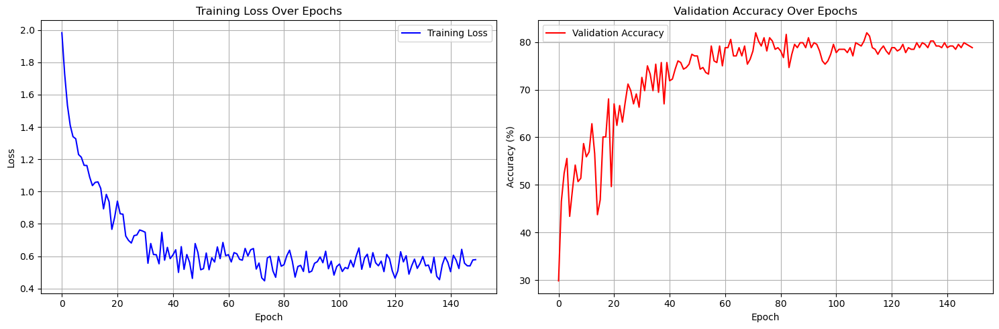


Final Results:
Best Validation Accuracy: 81.94%
Final Training Loss: 0.5785


In [8]:
# Plot training loss and validation accuracy
plt.figure(figsize=(15, 5))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, 'b-', label='Training Loss')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

# Plot validation accuracy
plt.subplot(1, 2, 2)
plt.plot(test_accuracies, 'r-', label='Validation Accuracy')
plt.title('Validation Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

# Print final metrics
print(f"\nFinal Results:")
print(f"Best Validation Accuracy: {max(test_accuracies):.2f}%")
print(f"Final Training Loss: {train_losses[-1]:.4f}")

## Confusion Matrix

The confusion matrix shows:
- Rows: True emotions
- Columns: Predicted emotions
- Numbers: Count of predictions
- Diagonal: Correct predictions
- Off-diagonal: Misclassifications

This helps identify which emotions are commonly confused with each other.

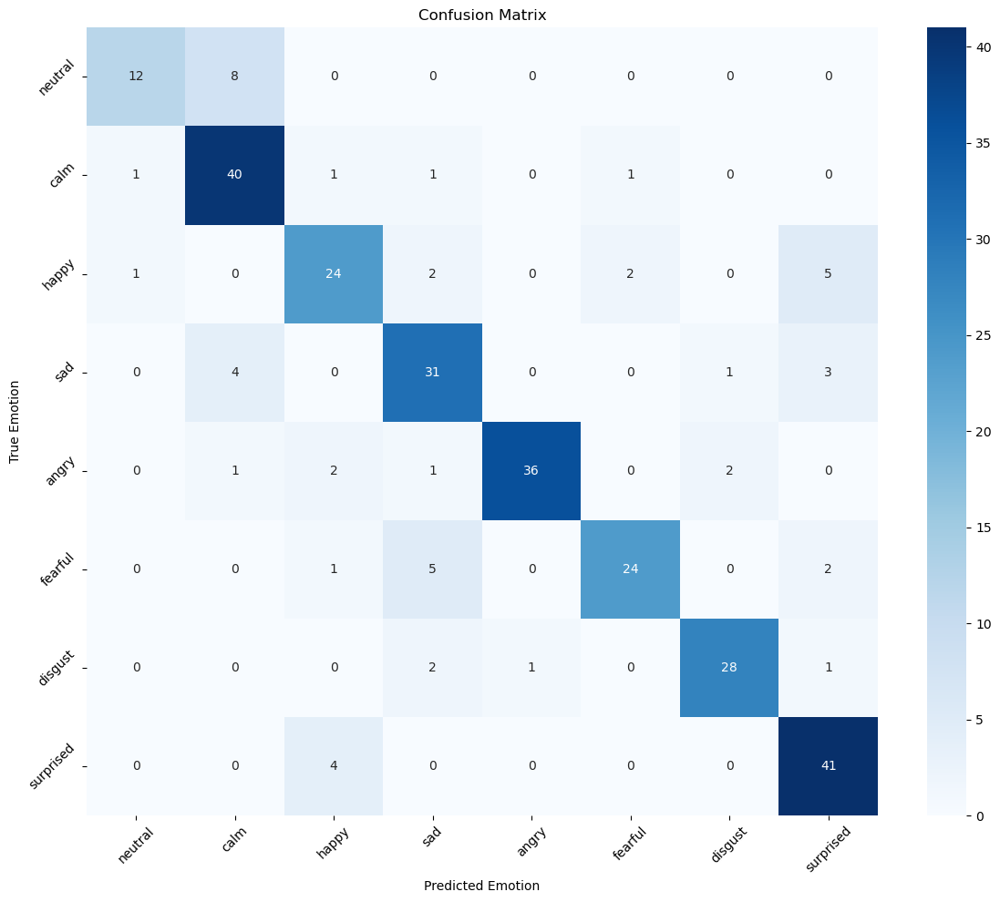


Confusion Matrix Analysis:
Total Correct Predictions: 236
Total Samples: 288
Overall Accuracy: 81.94%

Per-class Accuracy:
neutral: 60.00%
calm: 90.91%
happy: 70.59%
sad: 79.49%
angry: 85.71%
fearful: 75.00%
disgust: 87.50%
surprised: 91.11%


In [9]:
# Create and plot confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(epoch_targets, epoch_predictions)

# Create confusion matrix plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=emotion_labels,
            yticklabels=emotion_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Emotion')
plt.ylabel('True Emotion')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

# Print overall metrics
total_correct = np.sum(np.diag(cm))
total_samples = np.sum(cm)
print(f"\nConfusion Matrix Analysis:")
print(f"Total Correct Predictions: {total_correct}")
print(f"Total Samples: {total_samples}")
print(f"Overall Accuracy: {100 * total_correct / total_samples:.2f}%")

# Calculate per-class accuracy
print("\nPer-class Accuracy:")
for i, emotion in enumerate(emotion_labels):
    class_correct = cm[i, i]
    class_total = np.sum(cm[i, :])
    if class_total > 0:
        class_accuracy = 100 * class_correct / class_total
        print(f"{emotion}: {class_accuracy:.2f}%")